In [1]:
# packages and working directory  
import scipy 
import sklearn

import econml 
import arch
import os 
import pandas as pd 
import numpy as np 
import seaborn as sns 
import matplotlib as plt
import matplotlib.pyplot as plt 
import statsmodels.api as sm 
from statsmodels.discrete.discrete_model import Probit
from statsmodels.iolib.summary2 import summary_col
import statsmodels.formula.api as smf 
from scipy.optimize import minimize,fsolve, approx_fprime
from scipy.special import logsumexp
from scipy import stats
from scipy.stats import ttest_ind
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import biogeme.database as db
import biogeme.biogeme as bio 
import biogeme.models as models 
import biogeme.version as ver 
from biogeme.expressions import Beta, log,Variable
from ipywidgets import interactive, FloatSlider
import ipywidgets as widgets
from mpl_toolkits.mplot3d import Axes3D


# Consolidate changing directory and CPI dictionary since these don't change throughout the script
new_directory = r'C:\Users\hisham\Spain\2021 datasets'
os.chdir(new_directory)


### Begin data  

In [2]:
# Read the data files
df_h0 = pd.read_csv('H0.txt', sep='\t')
df_h1 = pd.read_csv('H1.txt', sep='\t')
df_h2 = pd.read_csv('H2.txt', sep='\t')
df_h3 = pd.read_csv('H3.txt', sep='\t')
filtered_df = pd.read_csv('1hhdmodel.csv')

# Assign scenario identifiers
df_h0['scenario'] = 'h0'
df_h1['scenario'] = 'h1'
df_h2['scenario'] = 'h2'
df_h3['scenario'] = 'h3'

# Concatenate into long format DataFrame
long_df = pd.concat([df_h0, df_h1, df_h2, df_h3], ignore_index=True)

# Merge with filtered_df to include yds_other and other necessary columns
long_df = long_df.merge(filtered_df[['idperson','original_scenario', 'lhw_h0', 'lhw_h1', 'lhw_h2', 'lhw_h3', 'yds_other']], on='idperson', how='left')

# Create 'choice_made' binary variable: 1 if the scenario matches the original choice, 0 otherwise
long_df['choice_made'] = (long_df['scenario'] == long_df['original_scenario']).astype(int)

# Calculate leisure time
long_df['leisure'] = 80 - long_df['lhw']

# Sort by 'idperson'
long_df = long_df.sort_values(by='idperson')

#new household income 
long_df['hyds'] = long_df['yds_other'] + long_df['ils_udb_yds'] 
# Optionally, save the long format DataFrame to a file
long_df.to_csv('long_format_dataset.csv', index=False)
# Display the DataFrame to verify the results
long_df.describe()

,idhh,idperson,idmother,idfather,idpartner,idorighh,idorigperson,dag,dgn,dec,...,il_bsarg_64,il_bsarg_70,lhw_h0,lhw_h1,lhw_h2,lhw_h3,yds_other,choice_made,leisure,hyds
count,2.206000e+04,2.206000e+04,2.206000e+04,2.206000e+04,2.206000e+04,2.206000e+04,2.206000e+04,22060.000000,22060.000000,22060.000000,...,22060.000000,22060.000000,22060.0,22060.000000,22060.000000,22060.000000,22060.000000,22060.000000,22060.000000,22060.000000
mean,4.284189e+06,4.284189e+08,5.804400e+07,3.205459e+07,1.013116e+08,4.284189e+06,4.284189e+08,45.345603,0.488667,0.289937,...,1783.543988,1767.699794,0.0,11.625929,38.158114,57.400544,741.218847,0.250000,53.203853,2241.602700
std,1.522938e+06,1.522938e+08,1.593069e+08,1.218901e+08,1.963874e+08,1.522938e+06,1.522938e+08,10.469094,0.499883,1.232807,...,1940.956636,1939.181839,0.0,3.824172,3.624071,2.967592,1096.668602,0.433023,22.641491,1660.395676
min,8.706000e+05,8.706000e+07,0.000000e+00,0.000000e+00,0.000000e+00,8.706000e+05,8.706000e+07,17.000000,0.000000,0.000000,...,0.000000,-386.280000,0.0,1.000000,26.000000,49.000000,-723.160000,0.000000,-19.000000,-1118.310000
25%,2.928000e+06,2.928000e+08,0.000000e+00,0.000000e+00,0.000000e+00,2.928000e+06,2.928000e+08,38.000000,0.000000,0.000000,...,469.930000,469.930000,0.0,9.000000,35.000000,56.000000,0.000000,0.000000,31.750000,963.190000
50%,4.841200e+06,4.841200e+08,0.000000e+00,0.000000e+00,0.000000e+00,4.841200e+06,4.841200e+08,46.000000,0.000000,0.000000,...,1196.535000,1173.135000,0.0,11.000000,40.000000,57.000000,0.000000,0.000000,54.500000,1921.955000
75%,5.563400e+06,5.563400e+08,0.000000e+00,0.000000e+00,0.000000e+00,5.563400e+06,5.563400e+08,54.000000,1.000000,0.000000,...,2539.367500,2521.600000,0.0,13.000000,40.000000,59.000000,1297.520000,0.250000,79.250000,3050.887500
max,6.201200e+06,6.201200e+08,6.196200e+08,6.194000e+08,6.201100e+08,6.201200e+06,6.201200e+08,65.000000,1.000000,6.000000,...,36671.240000,36671.240000,0.0,25.000000,48.000000,99.000000,12898.360000,1.000000,80.000000,20488.920000


In [14]:
# Assuming long_df is your original DataFrame
mean_age = long_df['dag'].mean()
std_age = long_df['dag'].std()
mean_dncsy = long_df['dncsy'].mean()
std_dncsy = long_df['dncsy'].std()

# Create normalized variables
long_df['normalized_age'] = (long_df['dag'] - mean_age) / std_age
long_df['normalized_dncsy'] = (long_df['dncsy'] - mean_dncsy) / std_dncsy

C:\Users\hisham\AppData\Local\Temp\ipykernel_16556\3912427735.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  long_df['normalized_age'] = (long_df['dag'] - mean_age) / std_age
C:\Users\hisham\AppData\Local\Temp\ipykernel_16556\3912427735.py:9: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  long_df['normalized_dncsy'] = (long_df['dncsy'] - mean_dncsy) / std_dncsy


In [3]:
# Assuming long_df is your original DataFrame
mode_deh = long_df['deh'].mode()[0]
mode_dms = long_df['dms'].mode()[0]
mode_dcz = long_df['dcz'].mode()[0]
mode_lindi = long_df['lindi'].mode()[0]
mode_amrtn = long_df['amrtn'].mode()[0]
mode_les = long_df['les'].mode()[0]
print(mode_deh)
print(mode_dms)
print(mode_dcz)
print(mode_lindi)
print(mode_amrtn)
print(mode_les)

5
1
1
2
1
3


In [4]:
# Create dummy variables without dropping the first category
long_df = pd.get_dummies(long_df, columns=['deh'], prefix='deh', drop_first=False)
long_df = pd.get_dummies(long_df, columns=['dms'], prefix='dms', drop_first=False)
long_df = pd.get_dummies(long_df, columns=['dcz'], prefix='dcz', drop_first=False)
long_df = pd.get_dummies(long_df, columns=['lindi'], prefix='lindi', drop_first=False)
long_df = pd.get_dummies(long_df, columns=['amrtn'], prefix='amrtn', drop_first=False)
long_df = pd.get_dummies(long_df, columns=['les'], prefix='les', drop_first=False)

# List of modes for each categorical variable
modes = {
    'deh': mode_deh,
    'dms': mode_dms,
    'dcz': mode_dcz,
    'lindi': mode_lindi,
    'amrtn': mode_amrtn,
    'les': mode_les
}

# Remove dummy columns corresponding to the mode
for var, mode in modes.items():
    dummy_col = f"{var}_{mode}"
    if dummy_col in long_df.columns:
        long_df = long_df.drop(columns=[dummy_col])


In [5]:
#copy
df = long_df.copy()

In [6]:
#mapping and filtration
def map_lhw(row):
    # Ensure the scenario prefix 'h' is included when constructing the column name
    scenario_prefix = 'h' if not row["scenario"].startswith('h') else ''
    scenario_column_name = f'lhw_{scenario_prefix}{row["scenario"]}'
    return row[scenario_column_name]

# Apply the corrected function
df['lhw_scenario'] = df.apply(map_lhw, axis=1)

# Print a sample to verify the column has been created correctly
print(df[['idperson', 'scenario', 'lhw_scenario']].head())
# Identify individuals with any negative 'ils_udb_yds' values
negative_c_ids = df[df['hyds'] <=  0]['idperson'].unique()
# Identify individuals with any negative 'ils_udb_yds' values
negative_l_ids = df[df['lhw_scenario'] >= 80 ]['idperson'].unique()
print(f"Number of households with negative leisure: {len(negative_l_ids)}")
print(f"Number of households with negative consumption: {len(negative_c_ids)}")


       idperson scenario  lhw_scenario
0      87060001       h0           0.0
11030  87060001       h2          44.0
16545  87060001       h3          57.0
5515   87060001       h1          14.0
1      87070001       h0           0.0
Number of households with negative leisure: 3
Number of households with negative consumption: 74


In [7]:
# Filter df to exclude all rows belonging to individuals identified in step 1 or step 2
df_filtered = df[~df['idperson'].isin(negative_c_ids) & ~df['idperson'].isin(negative_l_ids)]
# Verify the removal
print(f"Original dataframe size: {df.shape}")
print(f"Filtered dataframe size: {df_filtered.shape}")


Original dataframe size: (22060, 409)
Filtered dataframe size: (21752, 409)


In [8]:
# Ensure df_filtered is a copy if it is a slice
df_filtered = df_filtered.copy()
# Creating logs for translog and for quadratic using .loc
df_filtered.loc[:, 'consum'] = np.log(df_filtered['hyds'] + 1)
df_filtered.loc[:, 'logleis'] = np.log(80 - df_filtered['lhw_scenario'] + 1)
df_filtered.loc[:, 'logy'] = np.log(df_filtered['hyds'] + 1)
df_filtered.loc[:, 'logl'] = np.log(80 - df_filtered['lhw_scenario'] + 1)
df_filtered.loc[:, 'logy2'] = df_filtered['logy'] ** 2
df_filtered.loc[:, 'logl2'] = df_filtered['logl'] ** 2
df_filtered.loc[:, 'logyl'] = df_filtered['logy'] * df_filtered['logl']
df_filtered.loc[:, 'leis'] = 80 - df_filtered['lhw_scenario']
df_filtered.loc[:, 'leis2'] = df_filtered['leis'] ** 2
df_filtered.loc[:, 'hyds2'] = df_filtered['hyds'] ** 2
df_filtered.loc[:, 'dag2'] = df_filtered['dag'] ** 2
df_filtered = df_filtered.sort_values(by='idperson')


In [10]:
# Filter the DataFrame to keep only the necessary columns

required_columns = [
'scenario', 'original_scenario', 'lhw_h0', 'lhw_h1', 'lhw_h2', 'lhw_h3', 'yds_other', 'drgru',
'choice_made', 'leisure', 'hyds', 'deh_0', 'deh_1', 'drgur',
'deh_2', 'deh_3', 'deh_4', 'dms_3', 'dms_4', 'dms_5', 'dcz_2', 'dcz_3', 'lindi_0', 'lindi_1', 
'lindi_3', 'lindi_4', 'lindi_5', 'lindi_6', 'lindi_7', 'lindi_8', 'lindi_9', 'lindi_10', 'lindi_11',
'lindi_12', 'amrtn_2', 'amrtn_3', 'amrtn_4', 'amrtn_6', 'les_2', 'les_7', 'lhw_scenario', 'consum', 
'logleis', 'logy', 'logl', 'logy2', 'logl2', 'logyl', 'leis', 'leis2', 'hyds2', 'dag2','dag','idperson','dgn'
]

# Filter the DataFrame
df_long = df_filtered[required_columns]

df_long.to_pickle('longSpan.pickle')


In [367]:
# Make a copy of the filtered DataFrame
long_df = df_filtered.copy()

# List all columns that are scenario-specific
scenario_specific_columns = ['logy', 'logl', 'logy2', 'logl2', 'logyl', 'hyds','leis','leis2','hyds2']

# Identify all columns in the long_df that are not scenario-specific
non_scenario_columns = [col for col in long_df.columns if col not in scenario_specific_columns + ['scenario']]

# Transform to wide format for scenario-specific columns
wide_df = long_df.pivot(index='idperson', columns='scenario', values=scenario_specific_columns)
wide_df.columns = [f'{var}_{scen}' for var, scen in wide_df.columns]
wide_df.reset_index(inplace=True)

# Merge the wide format DataFrame with the non-scenario-specific columns
wide_df = wide_df.merge(long_df[non_scenario_columns].drop_duplicates(), on='idperson', how='left')

# Merge the 'original_scenario' to mark the chosen scenario
wide_df = wide_df.merge(filtered_df[['idperson', 'original_scenario']], on='idperson', how='left')

# Check for the duplicated columns and drop one of them
if 'original_scenario_x' in wide_df.columns and 'original_scenario_y' in wide_df.columns:
    wide_df = wide_df.drop(columns=['original_scenario_x'])
    wide_df = wide_df.rename(columns={'original_scenario_y': 'original_scenario'})
# Convert boolean columns to integers
for col in wide_df.select_dtypes(include='bool').columns:
    wide_df[col] = wide_df[col].astype(int)

In [368]:
# Display the DataFrame to verify the results
print(wide_df.head())


   idperson   logy_h0   logy_h1   logy_h2   logy_h3   logl_h0   logl_h1  \
0  87060001  6.735067  6.936673  7.841831  8.059109  4.394449  4.204693   
1  87060001  6.735067  6.936673  7.841831  8.059109  4.394449  4.204693   
2  87060001  6.735067  6.936673  7.841831  8.059109  4.394449  4.204693   
3  87060001  6.735067  6.936673  7.841831  8.059109  4.394449  4.204693   
4  87070001  7.320891  7.320891  7.320891  7.320891  4.394449  4.262680   

    logl_h2   logl_h3   logy2_h0  ...  amrtn_3  amrtn_4  amrtn_6  les_2  \
0  3.610918  3.178054  45.361130  ...        0        0        1      0   
1  3.610918  3.178054  45.361130  ...        0        0        1      0   
2  3.610918  3.178054  45.361130  ...        0        0        1      0   
3  3.610918  3.178054  45.361130  ...        0        0        1      0   
4  3.912023  3.178054  53.595443  ...        0        0        0      0   

   les_7  lhw_scenario    consum   logleis  dag2  original_scenario  
0      0           0.0  6.73

In [369]:
## mapping
scenario_mapping = {'h0': 0, 'h1': 1, 'h2': 2, 'h3': 3}

wide_df['original_scenario'] = wide_df['original_scenario'].map(scenario_mapping)

wide_df.head()

,idperson,logy_h0,logy_h1,logy_h2,logy_h3,logl_h0,logl_h1,logl_h2,logl_h3,logy2_h0,...,amrtn_3,amrtn_4,amrtn_6,les_2,les_7,lhw_scenario,consum,logleis,dag2,original_scenario
0,87060001,6.735067,6.936673,7.841831,8.059109,4.394449,4.204693,3.610918,3.178054,45.361130,...,0,0,1,0,0,0.0,6.735067,4.394449,1024,2
1,87060001,6.735067,6.936673,7.841831,8.059109,4.394449,4.204693,3.610918,3.178054,45.361130,...,0,0,1,0,0,44.0,7.841831,3.610918,1024,2
2,87060001,6.735067,6.936673,7.841831,8.059109,4.394449,4.204693,3.610918,3.178054,45.361130,...,0,0,1,0,0,57.0,8.059109,3.178054,1024,2
3,87060001,6.735067,6.936673,7.841831,8.059109,4.394449,4.204693,3.610918,3.178054,45.361130,...,0,0,1,0,0,14.0,6.936673,4.204693,1024,2
4,87070001,7.320891,7.320891,7.320891,7.320891,4.394449,4.262680,3.912023,3.178054,53.595443,...,0,0,0,0,1,0.0,7.320891,4.394449,3721,0


In [340]:
# Step 1: Get unique idperson values
unique_ids = long_df['idperson'].unique()

# Step 2: Randomly select 100 unique idperson values
np.random.seed(42)  # Set seed for reproducibility
selected_ids = np.random.choice(unique_ids, size=100, replace=False)

# Step 3: Filter the DataFrame to include only the selected IDs
sampled_df = long_df[long_df['idperson'].isin(selected_ids)]

# Display the sampled DataFrame
sampled_df.head()


,idhh,idperson,idmother,idfather,idpartner,idorighh,idorigperson,dag,dgn,dec,...,logleis,logy,logl,logy2,logl2,logyl,leis,leis2,hyds2,dag2
16553,884000,88400001,0,0,0,884000,88400001,60,0,0,...,3.044522,7.922344,3.044522,62.763542,9.269117,24.119755,20.0,400.0,7.602317e+06,3600
5523,884000,88400001,0,0,0,884000,88400001,60,0,0,...,4.290459,6.394711,4.290459,40.892323,18.408042,27.436246,72.0,5184.0,3.572094e+05,3600
11038,884000,88400001,0,0,0,884000,88400001,60,0,0,...,3.737670,7.550850,3.737670,57.015343,13.970174,28.222585,41.0,1681.0,3.615170e+06,3600
8,884000,88400001,0,0,0,884000,88400001,60,0,0,...,4.394449,6.098748,4.394449,37.194730,19.311183,26.800639,80.0,6400.0,1.974025e+05,3600
11045,894400,89440002,0,0,0,894400,89440002,63,1,0,...,3.713572,7.734288,3.713572,59.819205,13.790617,28.721834,40.0,1600.0,5.218392e+06,3969


In [341]:
#sampled data for stata 
sampled_df.to_stata('householddsamp3.dta')

In [59]:
wide_df.to_csv('ewide_df.csv', index=False)

In [287]:
# Create a Biogeme database
database = db.Database('labour_supply', wide_df)

# Verify the database structure
print(database.data.dtypes)


idperson               int64
logy_h0              float64
logy_h1              float64
logy_h2              float64
logy_h3              float64
logl_h0              float64
logl_h1              float64
logl_h2              float64
logl_h3              float64
logy2_h0             float64
logy2_h1             float64
logy2_h2             float64
logy2_h3             float64
logl2_h0             float64
logl2_h1             float64
logl2_h2             float64
logl2_h3             float64
logyl_h0             float64
logyl_h1             float64
logyl_h2             float64
logyl_h3             float64
hyds_h0              float64
hyds_h1              float64
hyds_h2              float64
hyds_h3              float64
leis_h0              float64
leis_h1              float64
leis_h2              float64
leis_h3              float64
leis2_h0             float64
leis2_h1             float64
leis2_h2             float64
leis2_h3             float64
hyds2_h0             float64
hyds2_h1      

In [89]:
## Defining name of the variables as python variables       

globals().update(database.variables)

In [90]:
# Define variables for each scenario
logy_h0 = Variable('logy_h0')
logl_h0 = Variable('logl_h0')
logy2_h0 = Variable('logy2_h0')
logl2_h0 = Variable('logl2_h0')
logyl_h0 = Variable('logyl_h0')

logy_h1 = Variable('logy_h1')
logl_h1 = Variable('logl_h1')
logy2_h1 = Variable('logy2_h1')
logl2_h1 = Variable('logl2_h1')
logyl_h1 = Variable('logyl_h1')

logy_h2 = Variable('logy_h2')
logl_h2 = Variable('logl_h2')
logy2_h2 = Variable('logy2_h2')
logl2_h2 = Variable('logl2_h2')
logyl_h2 = Variable('logyl_h2')

logy_h3 = Variable('logy_h3')
logl_h3 = Variable('logl_h3')
logy2_h3 = Variable('logy2_h3')
logl2_h3 = Variable('logl2_h3')
logyl_h3 = Variable('logyl_h3')

choice = Variable('original_scenario')

# Define parameters to be estimated
alpha = Beta('alpha', 0, None, None, 0)
beta = Beta('beta', 0, None, None, 0)
gamma_yy = Beta('gamma_yy', 0, None, None, 0)
gamma_ll = Beta('gamma_ll', 0, None, None, 0)
gamma_yl = Beta('gamma_yl', 0, None, None, 0)

In [91]:
 # Define the utility functions
V = {
    0: alpha * logy_h0 + beta * logl_h0 + gamma_yy * logy2_h0 + gamma_ll * logl2_h0 + gamma_yl * logyl_h0,
    1: alpha * logy_h1 + beta * logl_h1 + gamma_yy * logy2_h1 + gamma_ll * logl2_h1 + gamma_yl * logyl_h1,
    2: alpha * logy_h2 + beta * logl_h2 + gamma_yy * logy2_h2 + gamma_ll * logl2_h2 + gamma_yl * logyl_h2,
    3: alpha * logy_h3 + beta * logl_h3 + gamma_yy * logy2_h3 + gamma_ll * logl2_h3 + gamma_yl * logyl_h3
}

# Define the availability of each choice (all choices are available)
av = {0: 1, 1: 1, 2: 1, 3: 1}

# Associate the utility functions with the choice situations
logprob = models.loglogit(V, av, choice)


In [92]:
# Create the Biogeme object
biogeme_model = bio.BIOGEME(database, logprob)
biogeme_model.modelName = 'householdLS2'
# Set the choice variable
biogeme_model.choice = choice

# Estimate the parameters
results = biogeme_model.estimate()

# Print the estimated parameters
print(results.getEstimatedParameters())

              Value  Rob. Std err  Rob. t-test  Rob. p-value
alpha     11.640745      1.784806     6.522136  6.931344e-11
beta      56.651801      1.705011    33.226655  0.000000e+00
gamma_ll  -7.120484      0.132410   -53.776169  0.000000e+00
gamma_yl  -0.446048      0.121082    -3.683847  2.297403e-04
gamma_yy  -0.563236      0.092947    -6.059763  1.363222e-09


In [1]:
# Means
mean_logl = df_filtered['logl'].mean()
mean_logy = df_filtered['logy'].mean()
print(f'Mean log leisure (logl): {mean_logl}')
print(f'Mean log of consumption (logy): {mean_logy}')

NameError: name 'df_filtered' is not defined

In [94]:
# biogeme translog (biased)
res = [ 11.640735,  56.651825,  -0.563236 , -7.120487, -0.446048]   
# Automated calculation of points where marginal utilities become negative
mu_y_neg = np.exp(- (res[0] + res[4] * df_filtered['logl'].mean()) / ( 2 * res[2]))
mu_l_neg = np.exp(- (res[1] + res[4] * df_filtered['logy'].mean()) / (2* res[3]))

print(f"Income level at which MU of income becomes negative: {mu_y_neg}")
print(f"Leisure level at which MU of leisure becomes negative: {mu_l_neg}")

Income level at which MU of income becomes negative: 6603.971254342823
Leisure level at which MU of leisure becomes negative: 42.31006011698379


In [95]:
# Define the utility function with the estimated parameters
def utility(logy, logl, alpha, beta, gamma_yy, gamma_ll, gamma_yl):
    logy2 = logy ** 2
    logl2 = logl ** 2
    logyl = logy * logl
    return alpha * logy + beta * logl + gamma_yy * logy2 + gamma_ll * logl2 + gamma_yl * logyl

# Define the marginal utility function
def marginal_utility_y(y, alpha, gamma_yy, gamma_yl, logl):
    logy = np.log(y)
    return (alpha + 2 * gamma_yy * logy + gamma_yl * logl) / y


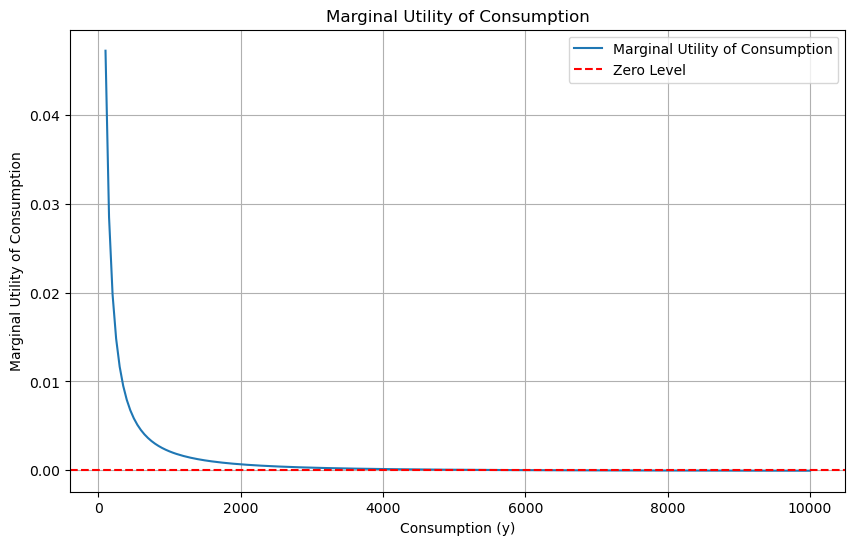

In [96]:
# Estimated parameters and plotting 
alpha = 11.640735
beta =  56.651825
gamma_yy =  -0.563236
gamma_ll = -7.120487
gamma_yl = -0.446048

# Define a range of consumption (y) values
y_values = np.linspace(100, 10000, 200)  # Avoid zero to prevent division by zero

# Calculate the marginal utility for each y value using the mean log leisure (logl)
marginal_utility_values = marginal_utility_y(y_values, alpha, gamma_yy, gamma_yl, mean_logl)

# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(y_values, marginal_utility_values, label='Marginal Utility of Consumption')
plt.axhline(y=0, color='r', linestyle='--', label='Zero Level')
plt.xlabel('Consumption (y)')
plt.ylabel('Marginal Utility of Consumption')
plt.title('Marginal Utility of Consumption')
plt.legend()
plt.grid(True)
plt.show()


In [102]:
# Define the marginal utility functions
def marginal_utility_consumption(y, alpha, gamma_yy, gamma_yl, logl):
    logy = np.log(y)
    return (alpha + 2 * gamma_yy * logy + gamma_yl * logl) / y

def marginal_utility_leisure(l, beta, gamma_ll, gamma_yl, logy):
    return (beta + 2 * gamma_ll * np.log(l) + gamma_yl * logy) / l

# Plotting function for marginal utility of consumption
def plot_marginal_utility_consumption(alpha, gamma_yy, gamma_yl):
    y_values = np.linspace(100, 30000, 200)  # Avoid zero to prevent division by zero
    marginal_utility_values = marginal_utility_consumption(y_values, alpha, gamma_yy, gamma_yl, mean_logl)
    
    plt.figure(figsize=(10, 6))
    plt.plot(y_values, marginal_utility_values, label='Marginal Utility of Consumption')
    plt.axhline(y=0, color='r', linestyle='--', label='Zero Level')
    plt.xlabel('Income (y)')
    plt.ylabel('Marginal Utility of Consumption')
    plt.title('Marginal Utility of Consumption vs. Consumption')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plotting function for marginal utility of leisure
def plot_marginal_utility_leisure(beta, gamma_ll, gamma_yl):
    l_values = np.linspace(1, 100, 100)
    marginal_utility_values = marginal_utility_leisure(l_values, beta, gamma_ll, gamma_yl, mean_logy)
    
    plt.figure(figsize=(10, 6))
    plt.plot(l_values, marginal_utility_values, label='Marginal Utility of Leisure')
    plt.axhline(y=0, color='r', linestyle='--', label='Zero Level')
    plt.xlabel('Leisure (l)')
    plt.ylabel('Marginal Utility of Leisure')
    plt.title('Marginal Utility of Leisure vs. Leisure')
    plt.legend()
    plt.grid(True)
    plt.show()


In [103]:
alpha = 70.199643
beta = 121.882916
gamma_yy = -0.735090
gamma_ll = -8.105418
gamma_yl = -0.474530
# Interactive widgets for marginal utility of consumption
interactive_consumption = interactive(plot_marginal_utility_consumption,
                                      alpha=FloatSlider(value= alpha, min=-5, max=300, step=1),
                                      gamma_yy=FloatSlider(value= gamma_yy, min=-20, max=10, step=0.001),
                                      gamma_yl=FloatSlider(value=gamma_yl, min=-30, max=10, step=0.001))

# Display the interactive plot for marginal utility of consumption
display(interactive_consumption)



# Interactive widgets for marginal utility of leisure
interactive_leisure = interactive(plot_marginal_utility_leisure,
                                  beta=FloatSlider(value= beta, min=-10, max=300, step=1),
                                  gamma_ll=FloatSlider(value= gamma_ll, min=-50, max=10, step=0.001),
                                  gamma_yl=FloatSlider(value=gamma_yl, min=-30, max=10, step=0.001))

# Display the interactive plot for marginal utility of leisure
display(interactive_leisure)


interactive(children=(FloatSlider(value=70.199643, description='alpha', max=300.0, min=-5.0, step=1.0), FloatS…

interactive(children=(FloatSlider(value=121.882916, description='beta', max=300.0, min=-10.0, step=1.0), Float…

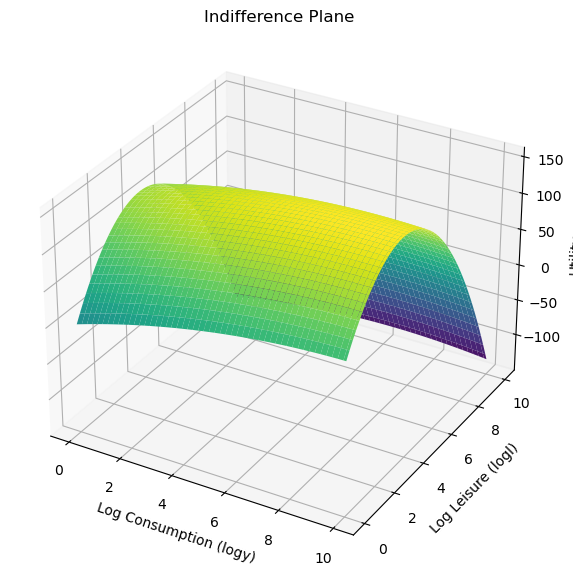

In [104]:
# Define the utility function with the estimated parameters
def utility(logy, logl, alpha, beta, gamma_yy, gamma_ll, gamma_yl):
    logy2 = logy ** 2
    logl2 = logl ** 2
    logyl = logy * logl
    return alpha * logy + beta * logl + gamma_yy * logy2 + gamma_ll * logl2 + gamma_yl * logyl

# Estimated parameters and plotting 
alpha = 11.640735
beta =  56.651825
gamma_yy =  -0.563236
gamma_ll = -7.120487
gamma_yl = -0.446048
# Generate a range of values for log consumption (logy) and log leisure (logl)
logy_values = np.linspace(0, 10, 100)
logl_values = np.linspace(0, 10, 100)

# Create a grid of values
logy_grid, logl_grid = np.meshgrid(logy_values, logl_values)
# Calculate utility for each combination of logy and logl
utility_values = utility(logy_grid, logl_grid, alpha, beta, gamma_yy, gamma_ll, gamma_yl)
# Create a 3D plot
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Plot the surface
ax.plot_surface(logy_grid, logl_grid, utility_values, cmap='viridis')

# Set labels
ax.set_xlabel('Log Consumption (logy)')
ax.set_ylabel('Log Leisure (logl)')
ax.set_zlabel('Utility')

# Set title
ax.set_title('Indifference Plane')

# Show the plot
plt.show()


## Introducing Heterigeneity 

In [16]:
# Assuming wide_df is your transformed DataFrame
database = db.Database('labour_supply', wide_df)

globals().update(database.variables)

In [108]:
# Define variables for each scenario
logy_h0 = Variable('logy_h0')
logl_h0 = Variable('logl_h0')
logy2_h0 = Variable('logy2_h0')
logl2_h0 = Variable('logl2_h0')
logyl_h0 = Variable('logyl_h0')

logy_h1 = Variable('logy_h1')
logl_h1 = Variable('logl_h1')
logy2_h1 = Variable('logy2_h1')
logl2_h1 = Variable('logl2_h1')
logyl_h1 = Variable('logyl_h1')

logy_h2 = Variable('logy_h2')
logl_h2 = Variable('logl_h2')
logy2_h2 = Variable('logy2_h2')
logl2_h2 = Variable('logl2_h2')
logyl_h2 = Variable('logyl_h2')

logy_h3 = Variable('logy_h3')
logl_h3 = Variable('logl_h3')
logy2_h3 = Variable('logy2_h3')
logl2_h3 = Variable('logl2_h3')
logyl_h3 = Variable('logyl_h3')

# Define demographic variables
dag = Variable('dag')
dgn = Variable('dgn')  # Binary for gender

# Create dummy variables for education levels
deh_levels = [f'deh_{i}' for i in range(1, 6)]  # Create variable names for education levels



In [109]:
# Define parameters to be estimated
alpha = Beta('alpha', 0, None, None, 0)
beta = Beta('beta', 0, None, None, 0)
gamma_yy = Beta('gamma_yy', 0, None, None, 0)
gamma_ll = Beta('gamma_ll', 0, None, None, 0)
gamma_yl = Beta('gamma_yl', 0, None, None, 0)

# Define heterogeneity parameters for age and gender
alpha_dag = Beta('alpha_dag', 0, None, None, 0)
alpha_dgn = Beta('alpha_dgn', 0, None, None, 0)

beta_dag = Beta('beta_dag', 0, None, None, 0)
beta_dgn = Beta('beta_dgn', 0, None, None, 0)

# Define heterogeneity parameters for education levels
alpha_deh = {level: Beta(f'alpha_{level}', 0, None, None, 0) for level in deh_levels}
beta_deh = {level: Beta(f'beta_{level}', 0, None, None, 0) for level in deh_levels}

# Define the utility functions with heterogeneity
V = {
    0: (alpha + alpha_dag * dag + alpha_dgn * dgn + sum(alpha_deh[level] * Variable(level) for level in deh_levels)) * logy_h0 + 
       (beta + beta_dag * dag + beta_dgn * dgn + sum(beta_deh[level] * Variable(level) for level in deh_levels)) * logl_h0 + 
       gamma_yy * logy2_h0 + gamma_ll * logl2_h0 + gamma_yl * logyl_h0,
    1: (alpha + alpha_dag * dag + alpha_dgn * dgn + sum(alpha_deh[level] * Variable(level) for level in deh_levels)) * logy_h1 + 
       (beta + beta_dag * dag + beta_dgn * dgn + sum(beta_deh[level] * Variable(level) for level in deh_levels)) * logl_h1 + 
       gamma_yy * logy2_h1 + gamma_ll * logl2_h1 + gamma_yl * logyl_h1,
    2: (alpha + alpha_dag * dag + alpha_dgn * dgn + sum(alpha_deh[level] * Variable(level) for level in deh_levels)) * logy_h2 + 
       (beta + beta_dag * dag + beta_dgn * dgn + sum(beta_deh[level] * Variable(level) for level in deh_levels)) * logl_h2 + 
       gamma_yy * logy2_h2 + gamma_ll * logl2_h2 + gamma_yl * logyl_h2,
    3: (alpha + alpha_dag * dag + alpha_dgn * dgn + sum(alpha_deh[level] * Variable(level) for level in deh_levels)) * logy_h3 + 
       (beta + beta_dag * dag + beta_dgn * dgn + sum(beta_deh[level] * Variable(level) for level in deh_levels)) * logl_h3 + 
       gamma_yy * logy2_h3 + gamma_ll * logl2_h3 + gamma_yl * logyl_h3
}


In [110]:
# Define the availability of each choice (all choices are available)
av = {0: 1, 1: 1, 2: 1, 3: 1}

# Associate the utility functions with the choice situations
logprob = models.loglogit(V, av, choice)

# Create the Biogeme object
biogeme_model = bio.BIOGEME(database, logprob)
biogeme_model.modelName = 'householdLS_heterogeneity1'
# Set the choice variable
biogeme_model.choice = choice

# Estimate the parameters
results = biogeme_model.estimate()

# Print the estimated parameters
print(results.getEstimatedParameters())


                 Value  Rob. Std err  Rob. t-test  Rob. p-value
alpha        10.814327      1.851954     5.839414  5.238472e-09
alpha_dag     0.045491      0.008107     5.611061  2.010897e-08
alpha_deh_1   1.157615      0.656356     1.763701  7.778241e-02
alpha_deh_2   1.209331      0.617958     1.956979  5.034998e-02
alpha_deh_3   1.608367      0.614315     2.618146  8.840898e-03
alpha_deh_4   3.469003      1.973970     1.757374  7.885411e-02
alpha_deh_5   2.418429      0.614171     3.937716  8.226072e-05
alpha_dgn     0.342620      0.180127     1.902106  5.715733e-02
beta         57.883462      1.932772    29.948415  0.000000e+00
beta_dag      0.018907      0.005883     3.213973  1.309122e-03
beta_deh_1    0.134612      0.709310     0.189778  8.494830e-01
beta_deh_2   -0.443293      0.681032    -0.650913  5.151025e-01
beta_deh_3    0.090014      0.677732     0.132817  8.943381e-01
beta_deh_4    2.253580      1.237926     1.820448  6.869085e-02
beta_deh_5    0.154766      0.676677    

In [ ]:
# Define the utility function with the estimated parameters
def utility(logy, logl, alpha, beta, gamma_yy, gamma_ll, gamma_yl):
    logy2 = logy ** 2
    logl2 = logl ** 2
    logyl = logy * logl
    return alpha * logy + beta * logl + gamma_yy * logy2 + gamma_ll * logl2 + gamma_yl * logyl

# Define the marginal utility function
def marginal_utility_y(y, alpha, gamma_yy, gamma_yl, logl):
    logy = np.log(y)
    return (alpha + 2 * gamma_yy * logy + gamma_yl * logl) / y

In [112]:
# biogeme translog (Hetero max)
res = [ 10.814327,  57.883462,  -0.797253, -7.357770 ,-0.448134]   
# Automated calculation of points where marginal utilities become negative
mu_y_neg = np.exp(- (res[0] + res[4] * df_filtered['logl'].mean()) / ( 2 * res[2]))
mu_l_neg = np.exp(- (res[1] + res[4] * df_filtered['logy'].mean()) / (2* res[3]))

print(f"Income level at which MU of income becomes negative: {mu_y_neg}")
print(f"Leisure level at which MU of leisure becomes negative: {mu_l_neg}")

Income level at which MU of income becomes negative: 295.9957400086651
Leisure level at which MU of leisure becomes negative: 40.727029156481606


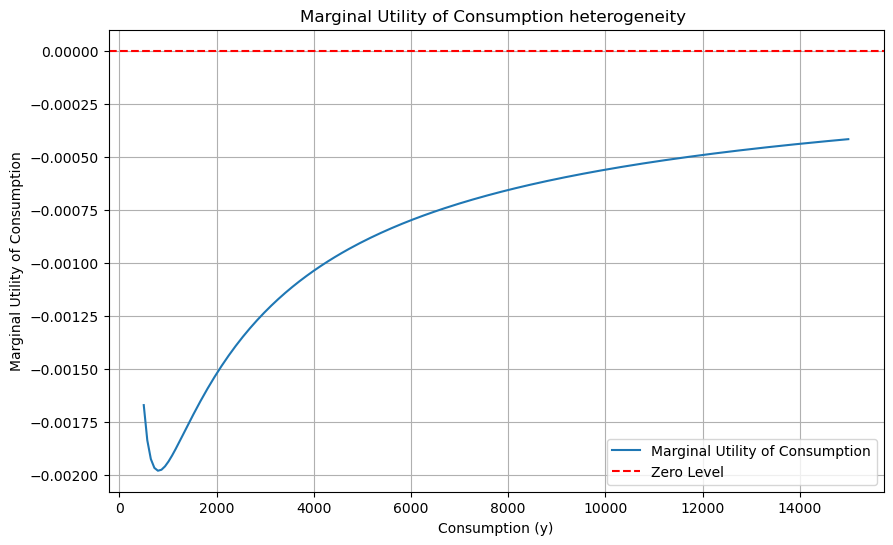

In [113]:
# Estimated parameters and plotting 
alpha = 10.814327
beta =  57.883462 
gamma_yy =  -0.797253
gamma_ll = -7.357770
gamma_yl =  -0.448134

# Define a range of consumption (y) values
y_values = np.linspace(500, 15000, 200)  # Avoid zero to prevent division by zero

# Calculate the marginal utility for each y value using the mean log leisure (logl)
marginal_utility_values = marginal_utility_y(y_values, alpha, gamma_yy, gamma_yl, df_filtered['logl'].mean())

# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(y_values, marginal_utility_values, label='Marginal Utility of Consumption')
plt.axhline(y=0, color='r', linestyle='--', label='Zero Level')
plt.xlabel('Consumption (y)')
plt.ylabel('Marginal Utility of Consumption')
plt.title('Marginal Utility of Consumption heterogeneity ')
plt.legend()
plt.grid(True)
plt.show()


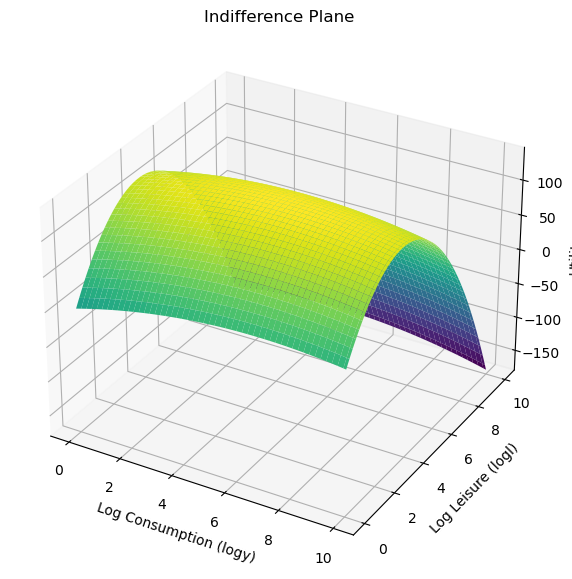

In [114]:
# Define the utility function with the estimated parameters
def utility(logy, logl, alpha, beta, gamma_yy, gamma_ll, gamma_yl):
    logy2 = logy ** 2
    logl2 = logl ** 2
    logyl = logy * logl
    return alpha * logy + beta * logl + gamma_yy * logy2 + gamma_ll * logl2 + gamma_yl * logyl

# Estimated parameters and plotting 
alpha = 10.814327
beta =  57.883462 
gamma_yy =  -0.797253
gamma_ll = -7.357770
gamma_yl =  -0.448134
# Generate a range of values for log consumption (logy) and log leisure (logl)
logy_values = np.linspace(0, 10, 100)
logl_values = np.linspace(0, 10, 100)

# Create a grid of values
logy_grid, logl_grid = np.meshgrid(logy_values, logl_values)
# Calculate utility for each combination of logy and logl
utility_values = utility(logy_grid, logl_grid, alpha, beta, gamma_yy, gamma_ll, gamma_yl)
# Create a 3D plot
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Plot the surface
ax.plot_surface(logy_grid, logl_grid, utility_values, cmap='viridis')

# Set labels
ax.set_xlabel('Log Consumption (logy)')
ax.set_ylabel('Log Leisure (logl)')
ax.set_zlabel('Utility')

# Set title
ax.set_title('Indifference Plane')

# Show the plot
plt.show()

In [116]:
#Parmas 
# Define the coefficients as obtained from your model
alpha = 10.814327 
beta = 57.883462
gamma_yy = -0.797253 
gamma_ll = -7.357770
gamma_yl = -0.448134

# Define the heterogeneity parameters
alpha_dag = 0.045491
alpha_dgn = 0.342620
alpha_deh = [ 1.157615 , 1.209331, 1.608367,  3.469003 , 2.418429]

beta_dag = -0.009658
beta_dgn = -1.092093
beta_deh = [0.134612, -0.443293, 0.090014,  2.253580 ,  0.154766]

In [117]:
# Define the utility computation function
def compute_utility(row):
    # Extract the required values from the row
    logy = row['logy']
    logl = row['logl']
    logy2 = row['logy2']
    logl2 = row['logl2']
    logyl = row['logyl']
    
    # Heterogeneity components
    deh_levels = [row[f'deh_{i+1}'] for i in range(len(alpha_deh))]

    alpha_part = (alpha + alpha_dag * row['dag'] + alpha_dgn * row['dgn'] +
                  sum(alpha_deh[i] * deh_levels[i] for i in range(len(alpha_deh)))) * logy
    

    beta_part = (beta + beta_dag * row['dag'] + beta_dgn * row['dgn'] +
                  sum(beta_deh[i] * deh_levels[i] for i in range(len(beta_deh)))) * logl

    # Compute the utility
    utility = alpha_part + beta_part + gamma_yy * logy2 + gamma_ll * logl2 + gamma_yl * logyl
    return utility


In [118]:
# Compute utilities for each observation
long_df['utility'] = long_df.apply(compute_utility, axis=1)

# Determine the predicted choice by selecting the scenario with the highest utility for each person
long_df['utility_idx'] = long_df.groupby('idperson')['utility'].transform(lambda x: x.idxmax())
long_df['predicted_choice'] = long_df.loc[long_df['utility_idx'], 'scenario'].values

# Drop the utility_idx column
long_df.drop(columns=['utility_idx'], inplace=True)


In [119]:
# Display the dataframe with utilities and predicted choices
long_df[['idperson', 'scenario', 'utility', 'predicted_choice', 'leisure','hyds','original_scenario']].head()


,idperson,scenario,utility,predicted_choice,leisure,hyds,original_scenario
0,87060001,h0,158.609227,h2,80,840.40,h2
11030,87060001,h2,164.731150,h2,36,2543.86,h2
16545,87060001,h3,163.560484,h2,23,3161.47,h2
5515,87060001,h1,160.893695,h2,66,1028.34,h2
1,87070001,h0,158.934548,h2,80,1510.55,h0


In [120]:
# Add 'choice_made' column: 1 if the scenario is the same as the original_scenario, otherwise 0
long_df['choice_made'] = (long_df['scenario'] == long_df['original_scenario']).astype(int)

# Add 'predicted_choice_binary' column: 1 if the scenario is the same as the predicted_choice, otherwise 0
long_df['predicted_choice_binary'] = (long_df['scenario'] == long_df['predicted_choice']).astype(int)


In [121]:
# Filter the DataFrame to keep only the rows where 'scenario' matches 'original_scenario'
filtered_df = long_df[long_df['scenario'] == long_df['original_scenario']]
# Create a pivot table to count the occurrences of each combination of original and predicted choices
confusion_matrix = pd.crosstab(filtered_df['original_scenario'], filtered_df['predicted_choice'], rownames=['Original Choice'], colnames=['Predicted Choice'])

# Add the row and column totals
confusion_matrix['Total'] = confusion_matrix.sum(axis=1)
confusion_matrix.loc['Total'] = confusion_matrix.sum(axis=0)

# Display the confusion matrix with totals
print(confusion_matrix)

# If needed, save the confusion matrix to a CSV file
confusion_matrix.to_csv('confusion_matrix_with_totals.csv')

Predicted Choice  h1    h2   h3  Total
Original Choice                       
h0                 0    61    0     61
h1                 1   542   18    561
h2                 0  4185   67   4252
h3                 0   324  240    564
Total              1  5112  325   5438


# 80.18%

## DO NOT RERUN TIME CONSUMING

In [167]:
# Define variables for each scenario
logy_h0 = Variable('logy_h0')
logl_h0 = Variable('logl_h0')
logy2_h0 = Variable('logy2_h0')
logl2_h0 = Variable('logl2_h0')
logyl_h0 = Variable('logyl_h0')

logy_h1 = Variable('logy_h1')
logl_h1 = Variable('logl_h1')
logy2_h1 = Variable('logy2_h1')
logl2_h1 = Variable('logl2_h1')
logyl_h1 = Variable('logyl_h1')

logy_h2 = Variable('logy_h2')
logl_h2 = Variable('logl_h2')
logy2_h2 = Variable('logy2_h2')
logl2_h2 = Variable('logl2_h2')
logyl_h2 = Variable('logyl_h2')

logy_h3 = Variable('logy_h3')
logl_h3 = Variable('logl_h3')
logy2_h3 = Variable('logy2_h3')
logl2_h3 = Variable('logl2_h3')
logyl_h3 = Variable('logyl_h3')

choice = Variable('original_scenario')

# Define heterogeneity variables
dag = Variable('dag')
dgn = Variable('dgn')
dncsy = Variable('dncsy')
drgur = Variable('drgur')

# Create dummy variables for education levels and other categorical variables
# Create dummy variables for education levels and other categorical variables
deh_levels = [col for col in wide_df.columns if 'deh_' in col]
dms_levels = [col for col in wide_df.columns if 'dms_' in col]
dcz_levels = [col for col in wide_df.columns if 'dcz_' in col]
lindi_levels = [col for col in wide_df.columns if 'lindi_' in col]
amrtn_levels = [col for col in wide_df.columns if 'amrtn_' in col]

# Define parameters to be estimated
alpha = Beta('alpha', 0, None, None, 0)
beta = Beta('beta', 0, None, None, 0)
gamma_yy = Beta('gamma_yy', 0, None, None, 0)
gamma_ll = Beta('gamma_ll', 0, None, None, 0)
gamma_yl = Beta('gamma_yl', 0, None, None, 0)

# Define heterogeneity parameters for age and gender
alpha_dag = Beta('alpha_dag', 0, None, None, 0)
alpha_dgn = Beta('alpha_dgn', 0, None, None, 0)
alpha_dncsy = Beta('alpha_dncsy', 0, None, None, 0)

beta_dag = Beta('beta_dag', 0, None, None, 0)
beta_dgn = Beta('beta_dgn', 0, None, None, 0)
beta_dncsy = Beta('beta_dncsy', 0, None, None, 0)

# Define heterogeneity parameters for education levels and other categorical variables
alpha_deh = {level: Beta(f'alpha_{level}', 0, None, None, 0) for level in deh_levels}
beta_deh = {level: Beta(f'beta_{level}', 0, None, None, 0) for level in deh_levels}

alpha_dms = {level: Beta(f'alpha_{level}', 0, None, None, 0) for level in dms_levels}
beta_dms = {level: Beta(f'beta_{level}', 0, None, None, 0) for level in dms_levels}

alpha_dcz = {level: Beta(f'alpha_{level}', 0, None, None, 0) for level in dcz_levels}
beta_dcz = {level: Beta(f'beta_{level}', 0, None, None, 0) for level in dcz_levels}

alpha_lindi = {level: Beta(f'alpha_{level}', 0, None, None, 0) for level in lindi_levels}
beta_lindi = {level: Beta(f'beta_{level}', 0, None, None, 0) for level in lindi_levels}

alpha_amrtn = {level: Beta(f'alpha_{level}', 0, None, None, 0) for level in amrtn_levels}
beta_amrtn = {level: Beta(f'beta_{level}', 0, None, None, 0) for level in amrtn_levels}

In [168]:
# Define the utility functions with heterogeneity
V = {
    0: (alpha + alpha_dag * dag + alpha_dgn * dgn + alpha_dncsy * dncsy +
        sum(alpha_deh[level] * Variable(level) for level in deh_levels) +
        sum(alpha_dms[level] * Variable(level) for level in dms_levels) +
        sum(alpha_dcz[level] * Variable(level) for level in dcz_levels) +
        sum(alpha_lindi[level] * Variable(level) for level in lindi_levels) +
        sum(alpha_amrtn[level] * Variable(level) for level in amrtn_levels)) * logy_h0 + 
       (beta + beta_dag * dag + beta_dgn * dgn + beta_dncsy * dncsy +
        sum(beta_deh[level] * Variable(level) for level in deh_levels) +
        sum(beta_dms[level] * Variable(level) for level in dms_levels) +
        sum(beta_dcz[level] * Variable(level) for level in dcz_levels) +
        sum(beta_lindi[level] * Variable(level) for level in lindi_levels) +
        sum(beta_amrtn[level] * Variable(level) for level in amrtn_levels)) * logl_h0 + 
       gamma_yy * logy2_h0 + gamma_ll * logl2_h0 + gamma_yl * logyl_h0,
    1: (alpha + alpha_dag * dag + alpha_dgn * dgn + alpha_dncsy * dncsy +
        sum(alpha_deh[level] * Variable(level) for level in deh_levels) +
        sum(alpha_dms[level] * Variable(level) for level in dms_levels) +
        sum(alpha_dcz[level] * Variable(level) for level in dcz_levels) +
        sum(alpha_lindi[level] * Variable(level) for level in lindi_levels) +
        sum(alpha_amrtn[level] * Variable(level) for level in amrtn_levels)) * logy_h1 + 
       (beta + beta_dag * dag + beta_dgn * dgn + beta_dncsy * dncsy +
        sum(beta_deh[level] * Variable(level) for level in deh_levels) +
        sum(beta_dms[level] * Variable(level) for level in dms_levels) +
        sum(beta_dcz[level] * Variable(level) for level in dcz_levels) +
        sum(beta_lindi[level] * Variable(level) for level in lindi_levels) +
        sum(beta_amrtn[level] * Variable(level) for level in amrtn_levels)) * logl_h1 +  
       gamma_yy * logy2_h1 + gamma_ll * logl2_h1 + gamma_yl * logyl_h1,
    2: (alpha + alpha_dag * dag + alpha_dgn * dgn + alpha_dncsy * dncsy +
        sum(alpha_deh[level] * Variable(level) for level in deh_levels) +
        sum(alpha_dms[level] * Variable(level) for level in dms_levels) +
        sum(alpha_dcz[level] * Variable(level) for level in dcz_levels) +
        sum(alpha_lindi[level] * Variable(level) for level in lindi_levels) +
        sum(alpha_amrtn[level] * Variable(level) for level in amrtn_levels)) * logy_h2 + 
       (beta + beta_dag * dag + beta_dgn * dgn + beta_dncsy * dncsy +
        sum(beta_deh[level] * Variable(level) for level in deh_levels) +
        sum(beta_dms[level] * Variable(level) for level in dms_levels) +
        sum(beta_dcz[level] * Variable(level) for level in dcz_levels) +
        sum(beta_lindi[level] * Variable(level) for level in lindi_levels) +
        sum(beta_amrtn[level] * Variable(level) for level in amrtn_levels)) * logl_h2 + 
       gamma_yy * logy2_h2 + gamma_ll * logl2_h2 + gamma_yl * logyl_h2,
    3: (alpha + alpha_dag * dag + alpha_dgn * dgn + alpha_dncsy * dncsy +
        sum(alpha_deh[level] * Variable(level) for level in deh_levels) +
        sum(alpha_dms[level] * Variable(level) for level in dms_levels) +
        sum(alpha_dcz[level] * Variable(level) for level in dcz_levels) +
        sum(alpha_lindi[level] * Variable(level) for level in lindi_levels) +
        sum(alpha_amrtn[level] * Variable(level) for level in amrtn_levels)) * logy_h3 + 
       (beta + beta_dag * dag + beta_dgn * dgn + beta_dncsy * dncsy +
        sum(beta_deh[level] * Variable(level) for level in deh_levels) +
        sum(beta_dms[level] * Variable(level) for level in dms_levels) +
        sum(beta_dcz[level] * Variable(level) for level in dcz_levels) +
        sum(beta_lindi[level] * Variable(level) for level in lindi_levels) +
        sum(beta_amrtn[level] * Variable(level) for level in amrtn_levels)) * logl_h3 + 
       gamma_yy * logy2_h3 + gamma_ll * logl2_h3+ gamma_yl * logyl_h3,
}




In [169]:
# Define the availability of each choice (all choices are available)
av = {0: 1, 1: 1, 2: 1, 3: 1}

# Associate the utility functions with the choice situations
logprob = models.loglogit(V, av, choice)

# Create the Biogeme object
biogeme_model = bio.BIOGEME(database, logprob)
biogeme_model.modelName = 'householdLS_superhetero'
# Set the choice variable
biogeme_model.choice = choice

# Estimate the parameters
results = biogeme_model.estimate()

# Print the estimated parameters
print(results.getEstimatedParameters())

It seems that the optimization algorithm did not converge. Therefore, the results may not correspond to the maximum likelihood estimator. Check the specification of the model, or the criteria for convergence of the algorithm.


                   Value  Rob. Std err  Rob. t-test  Rob. p-value
alpha          67.192372      2.263256    29.688369  0.000000e+00
alpha_amrtn_2  -0.999267      0.213621    -4.677751  2.900388e-06
alpha_amrtn_3  -1.024975      0.216092    -4.743231  2.103361e-06
alpha_amrtn_4  -2.037332      0.420552    -4.844422  1.269808e-06
alpha_amrtn_6  -1.504234      0.280764    -5.357648  8.431238e-08
...                  ...           ...          ...           ...
beta_lindi_8  -53.681453      1.178317   -45.557717  0.000000e+00
beta_lindi_9  -52.304592      1.192534   -43.860047  0.000000e+00
gamma_ll       -8.302559      0.158594   -52.350865  0.000000e+00
gamma_yl       -0.486483      0.120627    -4.032963  5.507788e-05
gamma_yy       -1.003247      0.088440   -11.343811  0.000000e+00

[63 rows x 4 columns]


In [176]:
print(results)


Results for model householdLS_superhetero
Output file (HTML):			householdLS_superhetero.html
Nbr of parameters:		63
Sample size:			21752
Excluded data:			0
Init log likelihood:		-30154.67
Final log likelihood:		-12502.78
Likelihood ratio test (init):		35303.79
Rho square (init):			0.585
Rho bar square (init):			0.583
Akaike Information Criterion:	25131.56
Bayesian Information Criterion:	25634.77
Final gradient norm:		8.002056
alpha          : 67.2[9.43 7.13 1.01e-12][2.26 29.7 0]
alpha_amrtn_2  : -0.999[0.199 -5.02 5.24e-07][0.214 -4.68 2.9e-06]
alpha_amrtn_3  : -1.02[0.216 -4.75 2.07e-06][0.216 -4.74 2.1e-06]
alpha_amrtn_4  : -2.04[0.382 -5.34 9.34e-08][0.421 -4.84 1.27e-06]
alpha_amrtn_6  : -1.5[0.27 -5.58 2.44e-08][0.281 -5.36 8.43e-08]
alpha_dag      : 0.0183[0.00791 2.32 0.0205][0.00821 2.23 0.0257]
alpha_dcz_2    : -1.91[0.304 -6.3 2.96e-10][0.404 -4.74 2.13e-06]
alpha_dcz_3    : -1.34[0.282 -4.75 2.05e-06][0.256 -5.23 1.73e-07]
alpha_deh_1    : 1.27[0.588 2.17 0.0302][0.708 1.8

In [174]:
# biogeme translog (Hetero max)
res = [ 67.192372,  120,  -1.003247 , -8.302559 , -0.486483 ]   
# Automated calculation of points where marginal utilities become negative
mu_y_neg = np.exp(- (res[0] + res[4] * df_filtered['logl'].mean()) / ( 2 * res[2]))
mu_l_neg = np.exp(- (res[1] + res[4] * df_filtered['logy'].mean()) / (2* res[3]))

print(f"Income level at which MU of income becomes negative: {mu_y_neg}")
print(f"Leisure level at which MU of leisure becomes negative: {mu_l_neg}")

Income level at which MU of income becomes negative: 136247939089312.58
Leisure level at which MU of leisure becomes negative: 1106.202931615763


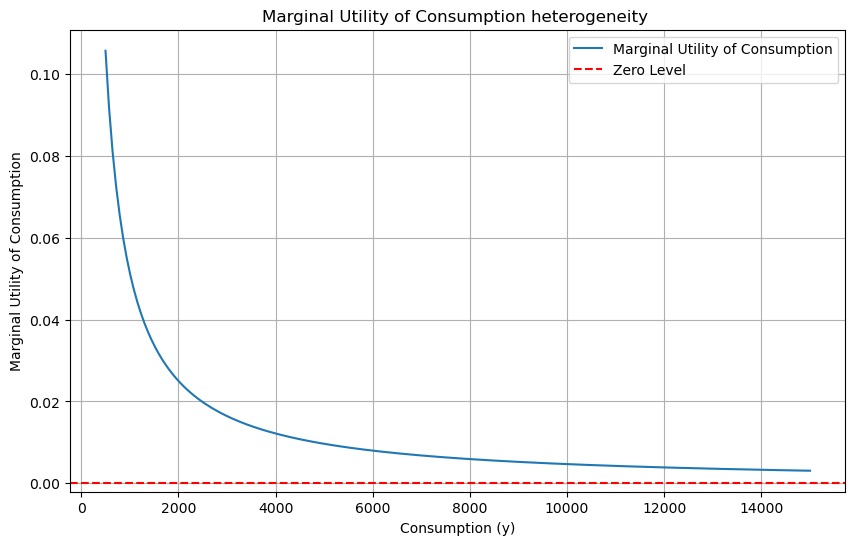

In [175]:
# Estimated parameters and plotting 
alpha = 67.192372
beta = 120
gamma_yy = -1.003247
gamma_ll = -8.302559
gamma_yl = -0.486483

# Define a range of consumption (y) values
y_values = np.linspace(500, 15000, 200)  # Avoid zero to prevent division by zero

# Calculate the marginal utility for each y value using the mean log leisure (logl)
marginal_utility_values = marginal_utility_y(y_values, alpha, gamma_yy, gamma_yl, df_filtered['logl'].mean())

# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(y_values, marginal_utility_values, label='Marginal Utility of Consumption')
plt.axhline(y=0, color='r', linestyle='--', label='Zero Level')
plt.xlabel('Consumption (y)')
plt.ylabel('Marginal Utility of Consumption')
plt.title('Marginal Utility of Consumption heterogeneity ')
plt.legend()
plt.grid(True)
plt.show()


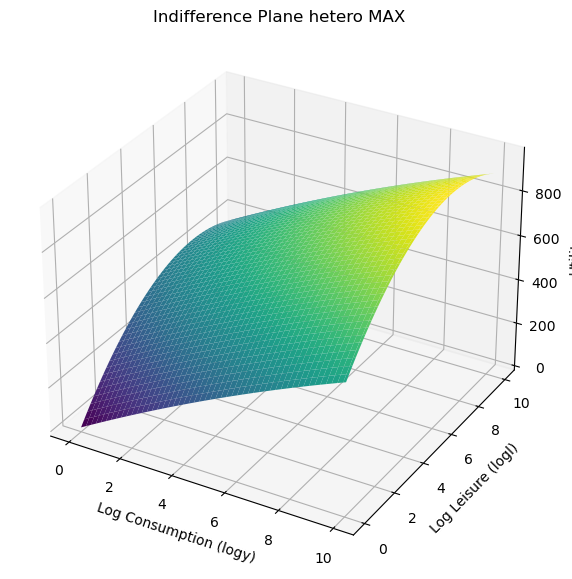

In [178]:
# Define the utility function with the estimated parameters
def utility(logy, logl, alpha, beta, gamma_yy, gamma_ll, gamma_yl):
    logy2 = logy ** 2
    logl2 = logl ** 2
    logyl = logy * logl
    return alpha * logy + beta * logl + gamma_yy * logy2 + gamma_ll * logl2 + gamma_yl * logyl

# Estimated parameters and plotting 
alpha = 67.192372
beta = 120
gamma_yy = -1.003247
gamma_ll = -8.302559
gamma_yl = -0.486483
# Generate a range of values for log consumption (logy) and log leisure (logl)
logy_values = np.linspace(0, 10, 100)
logl_values = np.linspace(0, 10, 100)

# Create a grid of values
logy_grid, logl_grid = np.meshgrid(logy_values, logl_values)
# Calculate utility for each combination of logy and logl
utility_values = utility(logy_grid, logl_grid, alpha, beta, gamma_yy, gamma_ll, gamma_yl)
# Create a 3D plot
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Plot the surface
ax.plot_surface(logy_grid, logl_grid, utility_values, cmap='viridis')

# Set labels
ax.set_xlabel('Log Consumption (logy)')
ax.set_ylabel('Log Leisure (logl)')
ax.set_zlabel('Utility')

# Set title
ax.set_title('Indifference Plane hetero MAX')

# Show the plot
plt.show()

In [179]:
#Parmas 
# Define the coefficients as obtained from your model
alpha = 67.192372
beta = 120
gamma_yy = -1.003247
gamma_ll = -8.302559
gamma_yl = -0.486483

# Define the heterogeneity parameters
alpha_dag = 0.0183
alpha_dgn = 0.537
alpha_dncsy = -3
alpha_deh = [ 1.27, 1.11, 1.62, 3.03, 2.17]
alpha_dms = [0.079, -0.367,0.575]
alpha_dcz = [-1.91, -1.34]
alpha_lindi = [-53.5, -51.3, -50.8, -53.2, -51, -52, -50.5, -52.9, -53.6, -50, -51.5, -50.5]
alpha_amrtn = [-0.999, -1.02, -2.04, -1.5]
beta_dag = -0.0126
beta_dgn = -0.969
beta_dncsy = -2.92
beta_deh = [ 0.151, -0.5,  0.107, 1.15,-0.357]
beta_dms = [0.241, -0.312,0.476]
beta_dcz = [-1.83, -0.404]
beta_lindi = [-56.4, -52.8, -53.3, -54.1, -53.3, -54.4, -53.5, -55.6, -56, -51.6, -53.7, -52.3]
beta_amrtn = [-0.0223, -0.0526, -0.942, -0.0423]


In [181]:
# Define the utility computation function
def compute_utility(row):
    # Extract the required values from the row
    logy = row['logy']
    logl = row['logl']
    logy2 = row['logy2']
    logl2 = row['logl2']
    logyl = row['logyl']
    
    # Heterogeneity components
    deh_levels = [row[f'deh_{i+1}'] for i in range(len(alpha_deh))]
    dms_levels = [row[f'dms_{i+3}'] for i in range(len(alpha_dms))]
    dcz_levels = [row[f'dcz_{i+2}'] for i in range(len(alpha_dcz))]
    lindi_levels = [row[f'lindi_{i+1}'] for i in range(len(alpha_lindi))]
    amrtn_levels = [row[f'amrtn_{i}'] for i in [2, 3, 4, 6]]

    alpha_part = (alpha + alpha_dag * row['dag'] + alpha_dgn * row['dgn'] + alpha_dncsy * row['dncsy'] +
                  sum(alpha_deh[i] * deh_levels[i] for i in range(len(alpha_deh))) +
                  sum(alpha_dms[i] * dms_levels[i] for i in range(len(alpha_dms))) +
                  sum(alpha_dcz[i] * dcz_levels[i] for i in range(len(alpha_dcz))) +
                  sum(alpha_lindi[i] * lindi_levels[i] for i in range(len(alpha_lindi))) +
                  sum(alpha_amrtn[i] * amrtn_levels[i] for i in range(len(alpha_amrtn)))) * logy
    
    beta_part = (beta + beta_dag * row['dag'] + beta_dgn * row['dgn'] + beta_dncsy * row['dncsy'] +
                 sum(beta_deh[i] * deh_levels[i] for i in range(len(beta_deh))) +
                 sum(beta_dms[i] * dms_levels[i] for i in range(len(beta_dms))) +
                 sum(beta_dcz[i] * dcz_levels[i] for i in range(len(beta_dcz))) +
                 sum(beta_lindi[i] * lindi_levels[i] for i in range(len(beta_lindi))) +
                 sum(beta_amrtn[i] * amrtn_levels[i] for i in range(len(beta_amrtn)))) * logl

    # Compute the utility
    utility = alpha_part + beta_part + gamma_yy * logy2 + gamma_ll * logl2 + gamma_yl * logyl
    return utility


In [182]:
# Compute utilities for each observation
long_df['utility'] = long_df.apply(compute_utility, axis=1)

# Determine the predicted choice by selecting the scenario with the highest utility for each person
long_df['utility_idx'] = long_df.groupby('idperson')['utility'].transform(lambda x: x.idxmax())
long_df['predicted_choice'] = long_df.loc[long_df['utility_idx'], 'scenario'].values

# Drop the utility_idx column
long_df.drop(columns=['utility_idx'], inplace=True)


In [125]:
# Display the dataframe with utilities and predicted choices
long_df[['idperson', 'scenario', 'utility', 'predicted_choice', 'leisure','hyds','original_scenario']].head()


,idperson,scenario,utility,predicted_choice,leisure,hyds,original_scenario
0,87060001,h0,164.671805,h2,80,840.40,h2
11030,87060001,h2,169.763918,h2,36,2543.86,h2
16545,87060001,h3,167.935811,h2,23,3161.47,h2
5515,87060001,h1,166.822473,h2,66,1028.34,h2
1,87070001,h0,846.471228,h0,80,1510.55,h0


In [184]:
# Add 'choice_made' column: 1 if the scenario is the same as the original_scenario, otherwise 0
long_df['choice_made'] = (long_df['scenario'] == long_df['original_scenario']).astype(int)

# Add 'predicted_choice_binary' column: 1 if the scenario is the same as the predicted_choice, otherwise 0
long_df['predicted_choice_binary'] = (long_df['scenario'] == long_df['predicted_choice']).astype(int)


In [185]:
# Filter the DataFrame to keep only the rows where 'scenario' matches 'original_scenario'
filtered_df = long_df[long_df['scenario'] == long_df['original_scenario']]
# Create a pivot table to count the occurrences of each combination of original and predicted choices
confusion_matrix = pd.crosstab(filtered_df['original_scenario'], filtered_df['predicted_choice'], rownames=['Original Choice'], colnames=['Predicted Choice'])

# Add the row and column totals
confusion_matrix['Total'] = confusion_matrix.sum(axis=1)
confusion_matrix.loc['Total'] = confusion_matrix.sum(axis=0)

# Display the confusion matrix with totals
print(confusion_matrix)

# If needed, save the confusion matrix to a CSV file
confusion_matrix.to_csv('confusion_matrix_with_totals.csv')

Predicted Choice  h0  h1    h2   h3  Total
Original Choice                           
h0                60   0     1    0     61
h1                 1   2   552    6    561
h2                 1   0  4218   33   4252
h3                 0   0   443  121    564
Total             62   2  5214  160   5438


In [140]:
# Assuming wide_df contains the necessary data
# Extract the relevant columns for utility calculation
columns_to_extract = [
    'idperson', 'original_scenario',
    'logy_h0', 'logy_h1', 'logy_h2', 'logy_h3',
    'logl_h0', 'logl_h1', 'logl_h2', 'logl_h3',
    'logy2_h0', 'logy2_h1', 'logy2_h2', 'logy2_h3',
    'logl2_h0', 'logl2_h1', 'logl2_h2', 'logl2_h3',
    'logyl_h0', 'logyl_h1', 'logyl_h2', 'logyl_h3'
]

# Extract the necessary columns from wide_df, handling missing columns
for col in columns_to_extract:
    if col not in wide_df.columns:
        wide_df[col] = 0

# Define the coefficients based on the provided parameters
alpha = 67.2
beta = 120
gamma_yy = -1
gamma_ll = -8.3
gamma_yl = -0.486

# Define the heterogeneity parameters based on the provided output
alpha_amrtn_2 = -0.999
alpha_amrtn_3 = -1.02
alpha_amrtn_4 = -2.04
alpha_amrtn_6 = -1.5
alpha_dag = 0.0183
alpha_dcz_2 = -1.91
alpha_dcz_3 = -1.34

# Dummy variable coefficients
alpha_deh = [1.27, 1.11, 1.62, 3.03, 2.17]
beta_deh = [0.151, -0.5, 0.107, 1.15, -0.357]
alpha_lindi = [-53.5, -51, -52, -50.5, -52.9, -53.6, -50, -51.5, -50.5, -51.3, -50.8, -53.2]
beta_lindi = [-56.4, -53.3, -54.4, -53.5, -55.6, -56, -51.6, -53.7, -52.3, -52.8, -53.3, -54.1]

beta_amrtn_2 = -0.0223
beta_amrtn_3 = -0.0526
beta_amrtn_4 = -0.942
beta_amrtn_6 = -0.0423
beta_dag = -0.0126
beta_dcz_2 = -1.83
beta_dcz_3 = -0.404
beta_dgn = -0.969
beta_dms_3 = 0.241
beta_dms_4 = -0.312
beta_dms_5 = 0.476
beta_dncsy = -2.92

# Function to handle missing values in the row
def get_value(row, col_name, default=0):
    return row[col_name] if col_name in row else default

# Compute utility function for each scenario
def compute_utility(row):
    utilities = []
    for i in range(4):  # Assuming there are 4 scenarios (h0, h1, h2, h3)
        logy = get_value(row, f'logy_h{i}')
        logl = get_value(row, f'logl_h{i}')
        logy2 = get_value(row, f'logy2_h{i}')
        logl2 = get_value(row, f'logl2_h{i}')
        logyl = get_value(row, f'logyl_h{i}')
        
        alpha_part = (alpha + 
                      alpha_amrtn_2 * get_value(row, 'amrtn_2') + 
                      alpha_amrtn_3 * get_value(row, 'amrtn_3') + 
                      alpha_amrtn_4 * get_value(row, 'amrtn_4') + 
                      alpha_amrtn_6 * get_value(row, 'amrtn_6') + 
                      alpha_dag * get_value(row, 'dag') + 
                      alpha_dcz_2 * get_value(row, 'dcz_2') + 
                      alpha_dcz_3 * get_value(row, 'dcz_3') + 
                      sum(alpha_deh[j] * get_value(row, f'deh_{j+1}') for j in range(len(alpha_deh))) + 
                      sum(alpha_lindi[j] * get_value(row, f'lindi_{j+1}') for j in range(len(alpha_lindi)))
                     )
        
        beta_part = (beta + 
                     beta_amrtn_2 * get_value(row, 'amrtn_2') + 
                     beta_amrtn_3 * get_value(row, 'amrtn_3') + 
                     beta_amrtn_4 * get_value(row, 'amrtn_4') + 
                     beta_amrtn_6 * get_value(row, 'amrtn_6') + 
                     beta_dag * get_value(row, 'dag') + 
                     beta_dcz_2 * get_value(row, 'dcz_2') + 
                     beta_dcz_3 * get_value(row, 'dcz_3') + 
                     sum(beta_deh[j] * get_value(row, f'deh_{j+1}') for j in range(len(beta_deh))) + 
                     sum(beta_lindi[j] * get_value(row, f'lindi_{j+1}') for j in range(len(beta_lindi)))
                    )
        
        utility = alpha_part * logy + beta_part * logl + gamma_yy * logy2 + gamma_ll * logl2 + gamma_yl * logyl
        utilities.append(utility)
    return utilities

# Apply the utility function to each row
wide_df['utilities'] = wide_df.apply(compute_utility, axis=1)

# Determine the predicted choice by selecting the scenario with the highest utility
wide_df['predicted_choice'] = wide_df['utilities'].apply(np.argmax)

# Compare predicted choices to actual choices
correct_predictions = wide_df[wide_df['predicted_choice'] == wide_df['original_scenario']]
percent_correct = len(correct_predictions) / len(wide_df) * 100

print(f'Percent correctly predicted: {percent_correct:.2f}%')


Percent correctly predicted: 80.18%


# 80.88% Retry on Most efficient 

In [260]:
# Filter the DataFrame to keep only the necessary columns

required_columns = [
    'logy_h0', 'logl_h0', 'logy2_h0', 'logl2_h0', 'logyl_h0',
    'logy_h1', 'logl_h1', 'logy2_h1', 'logl2_h1', 'logyl_h1',
    'logy_h2', 'logl_h2', 'logy2_h2', 'logl2_h2', 'logyl_h2',
    'logy_h3', 'logl_h3', 'logy2_h3', 'logl2_h3', 'logyl_h3',
    'original_scenario', 'dag', 'dag2', 'dgn', 'dncsy',
    'deh_1', 'deh_0','deh_3', 'deh_2',  'deh_4','dcz_2', 'dcz_3',
    'lindi_0','lindi_1', 'lindi_3','lindi_4', 'lindi_5', 'lindi_6','lindi_7', 'lindi_8','lindi_9','lindi_10','lindi_11','lindi_12',
    'les_2','les_7', 
    'amrtn_2', 'amrtn_3', 'amrtn_4',  'amrtn_6',
    'dms_3', 'dms_4' ,'dms_5'
]

# Filter the DataFrame
filtered_df = wide_df[required_columns]

# Ensure appropriate data types
filtered_df = filtered_df.astype({col: 'float32' for col in filtered_df.select_dtypes(include=[np.float64]).columns})

# Create the Biogeme database
database = db.Database('labour_supply', filtered_df)
globals().update(database.variables)


In [261]:
# Define variables for each scenario
logy_vars = {f'logy_h{i}': Variable(f'logy_h{i}') for i in range(4)}
logl_vars = {f'logl_h{i}': Variable(f'logl_h{i}') for i in range(4)}
logy2_vars = {f'logy2_h{i}': Variable(f'logy2_h{i}') for i in range(4)}
logl2_vars = {f'logl2_h{i}': Variable(f'logl2_h{i}') for i in range(4)}
logyl_vars = {f'logyl_h{i}': Variable(f'logyl_h{i}') for i in range(4)}
choice = Variable('original_scenario')

# Define heterogeneity variables
dag = Variable('dag')
dag2 = Variable('dag2')
dgn = Variable('dgn')
dncsy = Variable('dncsy')

# Define the parameters to be estimated
alpha = Beta('alpha', 41.9, None, None, 0)
beta = Beta('beta', 99, None, None, 0)
gamma_yy = Beta('gamma_yy', -1.01, None, None, 0)
gamma_ll = Beta('gamma_ll', -8.9, None, None, 0)
gamma_yl = Beta('gamma_yl', 0.019, None, None, 0)

# Define heterogeneity parameters for age and gender
alpha_dag = Beta('alpha_dag', -0.0636, None, None, 0)
alpha_dag2 = Beta('alpha_dag2', 0.001107, None, None, 0)
alpha_dgn = Beta('alpha_dgn', 0.787, None, None, 0)
alpha_dncsy = Beta('alpha_dncsy', -2.61, None, None, 0)

beta_dag = Beta('beta_dag', -0.135, None, None, 0)
beta_dag2 = Beta('beta_dag2', 0.001558, None, None, 0)
beta_dgn = Beta('beta_dgn', -0.724, None, None, 0)
beta_dncsy = Beta('beta_dncsy', -2.62, None, None, 0)


In [262]:
# Create alpha and beta dictionaries for dummy variables
def create_alpha_beta_dict(levels, prefix):
    return {level: Beta(f'{prefix}_{level}', 0, None, None, 0) for level in levels}

deh_levels = [col for col in filtered_df.columns if 'deh_' in col]
dcz_levels = [col for col in filtered_df.columns if 'dcz_' in col]
lindi_levels = [col for col in filtered_df.columns if 'lindi_' in col]
les_levels = ['les_2', 'les_7']  # Add les levels
amrtn_levels = [col for col in filtered_df.columns if 'amrtn_' in col]
dms_levels = [col for col in filtered_df.columns if 'dms_' in col]

alpha_deh = create_alpha_beta_dict(deh_levels, 'alpha')
beta_deh = create_alpha_beta_dict(deh_levels, 'beta')

alpha_dcz = create_alpha_beta_dict(dcz_levels, 'alpha')
beta_dcz = create_alpha_beta_dict(dcz_levels, 'beta')

alpha_lindi = create_alpha_beta_dict(lindi_levels, 'alpha')
beta_lindi = create_alpha_beta_dict(lindi_levels, 'beta')

alpha_les = create_alpha_beta_dict(les_levels, 'alpha')
beta_les = create_alpha_beta_dict(les_levels, 'beta')

alpha_amrtn = create_alpha_beta_dict(amrtn_levels, 'alpha')
beta_amrtn = create_alpha_beta_dict(amrtn_levels, 'beta')

alpha_dms = create_alpha_beta_dict(dms_levels, 'alpha')
beta_dms = create_alpha_beta_dict(dms_levels, 'beta')

# Combine all alpha and beta dictionaries
alpha_dict = {**alpha_deh, **alpha_dcz, **alpha_lindi, **alpha_les, **alpha_amrtn, **alpha_dms}
beta_dict = {**beta_deh, **beta_dcz, **beta_lindi, **beta_les, **beta_amrtn, **beta_dms}

# Precompute common terms
alpha_common_terms = alpha + alpha_dag * dag + alpha_dag2 * dag2 + alpha_dgn * dgn + alpha_dncsy * dncsy
beta_common_terms = beta + beta_dag * dag + beta_dag2 * dag2 + beta_dgn * dgn + beta_dncsy * dncsy


In [263]:
# Helper function to create utility
def create_utility(logy, logl, logy2, logl2, logyl, alpha_dict, beta_dict, alpha_common, beta_common):
    alpha_sum = alpha_common + sum(alpha_dict[level] * Variable(level) for level in alpha_dict)
    beta_sum = beta_common + sum(beta_dict[level] * Variable(level) for level in beta_dict)
    return alpha_sum * logy + beta_sum * logl + gamma_yy * logy2 + gamma_ll * logl2 + gamma_yl * logyl

# Generate the utility functions using the helper function
V = {i: create_utility(logy_vars[f'logy_h{i}'], logl_vars[f'logl_h{i}'], logy2_vars[f'logy2_h{i}'], logl2_vars[f'logl2_h{i}'], logyl_vars[f'logyl_h{i}'],
                       alpha_dict, beta_dict, alpha_common_terms, beta_common_terms) for i in range(4)}

# Define the availability of each choice (all choices are available)
av = {i: 1 for i in range(4)}
# Associate the utility functions with the choice situations
logprob = models.loglogit(V, av, choice)


In [264]:
# Create the Biogeme object
biogeme_model = bio.BIOGEME(database, logprob)
biogeme_model.modelName = 'optimized3_model'
biogeme_model.choice = choice

# Adjust optimization settings for faster convergence
biogeme_model.algorithmParameters = {'tolerance': 1e-6, 'maxIter': 1000}

# Estimate the parameters
results3 = biogeme_model.estimate()

# Print the estimated parameters
print(results3.getEstimatedParameters())


File biogeme.toml has been parsed. 
File biogeme.toml has been parsed. 
File biogeme.toml has been parsed. 
File biogeme.toml has been parsed. 
File biogeme.toml has been parsed. 
File biogeme.toml has been parsed. 


*** Initial values of the parameters are obtained from the file __optimized3_model.iter 
*** Initial values of the parameters are obtained from the file __optimized3_model.iter 
*** Initial values of the parameters are obtained from the file __optimized3_model.iter 
*** Initial values of the parameters are obtained from the file __optimized3_model.iter 
*** Initial values of the parameters are obtained from the file __optimized3_model.iter 
*** Initial values of the parameters are obtained from the file __optimized3_model.iter 
Cannot read file __optimized3_model.iter. Statement is ignored. 
Cannot read file __optimized3_model.iter. Statement is ignored. 
Cannot read file __optimized3_model.iter. Statement is ignored. 
Cannot read file __optimized3_model.iter. Statement is ignored. 
Cannot read file __optimized3_model.iter. Statement is ignored. 
Cannot read file __optimized3_model.iter. Statement is ignored. 
Optimization algorithm: hybrid Newton/BFGS with simple bounds [simple_bounds

                    Value  Rob. Std err  Rob. t-test  Rob. p-value
alpha           17.568297      2.005111     8.761758  0.000000e+00
alpha_amrtn_2   -0.901873      0.202034    -4.463959  8.045881e-06
alpha_amrtn_3   -1.153096      0.205895    -5.600406  2.138499e-08
alpha_amrtn_4   -2.002610      0.406487    -4.926626  8.366185e-07
alpha_amrtn_6   -1.529547      0.270577    -5.652911  1.577526e-08
alpha_dag       -0.064722      0.046840    -1.381766  1.670437e-01
alpha_dag2       0.001121      0.000536     2.092846  3.636295e-02
alpha_dcz_2     -1.507303      0.381281    -3.953264  7.709236e-05
alpha_dcz_3     -1.333377      0.254189    -5.245609  1.557672e-07
alpha_deh_0     -2.291884      0.642026    -3.569767  3.572990e-04
alpha_deh_1     -1.291191      0.332122    -3.887708  1.011954e-04
alpha_deh_2     -1.340360      0.205651    -6.517653  7.141598e-11
alpha_deh_3     -0.649827      0.186152    -3.490847  4.814924e-04
alpha_deh_4      2.524951      0.575192     4.389757  1.134774

In [379]:
print(results3)


Results for model optimized3_model
Output file (HTML):			optimized3_model.html
Nbr of parameters:		69
Sample size:			21752
Excluded data:			0
Init log likelihood:		-95411.03
Final log likelihood:		-11648.68
Likelihood ratio test (init):		167524.7
Rho square (init):			0.878
Rho bar square (init):			0.877
Akaike Information Criterion:	23435.35
Bayesian Information Criterion:	23986.49
Final gradient norm:		685.8761
alpha          : 17.6[1.89 9.29 0][2.01 8.76 0]
alpha_amrtn_2  : -0.902[0.195 -4.64 3.57e-06][0.202 -4.46 8.05e-06]
alpha_amrtn_3  : -1.15[0.211 -5.47 4.56e-08][0.206 -5.6 2.14e-08]
alpha_amrtn_4  : -2[0.373 -5.37 7.67e-08][0.406 -4.93 8.37e-07]
alpha_amrtn_6  : -1.53[0.264 -5.78 7.26e-09][0.271 -5.65 1.58e-08]
alpha_dag      : -0.0647[0.0548 -1.18 0.237][0.0468 -1.38 0.167]
alpha_dag2     : 0.00112[0.00061 1.84 0.0659][0.000536 2.09 0.0364]
alpha_dcz_2    : -1.51[0.298 -5.06 4.29e-07][0.381 -3.95 7.71e-05]
alpha_dcz_3    : -1.33[0.279 -4.78 1.79e-06][0.254 -5.25 1.56e-07]
alp

In [274]:
# biogeme translog (refined )
res = [  17.568297 ,  69.308100,  -1.011667 , -8.918268  , 0.003867 ]   
# Automated calculation of points where marginal utilities become negative
mu_y_neg = np.exp(- (res[0] + res[4] * df_filtered['logl'].mean()) / ( 2 * res[2]))
mu_l_neg = np.exp(- (res[1] + res[4] * df_filtered['logy'].mean()) / (2* res[3]))

print(f"Income level at which MU of income becomes negative: {mu_y_neg}")
print(f"Leisure level at which MU of leisure becomes negative: {mu_l_neg}")

Income level at which MU of income becomes negative: 5944.79256779017
Leisure level at which MU of leisure becomes negative: 48.78148788952515


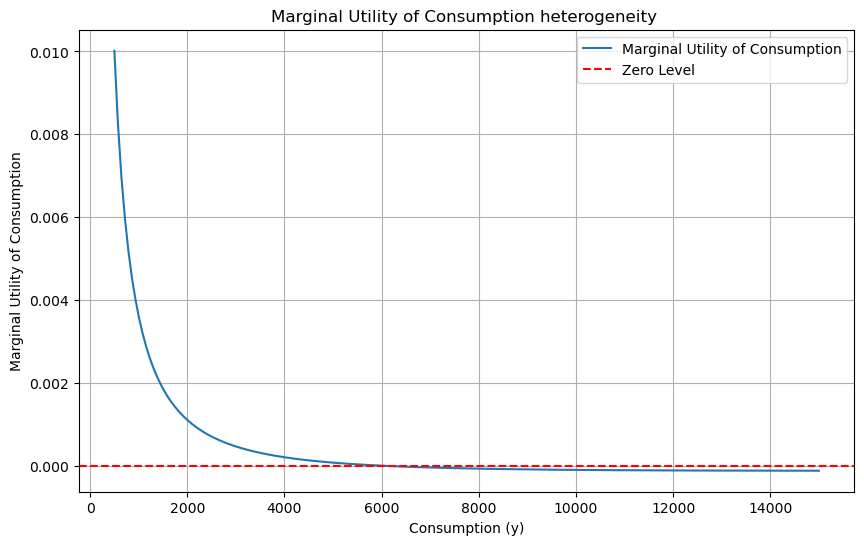

In [275]:
# Estimated parameters and plotting 
alpha = 17.568297 
beta = 69.308100
gamma_yy = -1.011667 
gamma_ll = -8.918268
gamma_yl = 0.003867
# Define a range of consumption (y) values
y_values = np.linspace(500, 15000, 200)  # Avoid zero to prevent division by zero

# Calculate the marginal utility for each y value using the mean log leisure (logl)
marginal_utility_values = marginal_utility_y(y_values, alpha, gamma_yy, gamma_yl, df_filtered['logl'].mean())

# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(y_values, marginal_utility_values, label='Marginal Utility of Consumption')
plt.axhline(y=0, color='r', linestyle='--', label='Zero Level')
plt.xlabel('Consumption (y)')
plt.ylabel('Marginal Utility of Consumption')
plt.title('Marginal Utility of Consumption heterogeneity ')
plt.legend()
plt.grid(True)
plt.show()


In [370]:
# Define the coefficients and heterogeneity parameters
alpha = 17.568297 
beta = 69.308100
gamma_yy = -1.011667 
gamma_ll = -8.918268
gamma_yl = 0.003867

# Heterogeneity parameters
alpha_amrtn_2 = -0.901873
alpha_amrtn_3 = -1.153096 
alpha_amrtn_4 = -2.002610   
alpha_amrtn_6 = -1.529547 
alpha_dag = -0.064722 
alpha_dag2 = 0.001121
alpha_dcz_2 = -1.507303 
alpha_dcz_3 = -1.333377 
alpha_dgn = 0.788530 
alpha_deh_0 = -2.291884
alpha_deh_1 = -1.291191
alpha_deh_2 = -1.340360
alpha_deh_3 = -0.649827
alpha_deh_4 = 2.524951
alpha_dms_3 = -0.380716 
alpha_dms_4 = -0.312
alpha_dms_5 = 0.211971
alpha_dncsy = -2.591300
alpha_les_2 = -4.116105      
alpha_les_7 = 9.074582
alpha_lindi_0 = 55.990346
alpha_lindi_1 = -1.647418 
alpha_lindi_10 = -0.272774 
alpha_lindi_11 = 0.048701
alpha_lindi_12 = -1.805131 
alpha_lindi_3 = -0.845782
alpha_lindi_4 = 0.559927
alpha_lindi_5 = -1.910248
alpha_lindi_6 = -2.608789
alpha_lindi_7 = 1.022106
alpha_lindi_8 = -0.022022	
alpha_lindi_9 = 0.192925

beta_amrtn_2 = 0.109422 
beta_amrtn_3 = -0.227860
beta_amrtn_4 = -1.145363 
beta_amrtn_6 = -0.029801
beta_dag = -0.138533 
beta_dag2 = 0.001593
beta_dcz_2 = -1.431550 
beta_dcz_3 = -0.235669 
beta_deh_0 = 0.357007
beta_deh_1 = 0.442505
beta_deh_2 = -0.207603	
beta_deh_3 = 0.567477
beta_deh_4 = 2.990132	
beta_dgn = -0.725227  
beta_dms_3 = 0.342493
beta_dms_4 = -0.283816 
beta_dms_5 = 0.306725 
beta_dncsy = -2.604926 
beta_les_2 = -6.044054 
beta_les_7 = 2.184340 
beta_lindi_0 = 59.663166
beta_lindi_1 = -1.346355	
beta_lindi_10 = 0.743129	
beta_lindi_11 = -0.099516	
beta_lindi_12 = 0.000875
beta_lindi_3 = -0.564887
beta_lindi_4 = 0.333134
beta_lindi_5 = -1.870053
beta_lindi_6 = -2.618889
beta_lindi_7 = 1.715977 
beta_lindi_8 = 0.481687
beta_lindi_9 = 0.590077 

In [371]:
# Precompute heterogeneity parts for alpha and beta
long_df['alpha_part'] = (
    alpha + 
    alpha_amrtn_2 * long_df['amrtn_2'] + 
    alpha_amrtn_3 * long_df['amrtn_3'] + 
    alpha_amrtn_4 * long_df['amrtn_4'] + 
    alpha_amrtn_6 * long_df['amrtn_6'] + 
    alpha_dag * long_df['dag'] + 
    alpha_dag2 * long_df['dag2'] + 
    alpha_dcz_2 * long_df['dcz_2'] + 
    alpha_dcz_3 * long_df['dcz_3'] + 
    alpha_dgn * long_df['dgn'] +
    alpha_deh_0 * long_df['deh_0'] + 
    alpha_deh_1 * long_df['deh_1'] +
    alpha_deh_2 * long_df['deh_2'] +
    alpha_deh_3 * long_df['deh_3'] +
    alpha_deh_4 * long_df['deh_4'] +
    alpha_dms_3 * long_df['dms_3'] +
    alpha_dms_4 * long_df['dms_4'] +
    alpha_dms_5 * long_df['dms_5'] +
    alpha_dncsy * long_df['dncsy'] +
    alpha_les_2 * long_df['les_2'] +
    alpha_les_7 * long_df['les_7'] + 
    alpha_lindi_0 * long_df['lindi_0'] + 
    alpha_lindi_1 * long_df['lindi_1'] +
    alpha_lindi_10 * long_df['lindi_10'] +
    alpha_lindi_11 * long_df['lindi_11'] +
    alpha_lindi_12 * long_df['lindi_12'] +
    alpha_lindi_3 * long_df['lindi_3'] +
    alpha_lindi_4 * long_df['lindi_4'] +
    alpha_lindi_5 * long_df['lindi_5'] +
    alpha_lindi_6 * long_df['lindi_6'] +
    alpha_lindi_7 * long_df['lindi_7'] +
    alpha_lindi_8 * long_df['lindi_8'] +
    alpha_lindi_9 * long_df['lindi_9']
)

long_df['beta_part'] = (
    beta + 
    beta_amrtn_2 * long_df['amrtn_2'] + 
    beta_amrtn_3 * long_df['amrtn_3'] + 
    beta_amrtn_4 * long_df['amrtn_4'] + 
    beta_amrtn_6 * long_df['amrtn_6'] + 
    beta_dag * long_df['dag'] + 
    beta_dag2 * long_df['dag2'] + 
    beta_dcz_2 * long_df['dcz_2'] + 
    beta_dcz_3 * long_df['dcz_3'] + 
    beta_dgn * long_df['dgn'] +
    beta_deh_0 * long_df['deh_0'] + 
    beta_deh_1 * long_df['deh_1'] +
    beta_deh_2 * long_df['deh_2'] +
    beta_deh_3 * long_df['deh_3'] +
    beta_deh_4 * long_df['deh_4'] +
    beta_dms_3 * long_df['dms_3'] +
    beta_dms_4 * long_df['dms_4'] +
    beta_dms_5 * long_df['dms_5'] +
    beta_dncsy * long_df['dncsy'] +
    beta_les_2 * long_df['les_2'] +
    beta_les_7 * long_df['les_7'] + 
    beta_lindi_0 * long_df['lindi_0'] + 
    beta_lindi_1 * long_df['lindi_1'] +
    beta_lindi_10 * long_df['lindi_10'] +
    beta_lindi_11 * long_df['lindi_11'] +
    beta_lindi_12 * long_df['lindi_12'] +
    beta_lindi_3 * long_df['lindi_3'] +
    beta_lindi_4 * long_df['lindi_4'] +
    beta_lindi_5 * long_df['lindi_5'] +
    beta_lindi_6 * long_df['lindi_6'] +
    beta_lindi_7 * long_df['lindi_7'] +
    beta_lindi_8 * long_df['lindi_8'] +
    beta_lindi_9 * long_df['lindi_9']
)


In [372]:
# Calculate the utility for each scenario in long format
long_df['utility'] = (
    long_df['alpha_part'] * long_df['logy'] + 
    long_df['beta_part'] * long_df['logl'] + 
    gamma_yy * long_df['logy2'] + 
    gamma_ll * long_df['logl2'] + 
    gamma_yl * long_df['logyl']
)


In [373]:
# Determine the predicted choice by selecting the scenario with the highest utility for each individual
predicted_choices = long_df.loc[long_df.groupby('idperson')['utility'].idxmax()]

# Ensure the `predicted_scenario` column is added to the original long_df
long_df = long_df.merge(predicted_choices[['idperson', 'scenario']], on='idperson', suffixes=('', '_predicted'))

# Rename the merged scenario column to `predicted_choice`
long_df.rename(columns={'scenario_predicted': 'predicted_choice'}, inplace=True)

# Drop unnecessary columns if not needed
long_df.drop(columns=['alpha_part', 'beta_part'], inplace=True)

# Display the dataframe with utilities and predicted choices
long_df[['idperson', 'scenario', 'utility', 'predicted_choice', 'leisure', 'hyds', 'original_scenario']].head()


,idperson,scenario,utility,predicted_choice,leisure,hyds,original_scenario
0,87060001,h0,183.292434,h2,80,840.40,h2
1,87060001,h2,189.348098,h2,36,2543.86,h2
2,87060001,h3,187.022252,h2,23,3161.47,h2
3,87060001,h1,185.833931,h2,66,1028.34,h2
4,87070001,h0,931.586928,h0,80,1510.55,h0


In [374]:
# Add 'choice_made' column: 1 if the scenario is the same as the original_scenario, otherwise 0
long_df['choice_made'] = (long_df['scenario'] == long_df['original_scenario']).astype(int)

# Add 'predicted_choice_binary' column: 1 if the scenario is the same as the predicted_choice, otherwise 0
long_df['predicted_choice_binary'] = (long_df['scenario'] == long_df['predicted_choice']).astype(int)
# Filter the DataFrame to keep only the rows where 'scenario' matches 'original_scenario'
filtered_df = long_df[long_df['scenario'] == long_df['original_scenario']]
# Create a pivot table to count the occurrences of each combination of original and predicted choices
confusion_matrix = pd.crosstab(filtered_df['original_scenario'], filtered_df['predicted_choice'], rownames=['Original Choice'], colnames=['Predicted Choice'])

# Add the row and column totals
confusion_matrix['Total'] = confusion_matrix.sum(axis=1)
confusion_matrix.loc['Total'] = confusion_matrix.sum(axis=0)

# Display the confusion matrix with totals
print(confusion_matrix)

# If needed, save the confusion matrix to a CSV file
confusion_matrix.to_csv('confusion_matrix_with_totals.csv')

Predicted Choice  h0  h1    h2   h3  Total
Original Choice                           
h0                60   0     1    0     61
h1                 2   5   533   21    561
h2                 0   4  4155   93   4252
h3                 1   0   385  178    564
Total             63   9  5074  292   5438


In [375]:
# Assuming wide_df contains the necessary data
# Extract the relevant columns for utility calculation
columns_to_extract = [
    'idperson', 'original_scenario',
    'logy_h0', 'logy_h1', 'logy_h2', 'logy_h3',
    'logl_h0', 'logl_h1', 'logl_h2', 'logl_h3',
    'logy2_h0', 'logy2_h1', 'logy2_h2', 'logy2_h3',
    'logl2_h0', 'logl2_h1', 'logl2_h2', 'logl2_h3',
    'logyl_h0', 'logyl_h1', 'logyl_h2', 'logyl_h3',
    'amrtn_2', 'amrtn_3', 'amrtn_4', 'amrtn_6', 'dag', 'dag2', 'dcz_2', 'dcz_3',
    'dgn', 'deh_0', 'deh_1', 'deh_2', 'deh_3', 'deh_4', 'dms_3', 'dms_4', 'dms_5',
    'dncsy', 'les_2', 'les_7', 'lindi_0', 'lindi_1', 'lindi_10', 'lindi_11',
    'lindi_12', 'lindi_3', 'lindi_4', 'lindi_5', 'lindi_6', 'lindi_7', 'lindi_8', 'lindi_9'
]

# Extract the necessary columns from wide_df, handling missing columns
for col in columns_to_extract:
    if col not in wide_df.columns:
        wide_df[col] = 0

# Define the coefficients based on the provided parameters
alpha = 17.568297 
beta = 69.308100
gamma_yy = -1.011667 
gamma_ll = -8.918268
gamma_yl = 0.003867

# Define the heterogeneity parameters based on the provided output
alpha_amrtn_2 = -0.901873
alpha_amrtn_3 = -1.153096 
alpha_amrtn_4 = -2.002610   
alpha_amrtn_6 = -1.529547 
alpha_dag = -0.064722 
alpha_dag2 = 0.001121
alpha_dcz_2 = -1.507303 
alpha_dcz_3 = -1.333377 
alpha_dgn = 0.788530 
alpha_deh_0	= -2.291884
alpha_deh_1	= -1.291191
alpha_deh_2	= -1.340360
alpha_deh_3	= -0.649827
alpha_deh_4	= 2.524951
alpha_dms_3 = -0.380716 
alpha_dms_4 = -0.312
alpha_dms_5 = 0.211971
alpha_dncsy = -2.591300
alpha_les_2 = -4.116105      
alpha_les_7 = 9.074582
alpha_lindi_0 =  55.990346
alpha_lindi_1   = -1.647418 
alpha_lindi_10  = -0.272774 
alpha_lindi_11  = 0.048701
alpha_lindi_12  -1.805131 
alpha_lindi_3	= -0.845782
alpha_lindi_4 =	0.559927
alpha_lindi_5	= -1.910248
alpha_lindi_6	= -2.608789
alpha_lindi_7	= 1.022106
alpha_lindi_8	= -0.022022	
alpha_lindi_9	= 0.192925


beta_amrtn_2 = 0.109422 
beta_amrtn_3 =  -0.227860
beta_amrtn_4 = -1.145363 
beta_amrtn_6 =  -0.029801
beta_dag = -0.138533 
beta_dag2 = 0.001593
beta_dcz_2 = -1.431550 
beta_dcz_3 = -0.235669 
beta_deh_0	=0.357007
beta_deh_1	= 0.442505
beta_deh_2	= -0.207603	
beta_deh_3	= 0.567477
beta_deh_4	= 2.990132	
beta_dgn = -0.725227  
beta_dms_3 = 0.342493
beta_dms_4 = -0.283816 
beta_dms_5 = 0.306725 
beta_dncsy = -2.604926 
beta_les_2 = -6.044054 
beta_les_7 = 2.184340 
beta_lindi_0 = 59.663166
beta_lindi_1 = -1.346355	
beta_lindi_10	= 0.743129	
beta_lindi_11	= -0.099516	
beta_lindi_12	= 0.000875
beta_lindi_3	= -0.564887
beta_lindi_4	= 0.333134
beta_lindi_5	= -1.870053
beta_lindi_6	= -2.618889
beta_lindi_7    =  1.715977 
beta_lindi_8   =  0.481687
beta_lindi_9    =  0.590077 


In [376]:
# Precompute heterogeneity parts for alpha and beta
wide_df['alpha_part'] = (
    alpha + 
    alpha_amrtn_2 * wide_df['amrtn_2'] + 
    alpha_amrtn_3 * wide_df['amrtn_3'] + 
    alpha_amrtn_4 * wide_df['amrtn_4'] + 
    alpha_amrtn_6 * wide_df['amrtn_6'] + 
    alpha_dag * wide_df['dag'] + 
    alpha_dag2 * wide_df['dag2'] + 
    alpha_dcz_2 * wide_df['dcz_2'] + 
    alpha_dcz_3 * wide_df['dcz_3'] + 
    alpha_dgn * wide_df['dgn'] +
    alpha_deh_0 * wide_df['deh_0'] + 
    alpha_deh_1 * wide_df['deh_1'] +
    alpha_deh_2 * wide_df['deh_2'] +
    alpha_deh_3 * wide_df['deh_3'] +
    alpha_deh_4 * wide_df['deh_4'] +
    alpha_dms_3 * wide_df['dms_3'] +
    alpha_dms_4 * wide_df['dms_4'] +
    alpha_dms_5 * wide_df['dms_5'] +
    alpha_dncsy * wide_df['dncsy'] +
    alpha_les_2 * wide_df['les_2'] +
    alpha_les_7 * wide_df['les_7'] + 
    alpha_lindi_0 * wide_df['lindi_0'] + 
    alpha_lindi_1 * wide_df['lindi_1'] +
    alpha_lindi_10 * wide_df['lindi_10'] +
    alpha_lindi_11 * wide_df['lindi_11'] +
    alpha_lindi_12 * wide_df['lindi_12'] +
    alpha_lindi_3 * wide_df['lindi_3'] +
    alpha_lindi_4 * wide_df['lindi_4'] +
    alpha_lindi_5 * wide_df['lindi_5'] +
    alpha_lindi_6 * wide_df['lindi_6'] +
    alpha_lindi_7 * wide_df['lindi_7'] +
    alpha_lindi_8 * wide_df['lindi_8'] +
    alpha_lindi_9 * wide_df['lindi_9']
)

wide_df['beta_part'] = (
    beta + 
    beta_amrtn_2 * wide_df['amrtn_2'] + 
    beta_amrtn_3 * wide_df['amrtn_3'] + 
    beta_amrtn_4 * wide_df['amrtn_4'] + 
    beta_amrtn_6 * wide_df['amrtn_6'] + 
    beta_dag * wide_df['dag'] + 
    beta_dag2 * wide_df['dag2'] + 
    beta_dcz_2 * wide_df['dcz_2'] + 
    beta_dcz_3 * wide_df['dcz_3'] + 
    beta_dgn * wide_df['dgn'] +
    beta_deh_0 * wide_df['deh_0'] + 
    beta_deh_1 * wide_df['deh_1'] +
    beta_deh_2 * wide_df['deh_2'] +
    beta_deh_3 * wide_df['deh_3'] +
    beta_deh_4 * wide_df['deh_4'] +
    beta_dms_3 * wide_df['dms_3'] +
    beta_dms_4 * wide_df['dms_4'] +
    beta_dms_5 * wide_df['dms_5'] +
    beta_dncsy * wide_df['dncsy'] +
    beta_les_2 * wide_df['les_2'] +
    beta_les_7 * wide_df['les_7'] + 
    beta_lindi_0 * wide_df['lindi_0'] + 
    beta_lindi_1 * wide_df['lindi_1'] +
    beta_lindi_10 * wide_df['lindi_10'] +
    beta_lindi_11 * wide_df['lindi_11'] +
    beta_lindi_12 * wide_df['lindi_12'] +
    beta_lindi_3 * wide_df['lindi_3'] +
    beta_lindi_4 * wide_df['lindi_4'] +
    beta_lindi_5 * wide_df['lindi_5'] +
    beta_lindi_6 * wide_df['lindi_6'] +
    beta_lindi_7 * wide_df['lindi_7'] +
    beta_lindi_8 * wide_df['lindi_8'] +
    beta_lindi_9 * wide_df['lindi_9']
)

# Calculate the utility for each scenario in a vectorized manner
for i in range(4):
    wide_df[f'utility_h{i}'] = (
        wide_df['alpha_part'] * wide_df[f'logy_h{i}'] + 
        wide_df['beta_part'] * wide_df[f'logl_h{i}'] + 
        gamma_yy * wide_df[f'logy2_h{i}'] + 
        gamma_ll * wide_df[f'logl2_h{i}'] + 
        gamma_yl * wide_df[f'logyl_h{i}']
    )


In [377]:
# Determine the predicted choice by selecting the scenario with the highest utility
utility_cols = [f'utility_h{i}' for i in range(4)]
wide_df['predicted_choice'] = wide_df[utility_cols].idxmax(axis=1)

# Adjust predicted_choice to match scenario labels if necessary
wide_df['predicted_choice'] = wide_df['predicted_choice'].apply(lambda x: x.split('_')[1])

## mapping
scenario_mapping = {'h0': 0, 'h1': 1, 'h2': 2, 'h3': 3}

wide_df['predicted_choice'] = wide_df['predicted_choice'].map(scenario_mapping)


In [378]:
# Compare predicted choices to actual choices
correct_predictions = wide_df[wide_df['predicted_choice'] == wide_df['original_scenario']]
percent_correct = len(correct_predictions) / len(wide_df) * 100

print(f'Percent correctly predicted: {percent_correct:.2f}%')

Percent correctly predicted: 80.88%


In [202]:
import pandas as pd
import numpy as np
import biogeme.database as db
import biogeme.logging as blog
import biogeme.biogeme as bio
from biogeme.expressions import Beta, Variable

# Define the logger
logger = blog.get_screen_logger(level=blog.INFO)
database = db.Database('labour_supply', filtered_df)


In [204]:
# Define variables
logy_vars = {f'logy_h{i}': Variable(f'logy_h{i}') for i in range(4)}
logl_vars = {f'logl_h{i}': Variable(f'logl_h{i}') for i in range(4)}
logy2_vars = {f'logy2_h{i}': Variable(f'logy2_h{i}') for i in range(4)}
logl2_vars = {f'logl2_h{i}': Variable(f'logl2_h{i}') for i in range(4)}
logyl_vars = {f'logyl_h{i}': Variable(f'logyl_h{i}') for i in range(4)}
choice = Variable('original_scenario')

# Define the levels for categorical variables
deh_levels = [1, 2, 3]
dcz_levels = [2, 3]
lindi_levels = [0, 4, 5, 6, 8, 12]
les_levels = [2, 7]
amrtn_levels = [2, 3, 4]
dms_levels = [3, 4]

# Define parameters
params = [
    'alpha', 'alpha_dag', 'alpha_dag2', 'alpha_dgn', 'alpha_dncsy',
    'beta', 'beta_dag', 'beta_dag2', 'beta_dgn', 'beta_dncsy',
    'gamma_ll', 'gamma_yl', 'gamma_yy'
]

# Add categorical variable parameters
params += [f'alpha_deh_{level}' for level in deh_levels]
params += [f'alpha_dcz_{level}' for level in dcz_levels]
params += [f'alpha_lindi_{level}' for level in lindi_levels]
params += [f'alpha_les_{level}' for level in les_levels]
params += [f'alpha_amrtn_{level}' for level in amrtn_levels]
params += [f'alpha_dms_{level}' for level in dms_levels]
params += [f'beta_deh_{level}' for level in deh_levels]
params += [f'beta_dcz_{level}' for level in dcz_levels]
params += [f'beta_lindi_{level}' for level in lindi_levels]
params += [f'beta_les_{level}' for level in les_levels]
params += [f'beta_amrtn_{level}' for level in amrtn_levels]
params += [f'beta_dms_{level}' for level in dms_levels]

In [205]:
# Create Beta parameters dictionary
betas = {param: Beta(param, 0, None, None, 0) for param in params}

# Define the utility function
def create_utility(logy, logl, logy2, logl2, logyl, betas):
    alpha_sum = betas['alpha'] + betas['alpha_dag'] * Variable('dag') + betas['alpha_dag2'] * Variable('dag2') + betas['alpha_dgn'] * Variable('dgn') + betas['alpha_dncsy'] * Variable('dncsy')
    beta_sum = betas['beta'] + betas['beta_dag'] * Variable('dag') + betas['beta_dag2'] * Variable('dag2') + betas['beta_dgn'] * Variable('dgn') + betas['beta_dncsy'] * Variable('dncsy')

    for level in deh_levels:
        alpha_sum += betas[f'alpha_deh_{level}'] * Variable(f'deh_{level}')
        beta_sum += betas[f'beta_deh_{level}'] * Variable(f'deh_{level}')
        
    for level in dcz_levels:
        alpha_sum += betas[f'alpha_dcz_{level}'] * Variable(f'dcz_{level}')
        beta_sum += betas[f'beta_dcz_{level}'] * Variable(f'dcz_{level}')
        
    for level in lindi_levels:
        alpha_sum += betas[f'alpha_lindi_{level}'] * Variable(f'lindi_{level}')
        beta_sum += betas[f'beta_lindi_{level}'] * Variable(f'lindi_{level}')
        
    for level in les_levels:
        alpha_sum += betas[f'alpha_les_{level}'] * Variable(f'les_{level}')
        beta_sum += betas[f'beta_les_{level}'] * Variable(f'les_{level}')
        
    for level in amrtn_levels:
        alpha_sum += betas[f'alpha_amrtn_{level}'] * Variable(f'amrtn_{level}')
        beta_sum += betas[f'beta_amrtn_{level}'] * Variable(f'amrtn_{level}')
        
    for level in dms_levels:
        alpha_sum += betas[f'alpha_dms_{level}'] * Variable(f'dms_{level}')
        beta_sum += betas[f'beta_dms_{level}'] * Variable(f'dms_{level}')
        
    return alpha_sum * logy + beta_sum * logl + betas['gamma_yy'] * logy2 + betas['gamma_ll'] * logl2 + betas['gamma_yl'] * logyl

V = {i: create_utility(logy_vars[f'logy_h{i}'], logl_vars[f'logl_h{i}'], logy2_vars[f'logy2_h{i}'], logl2_vars[f'logl2_h{i}'], logyl_vars[f'logyl_h{i}'], betas) for i in range(4)}

# Define availability for each choice (assuming all choices are available)
av = {i: 1 for i in range(4)}

# Define the log likelihood function
logprob = models.loglogit(V, av, choice)


In [206]:
# Set up Biogeme
biogeme = bio.BIOGEME(database, logprob)
biogeme.modelName = 'optimized_model'

# Adjust optimization settings for better convergence
biogeme.algorithmParameters = {'tolerance': 1e-6, 'maxIter': 1000}

# Estimate the parameters
results4 = biogeme.estimate()

# Print the estimated parameters
print(results4.getEstimatedParameters())

# Save the results to a report
results.writeHtml('optimized_model4.html')

File biogeme.toml has been parsed. 
File biogeme.toml has been parsed. 
File biogeme.toml has been parsed. 
File biogeme.toml has been parsed. 
*** Initial values of the parameters are obtained from the file __optimized_model.iter 
*** Initial values of the parameters are obtained from the file __optimized_model.iter 
*** Initial values of the parameters are obtained from the file __optimized_model.iter 
*** Initial values of the parameters are obtained from the file __optimized_model.iter 
Parameter values restored from __optimized_model.iter 
Parameter values restored from __optimized_model.iter 
Parameter values restored from __optimized_model.iter 
Parameter values restored from __optimized_model.iter 
Optimization algorithm: hybrid Newton/BFGS with simple bounds [simple_bounds] 
Optimization algorithm: hybrid Newton/BFGS with simple bounds [simple_bounds] 
Optimization algorithm: hybrid Newton/BFGS with simple bounds [simple_bounds] 
Optimization algorithm: hybrid Newton/BFGS with

                     Value  Rob. Std err   Rob. t-test  Rob. p-value
alpha            57.746028      1.405379  4.108929e+01  0.000000e+00
alpha_amrtn_2     0.000001      1.709770  7.104675e-07  9.999994e-01
alpha_amrtn_3     5.414846      3.466916  1.561863e+00  1.183204e-01
alpha_amrtn_4    -0.000006      0.780925 -7.880359e-06  9.999937e-01
alpha_dag        28.298878      0.221485  1.277691e+02  0.000000e+00
alpha_dag2       -0.320517      0.005648 -5.674770e+01  0.000000e+00
alpha_dcz_2      23.279325      2.260726  1.029728e+01  0.000000e+00
alpha_dcz_3     -21.318113      2.382579 -8.947495e+00  0.000000e+00
alpha_deh_1     -28.308696      1.010639 -2.801068e+01  0.000000e+00
alpha_deh_2      10.574076      1.217645  8.684040e+00  0.000000e+00
alpha_deh_3      24.072191      3.321129  7.248196e+00  4.223288e-13
alpha_dgn       -36.804584      2.108458 -1.745569e+01  0.000000e+00
alpha_dms_3      22.519769      2.324964  9.686074e+00  0.000000e+00
alpha_dms_4     -17.104954      3.

Results saved in file heterogeneity_full_model~00.html 
Results saved in file heterogeneity_full_model~00.html 
Results saved in file heterogeneity_full_model~00.html 
Results saved in file heterogeneity_full_model~00.html 


In [214]:
# Estimate the parameters
results5 = biogeme.estimate()

# Print the estimated parameters
print(results5.getEstimatedParameters())

# Save the results to a report
results5.writeHtml('optimized_model6.html')


*** Initial values of the parameters are obtained from the file __optimized_model.iter 
*** Initial values of the parameters are obtained from the file __optimized_model.iter 
*** Initial values of the parameters are obtained from the file __optimized_model.iter 
*** Initial values of the parameters are obtained from the file __optimized_model.iter 
*** Initial values of the parameters are obtained from the file __optimized_model.iter 
*** Initial values of the parameters are obtained from the file __optimized_model.iter 
Parameter values restored from __optimized_model.iter 
Parameter values restored from __optimized_model.iter 
Parameter values restored from __optimized_model.iter 
Parameter values restored from __optimized_model.iter 
Parameter values restored from __optimized_model.iter 
Parameter values restored from __optimized_model.iter 
Optimization algorithm: hybrid Newton/BFGS with simple bounds [simple_bounds] 
Optimization algorithm: hybrid Newton/BFGS with simple bounds [

                     Value  Rob. Std err   Rob. t-test  Rob. p-value
alpha            57.739360      8.692700  6.642282e+00  3.088640e-11
alpha_amrtn_2     0.000001      3.329519  3.656318e-07  9.999997e-01
alpha_amrtn_3     5.408177     16.721110  3.234341e-01  7.463665e-01
alpha_amrtn_4    -0.000006      4.648036 -1.324334e-06  9.999989e-01
alpha_dag        28.125699      0.088823  3.166478e+02  0.000000e+00
alpha_dag2       -0.313622      0.002650 -1.183351e+02  0.000000e+00
alpha_dcz_2      23.366626      4.318038  5.411399e+00  6.253431e-08
alpha_dcz_3     -21.412083      5.742730 -3.728555e+00  1.925810e-04
alpha_deh_1     -28.411714      4.011344 -7.082842e+00  1.412204e-12
alpha_deh_2      10.602952      1.996855  5.309826e+00  1.097300e-07
alpha_deh_3      24.139664      4.351379  5.547590e+00  2.896343e-08
alpha_dgn       -36.911956      1.149719 -3.210520e+01  0.000000e+00
alpha_dms_3      22.560094      5.707163  3.952943e+00  7.719569e-05
alpha_dms_4     -17.151947      4.

Results saved in file optimized_model~05.html 
Results saved in file optimized_model~05.html 
Results saved in file optimized_model~05.html 
Results saved in file optimized_model~05.html 
Results saved in file optimized_model~05.html 
Results saved in file optimized_model~05.html 


### Trial Final Revision 

In [62]:
# Assuming wide_df is your transformed DataFrame
database = db.Database('labour_supply', wide_df)
globals().update(database.variables)

In [63]:
# Define variables for each scenario
logy_h0 = Variable('logy_h0')
logl_h0 = Variable('logl_h0')
logy2_h0 = Variable('logy2_h0')
logl2_h0 = Variable('logl2_h0')
logyl_h0 = Variable('logyl_h0')

logy_h1 = Variable('logy_h1')
logl_h1 = Variable('logl_h1')
logy2_h1 = Variable('logy2_h1')
logl2_h1 = Variable('logl2_h1')
logyl_h1 = Variable('logyl_h1')

logy_h2 = Variable('logy_h2')
logl_h2 = Variable('logl_h2')
logy2_h2 = Variable('logy2_h2')
logl2_h2 = Variable('logl2_h2')
logyl_h2 = Variable('logyl_h2')

logy_h3 = Variable('logy_h3')
logl_h3 = Variable('logl_h3')
logy2_h3 = Variable('logy2_h3')
logl2_h3 = Variable('logl2_h3')
logyl_h3 = Variable('logyl_h3')

choice = Variable('original_scenario')

# Define heterogeneity variables
dag = Variable('dag')
dag2 = Variable('dag2')
dgn = Variable('dgn')
dncsy = Variable('dncsy')
drgur = Variable('drgur')

# Define the parameters to be estimated
alpha = Beta('alpha', 67.2, None, None, 0)
beta = Beta('beta', 120, None, None, 0)
gamma_yy = Beta('gamma_yy', -1 , None, None, 0)
gamma_ll = Beta('gamma_ll', -8.3, None, None, 0)
gamma_yl = Beta('gamma_yl', -0.486, None, None, 0)

# Define heterogeneity parameters for age and gender
alpha_dag = Beta('alpha_dag',0.0183, None, None, 0)
alpha_dag2 = Beta('alpha_dag2',0, None, None, 0)
alpha_dgn = Beta('alpha_dgn', 0.537, None, None, 0)
alpha_dncsy = Beta('alpha_dncsy', -3, None, None, 0)

beta_dag = Beta('beta_dag', -0.0126, None, None, 0)
beta_dag2 = Beta('beta_dag2', 0, None, None, 0)
beta_dgn = Beta('beta_dgn', -0.969, None, None, 0)
beta_dncsy = Beta('beta_dncsy', -2.92, None, None, 0)


In [66]:
# Update dictionaries for the alpha and beta parameters using the mode
def create_alpha_beta_dict(levels, prefix, mode):
    return {level: Beta(f'{prefix}_{level}', 0 if level != mode else 0, None, None, 0) for level in levels}

# Create dummy variables for education levels and other categorical variables
deh_levels = [col for col in wide_df.columns if 'deh_' in col]
dms_levels = [col for col in wide_df.columns if 'dms_' in col]
dcz_levels = [col for col in wide_df.columns if 'dcz_' in col]
lindi_levels = [col for col in wide_df.columns if 'lindi_' in col]
amrtn_levels = [col for col in wide_df.columns if 'amrtn_' in col]
les_levels = [col for col in wide_df.columns if 'les_' in col]


alpha_deh = create_alpha_beta_dict(deh_levels, 'alpha', mode_deh)
beta_deh = create_alpha_beta_dict(deh_levels, 'beta', mode_deh)

alpha_dms = create_alpha_beta_dict(dms_levels, 'alpha', mode_dms)
beta_dms = create_alpha_beta_dict(dms_levels, 'beta', mode_dms)

alpha_dcz = create_alpha_beta_dict(dcz_levels, 'alpha', mode_dcz)
beta_dcz = create_alpha_beta_dict(dcz_levels, 'beta', mode_dcz)

alpha_lindi = create_alpha_beta_dict(lindi_levels, 'alpha', mode_lindi)
beta_lindi = create_alpha_beta_dict(lindi_levels, 'beta', mode_lindi)

alpha_amrtn = create_alpha_beta_dict(amrtn_levels, 'alpha', mode_amrtn)
beta_amrtn = create_alpha_beta_dict(amrtn_levels, 'beta', mode_amrtn)

alpha_les = create_alpha_beta_dict(les_levels, 'alpha', mode_amrtn)
beta_les = create_alpha_beta_dict(les_levels, 'beta', mode_amrtn)


In [69]:
# Combine all alpha and beta dictionaries
alpha_dict = {**alpha_deh, **alpha_dms, **alpha_dcz, **alpha_lindi, **alpha_amrtn,**alpha_les}
beta_dict = {**beta_deh, **beta_dms, **beta_dcz, **beta_lindi, **beta_amrtn,**beta_les}
# Helper function to create utility
def create_utility(logy, logl, logy2, logl2, logyl, alpha_dict, beta_dict):
    alpha_sum = alpha + alpha_dag * dag + alpha_dag2 * dag2 + alpha_dgn * dgn + alpha_dncsy * dncsy + \
        sum(alpha_dict[level] * Variable(level) for level in alpha_dict)
    
    beta_sum = beta + beta_dag * dag + beta_dag2 * dag2+ beta_dgn * dgn + beta_dncsy * dncsy + \
        sum(beta_dict[level] * Variable(level) for level in beta_dict)
    
    return alpha_sum * logy + beta_sum * logl + gamma_yy * logy2 + gamma_ll * logl2 + gamma_yl * logyl

In [70]:
# Generate the utility functions using the helper function
V = {
    0: create_utility(logy_h0, logl_h0, logy2_h0, logl2_h0, logyl_h0, alpha_dict, beta_dict),
    1: create_utility(logy_h1, logl_h1, logy2_h1, logl2_h1, logyl_h1, alpha_dict, beta_dict),
    2: create_utility(logy_h2, logl_h2, logy2_h2, logl2_h2, logyl_h2, alpha_dict, beta_dict),
    3: create_utility(logy_h3, logl_h3, logy2_h3, logl2_h3, logyl_h3, alpha_dict, beta_dict),
}

# Define the availability of each choice (all choices are available)
av = {0: 1, 1: 1, 2: 1, 3: 1}

# Associate the utility functions with the choice situations
logprob = models.loglogit(V, av, choice)


In [71]:
# Create the Biogeme object
biogeme_model = bio.BIOGEME(database, logprob)
biogeme_model.modelName = 'heterogeneity_full_model'
biogeme_model.choice = choice

# Estimate the parameters
results = biogeme_model.estimate()

# Print the estimated parameters
print(results.getEstimatedParameters())

It seems that the optimization algorithm did not converge. Therefore, the results may not correspond to the maximum likelihood estimator. Check the specification of the model, or the criteria for convergence of the algorithm.


                   Value  Rob. Std err  Rob. t-test  Rob. p-value
alpha          41.922538      2.364180    17.732379  0.000000e+00
alpha_amrtn_2  -0.901112      0.201962    -4.461789  8.127829e-06
alpha_amrtn_3  -1.145770      0.205864    -5.565652  2.611737e-08
alpha_amrtn_4  -2.004596      0.405280    -4.946194  7.567854e-07
alpha_amrtn_6  -1.528355      0.270456    -5.651032  1.594874e-08
...                  ...           ...          ...           ...
beta_lindi_8  -35.194503      0.764767   -46.019926  0.000000e+00
beta_lindi_9  -35.074806      0.799382   -43.877402  0.000000e+00
gamma_ll       -8.899846      0.154660   -57.544463  0.000000e+00
gamma_yl        0.019001      0.128456     0.147918  8.824072e-01
gamma_yy       -1.005366      0.082453   -12.193246  0.000000e+00

[69 rows x 4 columns]


### 52%

In [73]:
# Retrieve the estimated parameters
parameters = results.getEstimatedParameters()

# Option 1: Set display options to show all rows in Jupyter or interactive environments
pd.set_option('display.max_rows', None)
print(parameters)

                    Value  Rob. Std err  Rob. t-test  Rob. p-value
alpha           41.922538      2.364180    17.732379  0.000000e+00
alpha_amrtn_2   -0.901112      0.201962    -4.461789  8.127829e-06
alpha_amrtn_3   -1.145770      0.205864    -5.565652  2.611737e-08
alpha_amrtn_4   -2.004596      0.405280    -4.946194  7.567854e-07
alpha_amrtn_6   -1.528355      0.270456    -5.651032  1.594874e-08
alpha_dag       -0.063576      0.046845    -1.357174  1.747260e-01
alpha_dag2       0.001107      0.000536     2.065925  3.883558e-02
alpha_dcz_2     -1.510260      0.381432    -3.959452  7.512187e-05
alpha_dcz_3     -1.336195      0.253762    -5.265552  1.397686e-07
alpha_deh_1      1.000664      0.704422     1.420548  1.554483e-01
alpha_deh_2      0.953374      0.649370     1.468151  1.420633e-01
alpha_deh_3      1.643836      0.657447     2.500334  1.240764e-02
alpha_deh_4      4.837694      0.951575     5.083883  3.697962e-07
alpha_deh_5      2.289899      0.640209     3.576800  3.478264

In [126]:
# Assuming wide_df contains the necessary data
# Extract the relevant columns for utility calculation
columns_to_extract = [
    'idperson', 'original_scenario',
    'logy_h0', 'logy_h1', 'logy_h2', 'logy_h3',
    'logl_h0', 'logl_h1', 'logl_h2', 'logl_h3',
    'logy2_h0', 'logy2_h1', 'logy2_h2', 'logy2_h3',
    'logl2_h0', 'logl2_h1', 'logl2_h2', 'logl2_h3',
    'logyl_h0', 'logyl_h1', 'logyl_h2', 'logyl_h3'
]

# Extract the necessary columns from wide_df, handling missing columns
for col in columns_to_extract:
    if col not in wide_df.columns:
        wide_df[col] = 0


In [127]:
# Define the coefficients based on the provided parameters
alpha = 41.922538
beta = 98.961471
gamma_yy = -1.005366
gamma_ll = -8.899846
gamma_yl = 0.019001

# Define the heterogeneity parameters based on the provided output
alpha_dag = -0.063576
alpha_dag2 = 0.001107
alpha_dgn = 0.786979
alpha_dncsy = -2.612985

# Define dummy variable coefficients (partial list for illustration; complete as necessary)
alpha_deh = [1.000664, 0.953374, 1.643836, 4.837694, 2.289899]
alpha_dcz = [-1.510260, -1.336195]
alpha_lindi = [-32.571380, -30.922452, -31.784124, -30.362238, -32.823371, -33.527509, -29.903860, -30.948853, -30.718334, -31.191129, -30.869968, -32.734540]

beta_dag = -0.135314
beta_dag2 = 0.001558
beta_dgn = -0.723577
beta_dncsy = -2.617683

# Complete dummy variable coefficients for beta (partial list for illustration)
beta_deh = [0.098287, -0.544642, 0.228281, 2.673015, -0.342048]
beta_dcz = [-1.426146, -0.232974]
beta_lindi = [-37.019591, -35.674814, -36.248596, -35.338049, -37.537602, -38.285315, -33.963285, -35.194503, -35.074806, -34.922220, -35.768739, -35.675589]

# Function to handle missing values in the row
def get_value(row, col_name, default=0):
    return row[col_name] if col_name in row else default

# Compute utility function for each scenario
def compute_utility(row, alpha, beta, gamma_yy, gamma_ll, gamma_yl, alpha_dag, alpha_dag2, alpha_dgn, alpha_dncsy, beta_dag, beta_dag2, beta_dgn, beta_dncsy, alpha_deh, beta_deh, alpha_dcz, beta_dcz, alpha_lindi, beta_lindi):
    utilities = []
    for i in range(4):  # Assuming there are 4 scenarios (h0, h1, h2, h3)
        logy = get_value(row, f'logy_h{i}')
        logl = get_value(row, f'logl_h{i}')
        logy2 = get_value(row, f'logy2_h{i}')
        logl2 = get_value(row, f'logl2_h{i}')
        logyl = get_value(row, f'logyl_h{i}')
        
        alpha_part = alpha + alpha_dag * get_value(row, 'dag') + alpha_dag2 * get_value(row, 'dag2') + alpha_dgn * get_value(row, 'dgn') + alpha_dncsy * get_value(row, 'dncsy')
        beta_part = beta + beta_dag * get_value(row, 'dag') + beta_dag2 * get_value(row, 'dag2') + beta_dgn * get_value(row, 'dgn') + beta_dncsy * get_value(row, 'dncsy')
        
        # Sum contributions from dummy variables (example for deh and lindi, add others as needed)
        for j, coef in enumerate(alpha_deh):
            alpha_part += coef * get_value(row, f'deh_{j+1}')
        for j, coef in enumerate(beta_deh):
            beta_part += coef * get_value(row, f'deh_{j+1}')
        for j, coef in enumerate(alpha_dcz):
            alpha_part += coef * get_value(row, f'dcz_{j+2}')
        for j, coef in enumerate(beta_dcz):
            beta_part += coef * get_value(row, f'dcz_{j+2}')
        for j, coef in enumerate(alpha_lindi):
            alpha_part += coef * get_value(row, f'lindi_{j+1}')
        for j, coef in enumerate(beta_lindi):
            beta_part += coef * get_value(row, f'lindi_{j+1}')
        
        utility = alpha_part * logy + beta_part * logl + gamma_yy * logy2 + gamma_ll * logl2 + gamma_yl * logyl
        utilities.append(utility)
    return utilities

# Apply the utility function to each row
wide_df['utilities'] = wide_df.apply(lambda row: compute_utility(row, alpha, beta, gamma_yy, gamma_ll, gamma_yl, alpha_dag, alpha_dag2, alpha_dgn, alpha_dncsy, beta_dag, beta_dag2, beta_dgn, beta_dncsy, alpha_deh, beta_deh, alpha_dcz, beta_dcz, alpha_lindi, beta_lindi), axis=1)

# Determine the predicted choice by selecting the scenario with the highest utility
wide_df['predicted_choice'] = wide_df['utilities'].apply(np.argmax)

# Compare predicted choices to actual choices
correct_predictions = wide_df[wide_df['predicted_choice'] == wide_df['original_scenario']]
percent_correct = len(correct_predictions) / len(wide_df) * 100

print(f'Percent correctly predicted: {percent_correct:.2f}%')


Percent correctly predicted: 52.80%


### 57%

In [92]:
# Filter the DataFrame to keep only the necessary columns
required_columns = [
    'logy_h0', 'logl_h0', 'logy2_h0', 'logl2_h0', 'logyl_h0',
    'logy_h1', 'logl_h1', 'logy2_h1', 'logl2_h1', 'logyl_h1',
    'logy_h2', 'logl_h2', 'logy2_h2', 'logl2_h2', 'logyl_h2',
    'logy_h3', 'logl_h3', 'logy2_h3', 'logl2_h3', 'logyl_h3',
    'original_scenario', 'dag', 'dag2', 'dgn', 'dncsy'
]

# Significant dummy variables based on initial results
significant_dummy_variables = [
    'deh_1', 'deh_3', 'deh_4', 'deh_5', 'dcz_2', 'dcz_3',
    'lindi_1', 'lindi_2', 'lindi_3', 'lindi_4', 'lindi_5', 'lindi_6', 'lindi_7', 'lindi_8', 'lindi_9', 'lindi_10', 'lindi_11', 'lindi_12'
]

required_columns.extend(significant_dummy_variables)

# Filter the DataFrame
filtered_df = wide_df[required_columns]

# Ensure appropriate data types
filtered_df = filtered_df.astype({col: 'float32' for col in filtered_df.select_dtypes(include=[np.float64]).columns})

# Create the Biogeme database
database = db.Database('labour_supply', filtered_df)
globals().update(database.variables)

In [94]:
# Define variables for each scenario
logy_h0 = Variable('logy_h0')
logl_h0 = Variable('logl_h0')
logy2_h0 = Variable('logy2_h0')
logl2_h0 = Variable('logl2_h0')
logyl_h0 = Variable('logyl_h0')

logy_h1 = Variable('logy_h1')
logl_h1 = Variable('logl_h1')
logy2_h1 = Variable('logy2_h1')
logl2_h1 = Variable('logl2_h1')
logyl_h1 = Variable('logyl_h1')

logy_h2 = Variable('logy_h2')
logl_h2 = Variable('logl_h2')
logy2_h2 = Variable('logy2_h2')
logl2_h2 = Variable('logl2_h2')
logyl_h2 = Variable('logyl_h2')

logy_h3 = Variable('logy_h3')
logl_h3 = Variable('logl_h3')
logy2_h3 = Variable('logy2_h3')
logl2_h3 = Variable('logl2_h3')
logyl_h3 = Variable('logyl_h3')

choice = Variable('original_scenario')

# Define heterogeneity variables
dag = Variable('dag')
dag2 = Variable('dag2')
dgn = Variable('dgn')
dncsy = Variable('dncsy')

# Define the parameters to be estimated
alpha = Beta('alpha', 41.9, None, None, 0)
beta = Beta('beta', 99, None, None, 0)
gamma_yy = Beta('gamma_yy', -1.01, None, None, 0)
gamma_ll = Beta('gamma_ll', -8.9, None, None, 0)
gamma_yl = Beta('gamma_yl', 0.019, None, None, 0)

# Define heterogeneity parameters for age and gender
alpha_dag = Beta('alpha_dag', -0.0636, None, None, 0)
alpha_dag2 = Beta('alpha_dag2', 0.001107, None, None, 0)
alpha_dgn = Beta('alpha_dgn', 0.787, None, None, 0)
alpha_dncsy = Beta('alpha_dncsy', -2.61, None, None, 0)

beta_dag = Beta('beta_dag', -0.135, None, None, 0)
beta_dag2 = Beta('beta_dag2', 0.001558, None, None, 0)
beta_dgn = Beta('beta_dgn', -0.724, None, None, 0)
beta_dncsy = Beta('beta_dncsy', -2.62, None, None, 0)

# Create alpha and beta dictionaries for dummy variables
def create_alpha_beta_dict(levels, prefix):
    return {level: Beta(f'{prefix}_{level}', 0, None, None, 0) for level in levels}

deh_levels = [col for col in filtered_df.columns if 'deh_' in col]
dcz_levels = [col for col in filtered_df.columns if 'dcz_' in col]
lindi_levels = [col for col in filtered_df.columns if 'lindi_' in col]

alpha_deh = create_alpha_beta_dict(deh_levels, 'alpha')
beta_deh = create_alpha_beta_dict(deh_levels, 'beta')

alpha_dcz = create_alpha_beta_dict(dcz_levels, 'alpha')
beta_dcz = create_alpha_beta_dict(dcz_levels, 'beta')

alpha_lindi = create_alpha_beta_dict(lindi_levels, 'alpha')
beta_lindi = create_alpha_beta_dict(lindi_levels, 'beta')


In [96]:
# Combine all alpha and beta dictionaries
alpha_dict = {**alpha_deh, **alpha_dcz, **alpha_lindi}
beta_dict = {**beta_deh, **beta_dcz, **beta_lindi}

# Precompute common terms
alpha_common_terms = alpha + alpha_dag * dag + alpha_dag2 * dag2 + alpha_dgn * dgn + alpha_dncsy * dncsy
beta_common_terms = beta + beta_dag * dag + beta_dag2 * dag2 + beta_dgn * dgn + beta_dncsy * dncsy

# Helper function to create utility
def create_utility(logy, logl, logy2, logl2, logyl, alpha_dict, beta_dict, alpha_common, beta_common):
    alpha_sum = alpha_common + sum(alpha_dict[level] * Variable(level) for level in alpha_dict)
    beta_sum = beta_common + sum(beta_dict[level] * Variable(level) for level in beta_dict)
    return alpha_sum * logy + beta_sum * logl + gamma_yy * logy2 + gamma_ll * logl2 + gamma_yl * logyl

# Generate the utility functions using the helper function
V = {
    0: create_utility(logy_h0, logl_h0, logy2_h0, logl2_h0, logyl_h0, alpha_dict, beta_dict, alpha_common_terms, beta_common_terms),
    1: create_utility(logy_h1, logl_h1, logy2_h1, logl2_h1, logyl_h1, alpha_dict, beta_dict, alpha_common_terms, beta_common_terms),
    2: create_utility(logy_h2, logl_h2, logy2_h2, logl2_h2, logyl_h2, alpha_dict, beta_dict, alpha_common_terms, beta_common_terms),
    3: create_utility(logy_h3, logl_h3, logy2_h3, logl2_h3, logyl_h3, alpha_dict, beta_dict, alpha_common_terms, beta_common_terms),
}

# Define the availability of each choice (all choices are available)
av = {0: 1, 1: 1, 2: 1, 3: 1}

# Associate the utility functions with the choice situations
logprob = models.loglogit(V, av, choice)

# Create the Biogeme object
biogeme_model = bio.BIOGEME(database, logprob)
biogeme_model.modelName = 'optimized_model'
biogeme_model.choice = choice


In [97]:
# Adjust optimization settings
biogeme_model.algorithmParameters = {'tolerance': 1e-6, 'maxIter': 1000}

# Estimate the parameters
results2 = biogeme_model.estimate()

# Print the estimated parameters
print(results2.getEstimatedParameters())


It seems that the optimization algorithm did not converge. Therefore, the results may not correspond to the maximum likelihood estimator. Check the specification of the model, or the criteria for convergence of the algorithm.


                     Value  Rob. Std err  Rob. t-test  Rob. p-value
alpha            52.331187      2.255281    23.203847  0.000000e+00
alpha_dag        -0.050423      0.048582    -1.037897  2.993181e-01
alpha_dag2        0.000821      0.000555     1.478974  1.391473e-01
alpha_dcz_2      -1.902445      0.394838    -4.818293  1.447920e-06
alpha_dcz_3      -1.551158      0.258343    -6.004261  1.922053e-09
alpha_deh_1       0.238457      0.308013     0.774177  4.388264e-01
alpha_deh_3       0.684299      0.217589     3.144918  1.661335e-03
alpha_deh_4       1.710093      0.726243     2.354713  1.853703e-02
alpha_deh_5       1.213436      0.204088     5.945664  2.753377e-09
alpha_dgn         0.388299      0.171815     2.259986  2.382212e-02
alpha_dncsy      -2.594223      0.733022    -3.539080  4.015245e-04
alpha_lindi_1   -37.970543      0.841236   -45.136586  0.000000e+00
alpha_lindi_10  -35.742702      0.802569   -44.535340  0.000000e+00
alpha_lindi_11  -35.298761      0.816686   -43.2

In [112]:
results2.getBetaValues()

{'alpha': 52.33118738231291,
 'alpha_dag': -0.05042335516386139,
 'alpha_dag2': 0.0008208714785370416,
 'alpha_dcz_2': -1.9024449908248886,
 'alpha_dcz_3': -1.5511578695936974,
 'alpha_deh_1': 0.23845654500374483,
 'alpha_deh_3': 0.6842992253576268,
 'alpha_deh_4': 1.7100926721870549,
 'alpha_deh_5': 1.213436310701826,
 'alpha_dgn': 0.38829876493785465,
 'alpha_dncsy': -2.594223412869811,
 'alpha_lindi_1': -37.970543034224065,
 'alpha_lindi_10': -35.74270160850357,
 'alpha_lindi_11': -35.29876101625452,
 'alpha_lindi_12': -37.699378869671094,
 'alpha_lindi_2': -35.27850627584521,
 'alpha_lindi_3': -36.2809915869405,
 'alpha_lindi_4': -34.90200941807069,
 'alpha_lindi_5': -37.194428524301074,
 'alpha_lindi_6': -38.0789936645298,
 'alpha_lindi_7': -34.25077115114494,
 'alpha_lindi_8': -35.946033771509576,
 'alpha_lindi_9': -34.84782825295305,
 'beta': 107.84392622334418,
 'beta_dag': -0.1617276337025304,
 'beta_dag2': 0.001730163527143824,
 'beta_dcz_2': -1.7677634206284163,
 'beta_dcz_3

In [120]:
# Simulate probabilities for each alternative
simulate = {
    'Prob0': models.logit(V, av, 0),
    'Prob1': models.logit(V, av, 1),
    'Prob2': models.logit(V, av, 2),
    'Prob3': models.logit(V, av, 3)
}

biogeme_sim = bio.BIOGEME(database, simulate)
simulated_values = biogeme_sim.simulate(results.getBetaValues())

# Determine the predicted choice by selecting the alternative with the highest probability
simulated_values['Predicted'] = simulated_values[['Prob0', 'Prob1', 'Prob2', 'Prob3']].idxmax(axis=1).apply(lambda x: int(x[-1]))

# Merge predictions with actual choices
simulated_values = simulated_values.merge(wide_df[['idperson', 'original_scenario']], left_index=True, right_index=True)

# Calculate the percentage of correctly predicted choices
correct_predictions = simulated_values[simulated_values['Predicted'] == simulated_values['original_scenario']]
percent_correct = len(correct_predictions) / len(simulated_values) * 100

print(f'Percent correctly predicted: {percent_correct:.2f}%')


Parameter alpha_amrtn_2 not present in the model.
Parameter alpha_amrtn_3 not present in the model.
Parameter alpha_amrtn_4 not present in the model.
Parameter alpha_amrtn_6 not present in the model.
Parameter alpha_deh_2 not present in the model.
Parameter alpha_dms_3 not present in the model.
Parameter alpha_dms_4 not present in the model.
Parameter alpha_dms_5 not present in the model.
Parameter alpha_les_3 not present in the model.
Parameter alpha_les_7 not present in the model.
Parameter beta_amrtn_2 not present in the model.
Parameter beta_amrtn_3 not present in the model.
Parameter beta_amrtn_4 not present in the model.
Parameter beta_amrtn_6 not present in the model.
Parameter beta_deh_2 not present in the model.
Parameter beta_dms_3 not present in the model.
Parameter beta_dms_4 not present in the model.
Parameter beta_dms_5 not present in the model.
Parameter beta_les_3 not present in the model.
Parameter beta_les_7 not present in the model.


Percent correctly predicted: 56.88%


In [98]:
# biogeme translog (refined )
res = [  52.331187,  107.84,  -0.947586 , -8.248008  , -0.484928 ]   
# Automated calculation of points where marginal utilities become negative
mu_y_neg = np.exp(- (res[0] + res[4] * df_filtered['logl'].mean()) / ( 2 * res[2]))
mu_l_neg = np.exp(- (res[1] + res[4] * df_filtered['logy'].mean()) / (2* res[3]))

print(f"Income level at which MU of income becomes negative: {mu_y_neg}")
print(f"Leisure level at which MU of leisure becomes negative: {mu_l_neg}")

Income level at which MU of income becomes negative: 363410363432.52094
Leisure level at which MU of leisure becomes negative: 554.7939185990504


In [100]:
# Define the utility function with the estimated parameters
def utility(logy, logl, alpha, beta, gamma_yy, gamma_ll, gamma_yl):
    logy2 = logy ** 2
    logl2 = logl ** 2
    logyl = logy * logl
    return alpha * logy + beta * logl + gamma_yy * logy2 + gamma_ll * logl2 + gamma_yl * logyl

# Define the marginal utility function
def marginal_utility_y(y, alpha, gamma_yy, gamma_yl, logl):
    logy = np.log(y)
    return (alpha + 2 * gamma_yy * logy + gamma_yl * logl) / y

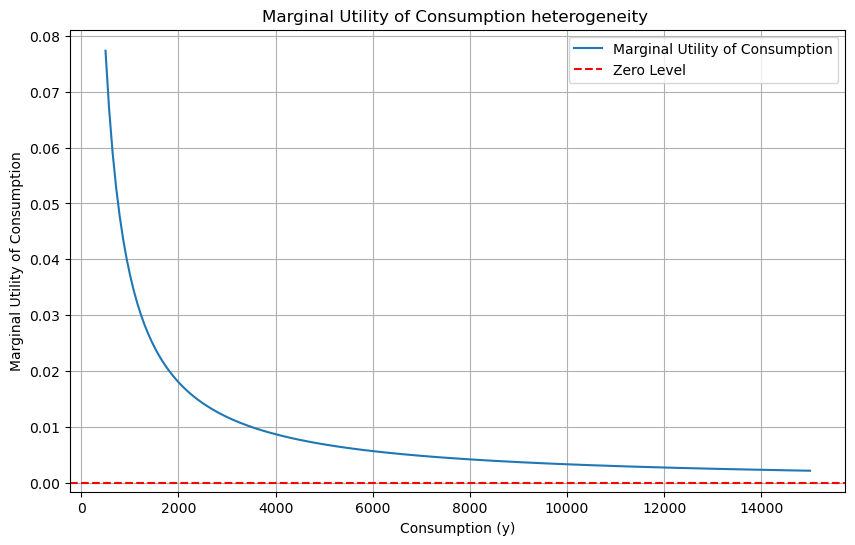

In [101]:
# Estimated parameters and plotting 
alpha =  52.331187
beta = 107.85
gamma_yy = -0.947586
gamma_ll = -8.248008
gamma_yl = -0.484928 

# Define a range of consumption (y) values
y_values = np.linspace(500, 15000, 200)  # Avoid zero to prevent division by zero

# Calculate the marginal utility for each y value using the mean log leisure (logl)
marginal_utility_values = marginal_utility_y(y_values, alpha, gamma_yy, gamma_yl, df_filtered['logl'].mean())

# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(y_values, marginal_utility_values, label='Marginal Utility of Consumption')
plt.axhline(y=0, color='r', linestyle='--', label='Zero Level')
plt.xlabel('Consumption (y)')
plt.ylabel('Marginal Utility of Consumption')
plt.title('Marginal Utility of Consumption heterogeneity ')
plt.legend()
plt.grid(True)
plt.show()


In [102]:
# Define the coefficients as obtained from your model
alpha = 52.331187
beta = 107.843926
gamma_yy = -0.947586
gamma_ll = -8.248008  # Updated based on the output
gamma_yl = -0.484928  # Updated based on the output

# Define the heterogeneity parameters based on the given output
alpha_dag = -0.050423
alpha_dgn = 0.388299
alpha_dncsy = -2.594223
alpha_deh = [0.238457, 1.710093, 0.684299, 1.710093, 1.213436]  # Updated based on available data
alpha_dcz = [-1.902445, -1.551158]
alpha_lindi = [-37.970543, -35.278506, -36.280992, -34.902009, -37.194429, -38.078994, -34.250771, -35.946034, -34.847828, -35.742702, -35.298761, -37.699379]
beta_dag = -0.161728
beta_dgn = -1.021634
beta_dncsy = -2.653267
beta_deh = [0.617723, 1.449018, 0.613985, 1.449018, 0.150034]  # Updated based on available data
beta_dcz = [-1.767763, -0.441203]
beta_lindi = [-41.956133, -38.876250, -39.915982, -39.042978, -41.129465, -41.651710, -37.139139, -39.277887, -37.903357, -38.335820, -39.027469, -39.721989]


In [103]:
# Define the utility computation function
def compute_utility(row):
    # Extract the required values from the row
    logy = row['logy']
    logl = row['logl']
    logy2 = row['logy2']
    logl2 = row['logl2']
    logyl = row['logyl']
    
    # Heterogeneity components
    deh_levels = [row.get(f'deh_{i+1}', 0) for i in range(len(alpha_deh))]
    dcz_levels = [row.get(f'dcz_{i+2}', 0) for i in range(len(alpha_dcz))]
    lindi_levels = [row.get(f'lindi_{i+1}', 0) for i in range(len(alpha_lindi))]

    alpha_part = (alpha + alpha_dag * row.get('dag', 0) + alpha_dgn * row.get('dgn', 0) + alpha_dncsy * row.get('dncsy', 0) +
                  sum(alpha_deh[i] * deh_levels[i] for i in range(len(alpha_deh))) +
                  sum(alpha_dcz[i] * dcz_levels[i] for i in range(len(alpha_dcz))) +
                  sum(alpha_lindi[i] * lindi_levels[i] for i in range(len(alpha_lindi)))) * logy
    
    beta_part = (beta + beta_dag * row.get('dag', 0) + beta_dgn * row.get('dgn', 0) + beta_dncsy * row.get('dncsy', 0) +
                 sum(beta_deh[i] * deh_levels[i] for i in range(len(beta_deh))) +
                 sum(beta_dcz[i] * dcz_levels[i] for i in range(len(beta_dcz))) +
                 sum(beta_lindi[i] * lindi_levels[i] for i in range(len(beta_lindi)))) * logl

    # Compute the utility
    utility = alpha_part + beta_part + gamma_yy * logy2 + gamma_ll * logl2 + gamma_yl * logyl
    return utility


In [104]:
# Compute utilities for each observation
long_df['utility'] = long_df.apply(compute_utility, axis=1)

# Determine the predicted choice by selecting the scenario with the highest utility for each person
long_df['utility_idx'] = long_df.groupby('idperson')['utility'].transform(lambda x: x.idxmax())
long_df['predicted_choice'] = long_df.loc[long_df['utility_idx'], 'scenario'].values

# Drop the utility_idx column
long_df.drop(columns=['utility_idx'], inplace=True)


In [105]:
# Display the dataframe with utilities and predicted choices
long_df[['idperson', 'scenario', 'utility', 'predicted_choice', 'leisure','hyds','original_scenario']].head()


,idperson,scenario,utility,predicted_choice,leisure,hyds,original_scenario
0,87060001,h0,176.461958,h2,80,840.40,h2
11030,87060001,h2,183.637850,h2,36,2543.86,h2
16545,87060001,h3,182.534097,h2,23,3161.47,h2
5515,87060001,h1,179.120890,h2,66,1028.34,h2
1,87070001,h0,584.376105,h0,80,1510.55,h0


In [106]:
# Add 'choice_made' column: 1 if the scenario is the same as the original_scenario, otherwise 0
long_df['choice_made'] = (long_df['scenario'] == long_df['original_scenario']).astype(int)

# Add 'predicted_choice_binary' column: 1 if the scenario is the same as the predicted_choice, otherwise 0
long_df['predicted_choice_binary'] = (long_df['scenario'] == long_df['predicted_choice']).astype(int)
# Filter the DataFrame to keep only the rows where 'scenario' matches 'original_scenario'
filtered_df = long_df[long_df['scenario'] == long_df['original_scenario']]
# Create a pivot table to count the occurrences of each combination of original and predicted choices
confusion_matrix = pd.crosstab(filtered_df['original_scenario'], filtered_df['predicted_choice'], rownames=['Original Choice'], colnames=['Predicted Choice'])

# Add the row and column totals
confusion_matrix['Total'] = confusion_matrix.sum(axis=1)
confusion_matrix.loc['Total'] = confusion_matrix.sum(axis=0)

# Display the confusion matrix with totals
print(confusion_matrix)

# If needed, save the confusion matrix to a CSV file
confusion_matrix.to_csv('confusion_matrix_with_totals.csv')

Predicted Choice  h0  h1    h2    h3  Total
Original Choice                            
h0                60   0     1     0     61
h1                 2   1   367   191    561
h2                 2   1  3068  1181   4252
h3                 0   0   205   359    564
Total             64   2  3641  1731   5438


In [ ]:
# Assuming wide_df contains the necessary data
# Extract the relevant columns for utility calculation
columns_to_extract = [
    'idperson', 'original_scenario',
    'logy_h0', 'logy_h1', 'logy_h2', 'logy_h3',
    'logl_h0', 'logl_h1', 'logl_h2', 'logl_h3',
    'logy2_h0', 'logy2_h1', 'logy2_h2', 'logy2_h3',
    'logl2_h0', 'logl2_h1', 'logl2_h2', 'logl2_h3',
    'logyl_h0', 'logyl_h1', 'logyl_h2', 'logyl_h3'
]

# Extract the necessary columns from wide_df, handling missing columns
for col in columns_to_extract:
    if col not in wide_df.columns:
        wide_df[col] = 0

# Define the coefficients based on the provided parameters
alpha = 67.2
beta = 120
gamma_yy = -1
gamma_ll = -8.3
gamma_yl = -0.486

# Define the heterogeneity parameters based on the provided output
alpha_amrtn_2 = -0.999
alpha_amrtn_3 = -1.02
alpha_amrtn_4 = -2.04
alpha_amrtn_6 = -1.5
alpha_dag = 0.0183
alpha_dcz_2 = -1.91
alpha_dcz_3 = -1.34

# Dummy variable coefficients
alpha_deh = [1.27, 1.11, 1.62, 3.03, 2.17]
beta_deh = [0.151, -0.5, 0.107, 1.15, -0.357]
alpha_lindi = [-53.5, -51, -52, -50.5, -52.9, -53.6, -50, -51.5, -50.5, -51.3, -50.8, -53.2]
beta_lindi = [-56.4, -53.3, -54.4, -53.5, -55.6, -56, -51.6, -53.7, -52.3, -52.8, -53.3, -54.1]

beta_amrtn_2 = -0.0223
beta_amrtn_3 = -0.0526
beta_amrtn_4 = -0.942
beta_amrtn_6 = -0.0423
beta_dag = -0.0126
beta_dcz_2 = -1.83
beta_dcz_3 = -0.404
beta_dgn = -0.969
beta_dms_3 = 0.241
beta_dms_4 = -0.312
beta_dms_5 = 0.476
beta_dncsy = -2.92

# Function to handle missing values in the row
def get_value(row, col_name, default=0):
    return row[col_name] if col_name in row else default

# Compute utility function for each scenario
def compute_utility(row):
    utilities = []
    for i in range(4):  # Assuming there are 4 scenarios (h0, h1, h2, h3)
        logy = get_value(row, f'logy_h{i}')
        logl = get_value(row, f'logl_h{i}')
        logy2 = get_value(row, f'logy2_h{i}')
        logl2 = get_value(row, f'logl2_h{i}')
        logyl = get_value(row, f'logyl_h{i}')
        
        alpha_part = (alpha + 
                      alpha_amrtn_2 * get_value(row, 'amrtn_2') + 
                      alpha_amrtn_3 * get_value(row, 'amrtn_3') + 
                      alpha_amrtn_4 * get_value(row, 'amrtn_4') + 
                      alpha_amrtn_6 * get_value(row, 'amrtn_6') + 
                      alpha_dag * get_value(row, 'dag') + 
                      alpha_dcz_2 * get_value(row, 'dcz_2') + 
                      alpha_dcz_3 * get_value(row, 'dcz_3') + 
                      sum(alpha_deh[j] * get_value(row, f'deh_{j+1}') for j in range(len(alpha_deh))) + 
                      sum(alpha_lindi[j] * get_value(row, f'lindi_{j+1}') for j in range(len(alpha_lindi)))
                     )
        
        beta_part = (beta + 
                     beta_amrtn_2 * get_value(row, 'amrtn_2') + 
                     beta_amrtn_3 * get_value(row, 'amrtn_3') + 
                     beta_amrtn_4 * get_value(row, 'amrtn_4') + 
                     beta_amrtn_6 * get_value(row, 'amrtn_6') + 
                     beta_dag * get_value(row, 'dag') + 
                     beta_dcz_2 * get_value(row, 'dcz_2') + 
                     beta_dcz_3 * get_value(row, 'dcz_3') + 
                     sum(beta_deh[j] * get_value(row, f'deh_{j+1}') for j in range(len(beta_deh))) + 
                     sum(beta_lindi[j] * get_value(row, f'lindi_{j+1}') for j in range(len(beta_lindi)))
                    )
        
        utility = alpha_part * logy + beta_part * logl + gamma_yy * logy2 + gamma_ll * logl2 + gamma_yl * logyl
        utilities.append(utility)
    return utilities

# Apply the utility function to each row
wide_df['utilities'] = wide_df.apply(compute_utility, axis=1)

# Determine the predicted choice by selecting the scenario with the highest utility
wide_df['predicted_choice'] = wide_df['utilities'].apply(np.argmax)

# Compare predicted choices to actual choices
correct_predictions = wide_df[wide_df['predicted_choice'] == wide_df['original_scenario']]
percent_correct = len(correct_predictions) / len(wide_df) * 100

print(f'Percent correctly predicted: {percent_correct:.2f}%')


In [266]:
# Define the coefficients as obtained from your Stata model
alpha = 14.59304
beta = 63.9534
gamma_yy = -0.8790898
gamma_ll = -9.666307
gamma_yl = -0.3090815

# Define the heterogeneity parameters from Stata results
alpha_dag = -0.3848171
alpha_dgn = 5.215898
alpha_dncsy = -17.81178
alpha_deh = [-16.98433, -27.93697, -13.0513, -23.53582, -7.421668]
alpha_dms = [-18.24674, -3.555781, -5.816867]
alpha_dcz = [-7.73985, -16.09179]
alpha_lindi = [70.09431, 62.80174, 70.9205, 76.05831, 77.52284, 75.96301, 67.93022, 78.9208, 78.302, 76.75448, 75.77256, 86.043]
alpha_amrtn = [-0.3077886, 7.183174, 7.758709, 16.96152]
beta_dag = -0.3696979
beta_dgn = 5.707656
beta_dncsy = -17.68542
beta_deh = [-16.56286, -27.41959, -12.59742, -22.92834, -6.502713]
beta_dms = [-18.35905, -3.645558, -6.166356]
beta_dcz = [-8.076588, -16.44438]
beta_lindi = [63.72109, 57.10316, 64.68068, 70.19786, 71.07543, 69.42973, 61.8154, 72.6388, 73.05038, 70.68698, 70.39489, 79.1417]
beta_amrtn = [-0.6159454, 6.939054, 7.474171, 16.34489]


In [267]:
# Define the utility computation function
def compute_utility(row):
    # Extract the required values from the row
    logy = row['logy']
    logl = row['logl']
    logy2 = row['logy2']
    logl2 = row['logl2']
    logyl = row['logyl']
    
    # Heterogeneity components
    deh_levels = [row[f'deh_{i+1}'] for i in range(len(alpha_deh))]
    dms_levels = [row[f'dms_{i+3}'] for i in range(len(alpha_dms))]
    dcz_levels = [row[f'dcz_{i+2}'] for i in range(len(alpha_dcz))]
    lindi_levels = [row[f'lindi_{i+1}'] for i in range(len(alpha_lindi))]
    amrtn_levels = [row[f'amrtn_{i}'] for i in [2, 3, 4, 6]]

    alpha_part = (alpha + alpha_dag * row['dag'] + alpha_dgn * row['dgn'] + alpha_dncsy * row['dncsy'] +
                  sum(alpha_deh[i] * deh_levels[i] for i in range(len(alpha_deh))) +
                  sum(alpha_dms[i] * dms_levels[i] for i in range(len(alpha_dms))) +
                  sum(alpha_dcz[i] * dcz_levels[i] for i in range(len(alpha_dcz))) +
                  sum(alpha_lindi[i] * lindi_levels[i] for i in range(len(alpha_lindi))) +
                  sum(alpha_amrtn[i] * amrtn_levels[i] for i in range(len(alpha_amrtn)))) * logy
    
    beta_part = (beta + beta_dag * row['dag'] + beta_dgn * row['dgn'] + beta_dncsy * row['dncsy'] +
                 sum(beta_deh[i] * deh_levels[i] for i in range(len(beta_deh))) +
                 sum(beta_dms[i] * dms_levels[i] for i in range(len(beta_dms))) +
                 sum(beta_dcz[i] * dcz_levels[i] for i in range(len(beta_dcz))) +
                 sum(beta_lindi[i] * lindi_levels[i] for i in range(len(beta_lindi))) +
                 sum(beta_amrtn[i] * amrtn_levels[i] for i in range(len(beta_amrtn)))) * logl

    # Compute the utility
    utility = alpha_part + beta_part + gamma_yy * logy2 + gamma_ll * logl2 + gamma_yl * logyl
    return utility


In [268]:
# Compute utilities for each observation
long_df['utility'] = long_df.apply(compute_utility, axis=1)

# Determine the predicted choice by selecting the scenario with the highest utility for each person
long_df['utility_idx'] = long_df.groupby('idperson')['utility'].transform(lambda x: x.idxmax())
long_df['predicted_choice'] = long_df.loc[long_df['utility_idx'], 'scenario'].values

# Drop the utility_idx column
long_df.drop(columns=['utility_idx'], inplace=True)


In [269]:
# Display the dataframe with utilities and predicted choices
long_df[['idperson', 'scenario', 'utility', 'predicted_choice', 'leisure','hyds','original_scenario']].head()


,idperson,scenario,utility,predicted_choice,leisure,hyds,original_scenario
0,87060001,h0,997.161145,h2,80,840.40,h2
11030,87060001,h2,1039.011805,h2,36,2543.86,h2
16545,87060001,h3,1025.764475,h2,23,3161.47,h2
5515,87060001,h1,1003.250260,h2,66,1028.34,h2
1,87070001,h0,-526.463663,h3,80,1510.55,h0


In [270]:
# Filter the DataFrame to keep only the rows where 'scenario' matches 'original_scenario'
filtered_df = long_df[long_df['scenario'] == long_df['original_scenario']]
# Create a pivot table to count the occurrences of each combination of original and predicted choices
confusion_matrix = pd.crosstab(filtered_df['original_scenario'], filtered_df['predicted_choice'], rownames=['Original Choice'], colnames=['Predicted Choice'])

# Add the row and column totals
confusion_matrix['Total'] = confusion_matrix.sum(axis=1)
confusion_matrix.loc['Total'] = confusion_matrix.sum(axis=0)

# Display the confusion matrix with totals
print(confusion_matrix)

# If needed, save the confusion matrix to a CSV file
confusion_matrix.to_csv('confusion_matrix_with_totals.csv')

Predicted Choice   h0   h1    h2   h3  Total
Original Choice                             
h0                  0    0     0   61     61
h1                 81   63   375   42    561
h2                546  279  3243  184   4252
h3                 62   26   358  118    564
Total             689  368  3976  405   5438


In [272]:
# biogeme translog (Hetero max)
res = [ 14.59304,  63.9534,  -0.8790898 , -9.666307 , -0.3090815 ]   
# Automated calculation of points where marginal utilities become negative
mu_y_neg = np.exp(- (res[0] + res[4] * df_filtered['logl'].mean()) / ( 2 * res[2]))
mu_l_neg = np.exp(- (res[1] + res[4] * df_filtered['logy'].mean()) / (2* res[3]))

print(f"Income level at which MU of income becomes negative: {mu_y_neg}")
print(f"Leisure level at which MU of leisure becomes negative: {mu_l_neg}")

Income level at which MU of income becomes negative: 2032.662304851599
Leisure level at which MU of leisure becomes negative: 24.266451221732


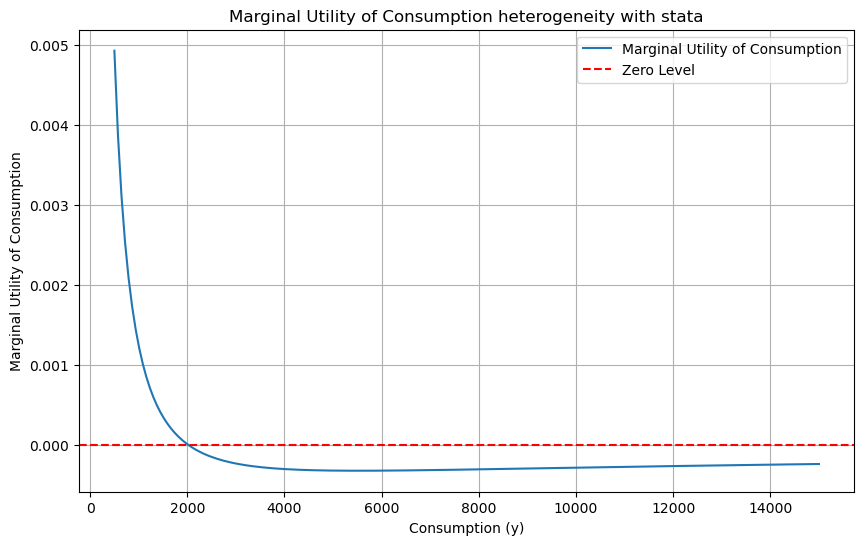

In [274]:
# Estimated parameters and plotting 
alpha = 14.59304
beta = 63.9534
gamma_yy = -0.8790898
gamma_ll = -9.666307
gamma_yl = -0.3090815

# Define a range of consumption (y) values
y_values = np.linspace(500, 15000, 200)  # Avoid zero to prevent division by zero

# Calculate the marginal utility for each y value using the mean log leisure (logl)
marginal_utility_values = marginal_utility_y(y_values, alpha, gamma_yy, gamma_yl, df_filtered['logl'].mean())

# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(y_values, marginal_utility_values, label='Marginal Utility of Consumption')
plt.axhline(y=0, color='r', linestyle='--', label='Zero Level')
plt.xlabel('Consumption (y)')
plt.ylabel('Marginal Utility of Consumption')
plt.title('Marginal Utility of Consumption heterogeneity with stata')
plt.legend()
plt.grid(True)
plt.show()


In [129]:
# biogeme translog (biased)
res = [ 10.814327,  57.883462 ,  -0.797253 , -7.357770, -0.448134]   
# Automated calculation of points where marginal utilities become negative
mu_y_neg = np.exp(- (res[0] + res[4] * df_filtered['logl'].mean()) / ( 2 * res[2]))
mu_l_neg = np.exp(- (res[1] + res[4] * df_filtered['logy'].mean()) / (2* res[3]))

print(f"Income level at which MU of income becomes negative: {mu_y_neg}")
print(f"Leisure level at which MU of leisure becomes negative: {mu_l_neg}")

Income level at which MU of income becomes negative: 295.9957400086651
Leisure level at which MU of leisure becomes negative: 40.727029156481606


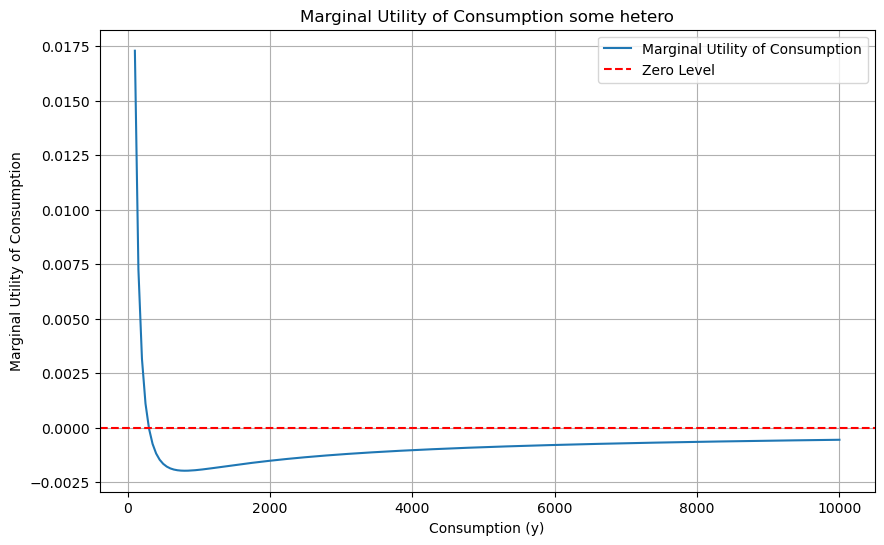

In [271]:
# Estimated parameters and plotting 
alpha = 10.814327
beta =  57.883462 
gamma_yy  = -0.797253
gamma_ll = -7.357770 
gamma_yl = -0.448134

# Define a range of consumption (y) values
y_values = np.linspace(100, 10000, 200)  # Avoid zero to prevent division by zero

# Calculate the marginal utility for each y value using the mean log leisure (logl)
marginal_utility_values = marginal_utility_y(y_values, alpha, gamma_yy, gamma_yl, mean_logl)

# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(y_values, marginal_utility_values, label='Marginal Utility of Consumption')
plt.axhline(y=0, color='r', linestyle='--', label='Zero Level')
plt.xlabel('Consumption (y)')
plt.ylabel('Marginal Utility of Consumption')
plt.title('Marginal Utility of Consumption some hetero')
plt.legend()
plt.grid(True)
plt.show()


In [131]:
# STATA translog (heterogeneity)
res = [ 10.484727,  57.091526,  -0.628706  , -7.298027, -0.3883958]   
# Automated calculation of points where marginal utilities become negative
mu_y_neg = np.exp(- (res[0] + res[4] * df_filtered['logl'].mean()) / ( 2 * res[2]))
mu_l_neg = np.exp(- (res[1] + res[4] * df_filtered['logy'].mean()) / (2* res[3]))

print(f"Income level at which MU of income becomes negative: {mu_y_neg}")
print(f"Leisure level at which MU of leisure becomes negative: {mu_l_neg}")

Income level at which MU of income becomes negative: 1259.2788847816316
Leisure level at which MU of leisure becomes negative: 40.99436000682394


In [ ]:
# Read the data files
long_df = pd.read_csv('long_format_dataset.csv')

long_df.describe()

In [ ]:
df = long_df.copy()

In [ ]:
#mapping and filtration
def map_lhw(row):
    # Ensure the scenario prefix 'h' is included when constructing the column name
    scenario_prefix = 'h' if not row["scenario"].startswith('h') else ''
    scenario_column_name = f'lhw_{scenario_prefix}{row["scenario"]}'
    return row[scenario_column_name]

# Apply the corrected function
df['lhw_scenario'] = df.apply(map_lhw, axis=1)

# Print a sample to verify the column has been created correctly
print(df[['idperson', 'scenario', 'lhw_scenario']].head())
# Identify individuals with any negative 'ils_udb_yds' values
negative_c_ids = df[df['hyds'] <=  0]['idperson'].unique()
# Identify individuals with any negative 'ils_udb_yds' values
negative_l_ids = df[df['lhw_scenario'] >= 80 ]['idperson'].unique()
print(f"Number of households with negative leisure: {len(negative_l_ids)}")
print(f"Number of households with negative consumption: {len(negative_c_ids)}")


In [ ]:
# Filter df to exclude all rows belonging to individuals identified in step 1 or step 2
df_filtered = df[~df['idperson'].isin(negative_c_ids) & ~df['idperson'].isin(negative_l_ids)]
# Verify the removal
print(f"Original dataframe size: {df.shape}")
print(f"Filtered dataframe size: {df_filtered.shape}")



In [ ]:
#variables
df_filtered['consum'] = np.log((df_filtered['hyds'])+1)
df_filtered['logleis'] = np.log((80 - df_filtered['lhw_scenario'])+1)
df_filtered['logy'] = np.log((df_filtered['hyds'])+1)
df_filtered['logl'] = np.log((80 - df_filtered['lhw_scenario'])+1)
df_filtered['logy2'] = df_filtered['logy'] ** 2
df_filtered['logl2'] = df_filtered['logl'] ** 2
df_filtered['logyl'] = df_filtered['logy'] * df_filtered['logl']
df_filtered = df_filtered.sort_values(by='idperson')



In [252]:
## output
df_filtered.to_stata('householdd1.dta')

In [132]:
# Stata translog (household)
res = [ 11.64077 ,  56.65185, -.5632375  , -7.120488 ,  -.446051 ]   
# Automated calculation of points where marginal utilities become negative
mu_y_neg = np.exp(- (res[0] + res[4] * df_filtered['logl'].mean()) / ( 2 * res[2]))
mu_l_neg = np.exp(- (res[1] + res[4] * df_filtered['logy'].mean()) / (2* res[3]))

print(f"Income level at which MU of income becomes negative: {mu_y_neg}")
print(f"Leisure level at which MU of leisure becomes negative: {mu_l_neg}")

Income level at which MU of income becomes negative: 6603.953423380752
Leisure level at which MU of leisure becomes negative: 42.310045817778125


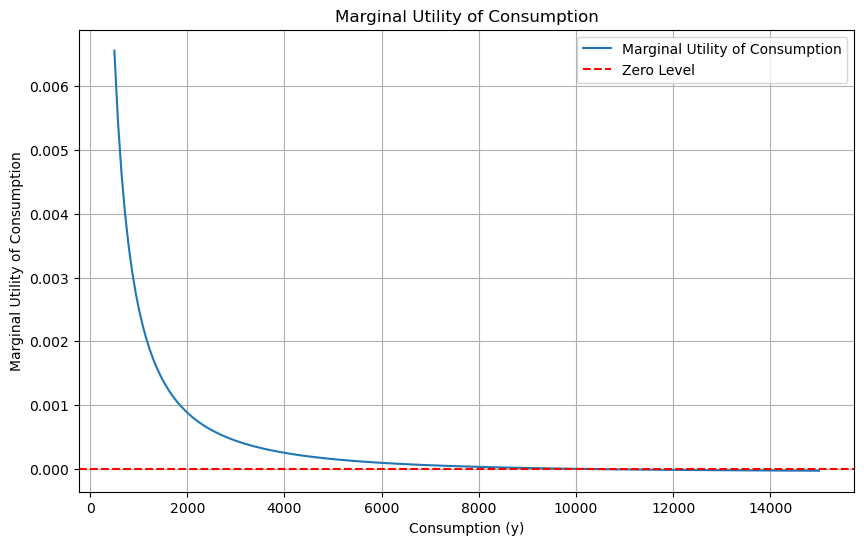

In [133]:
# Estimated parameters and plotting 
alpha = 9.53678
beta =   42.68283 
gamma_yy  = -.5462468 
gamma_ll = -5.709398 
gamma_yl = .1369558

# Define a range of consumption (y) values
y_values = np.linspace(500, 15000, 200)  # Avoid zero to prevent division by zero

# Calculate the marginal utility for each y value using the mean log leisure (logl)
marginal_utility_values = marginal_utility_y(y_values, alpha, gamma_yy, gamma_yl, mean_logl)

# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(y_values, marginal_utility_values, label='Marginal Utility of Consumption')
plt.axhline(y=0, color='r', linestyle='--', label='Zero Level')
plt.xlabel('Consumption (y)')
plt.ylabel('Marginal Utility of Consumption')
plt.title('Marginal Utility of Consumption')
plt.legend()
plt.grid(True)
plt.show()


### revised Heterogeneity code 

In [458]:
# Assuming wide_df is your transformed DataFrame
database = db.Database('labour_supply', wide_df)
globals().update(database.variables)

# Define the parameters to be estimated
alpha = Beta('alpha', 67.2, None, None, 0)
beta = Beta('beta', 120, None, None, 0)
gamma_yy = Beta('gamma_yy', -1 , None, None, 0)
gamma_ll = Beta('gamma_ll', -8.3, None, None, 0)
gamma_yl = Beta('gamma_yl', -0.486, None, None, 0)

# Define heterogeneity parameters for age and gender
alpha_dag = Beta('alpha_dag',0.0183, None, None, 0)
alpha_dgn = Beta('alpha_dgn', 0.537, None, None, 0)
alpha_dncsy = Beta('alpha_dncsy', -3, None, None, 0)

beta_dag = Beta('beta_dag', -0.0126, None, None, 0)
beta_dgn = Beta('beta_dgn', -0.969, None, None, 0)
beta_dncsy = Beta('beta_dncsy', -2.92, None, None, 0)


Column deh_1 in the database does contain bool
Column deh_2 in the database does contain bool
Column deh_3 in the database does contain bool
Column deh_4 in the database does contain bool
Column deh_5 in the database does contain bool
Column dms_3 in the database does contain bool
Column dms_4 in the database does contain bool
Column dms_5 in the database does contain bool
Column dcz_2 in the database does contain bool
Column dcz_3 in the database does contain bool
Column lindi_1 in the database does contain bool
Column lindi_2 in the database does contain bool
Column lindi_3 in the database does contain bool
Column lindi_4 in the database does contain bool
Column lindi_5 in the database does contain bool
Column lindi_6 in the database does contain bool
Column lindi_7 in the database does contain bool
Column lindi_8 in the database does contain bool
Column lindi_9 in the database does contain bool
Column lindi_10 in the database does contain bool
Column lindi_11 in the database does co

BiogemeError: Column deh_1 in the database does contain bool
Column deh_2 in the database does contain bool
Column deh_3 in the database does contain bool
Column deh_4 in the database does contain bool
Column deh_5 in the database does contain bool
Column dms_3 in the database does contain bool
Column dms_4 in the database does contain bool
Column dms_5 in the database does contain bool
Column dcz_2 in the database does contain bool
Column dcz_3 in the database does contain bool
Column lindi_1 in the database does contain bool
Column lindi_2 in the database does contain bool
Column lindi_3 in the database does contain bool
Column lindi_4 in the database does contain bool
Column lindi_5 in the database does contain bool
Column lindi_6 in the database does contain bool
Column lindi_7 in the database does contain bool
Column lindi_8 in the database does contain bool
Column lindi_9 in the database does contain bool
Column lindi_10 in the database does contain bool
Column lindi_11 in the database does contain bool
Column lindi_12 in the database does contain bool
Column amrtn_2 in the database does contain bool
Column amrtn_3 in the database does contain bool
Column amrtn_4 in the database does contain bool
Column amrtn_6 in the database does contain bool

In [459]:
# Update dictionaries for the alpha and beta parameters using the mode
def create_alpha_beta_dict(levels, prefix, mode):
    return {level: Beta(f'{prefix}_{level}', 0 if level != mode else 0, None, None, 0) for level in levels}

deh_levels = [col for col in long_df.columns if 'deh_' in col]
dms_levels = [col for col in long_df.columns if 'dms_' in col]
dcz_levels = [col for col in long_df.columns if 'dcz_' in col]
lindi_levels = [col for col in long_df.columns if 'lindi_' in col]
amrtn_levels = [col for col in long_df.columns if 'amrtn_' in col]

alpha_deh = create_alpha_beta_dict(deh_levels, 'alpha', mode_deh)
beta_deh = create_alpha_beta_dict(deh_levels, 'beta', mode_deh)

alpha_dms = create_alpha_beta_dict(dms_levels, 'alpha', mode_dms)
beta_dms = create_alpha_beta_dict(dms_levels, 'beta', mode_dms)

alpha_dcz = create_alpha_beta_dict(dcz_levels, 'alpha', mode_dcz)
beta_dcz = create_alpha_beta_dict(dcz_levels, 'beta', mode_dcz)

alpha_lindi = create_alpha_beta_dict(lindi_levels, 'alpha', mode_lindi)
beta_lindi = create_alpha_beta_dict(lindi_levels, 'beta', mode_lindi)

alpha_amrtn = create_alpha_beta_dict(amrtn_levels, 'alpha', mode_amrtn)
beta_amrtn = create_alpha_beta_dict(amrtn_levels, 'beta', mode_amrtn)

# Combine all alpha and beta dictionaries
alpha_dict = {**alpha_deh, **alpha_dms, **alpha_dcz, **alpha_lindi, **alpha_amrtn}
beta_dict = {**beta_deh, **beta_dms, **beta_dcz, **beta_lindi, **beta_amrtn}

# Helper function to create utility
def create_utility(logy, logl, logy2, logl2, logyl, alpha_dict, beta_dict):
    alpha_sum = alpha + alpha_dag * normalized_age + alpha_dgn * dgn + alpha_dncsy * normalized_dncsy + \
        sum(alpha_dict[level] * Variable(level) for level in alpha_dict)
    
    beta_sum = beta + beta_dag * normalized_age + beta_dgn * dgn + beta_dncsy * normalized_dncsy + \
        sum(beta_dict[level] * Variable(level) for level in beta_dict)
    
    return alpha_sum * logy + beta_sum * logl + gamma_yy * logy2 + gamma_ll * logl2 + gamma_yl * logyl


In [366]:
# Generate the utility functions using the helper function
V = {
    0: create_utility(logy_h0, logl_h0, logy2_h0, logl2_h0, logyl_h0, alpha_dict, beta_dict),
    1: create_utility(logy_h1, logl_h1, logy2_h1, logl2_h1, logyl_h1, alpha_dict, beta_dict),
    2: create_utility(logy_h2, logl_h2, logy2_h2, logl2_h2, logyl_h2, alpha_dict, beta_dict),
    3: create_utility(logy_h3, logl_h3, logy2_h3, logl2_h3, logyl_h3, alpha_dict, beta_dict),
}

# Define the availability of each choice (all choices are available)
av = {0: 1, 1: 1, 2: 1, 3: 1}

# Associate the utility functions with the choice situations
logprob = models.loglogit(V, av, choice)


In [367]:
# Create the Biogeme object
biogeme_model = bio.BIOGEME(database, logprob)
biogeme_model.modelName = 'Revised2NOrmalized_householdLS_superhetero'
biogeme_model.choice = choice

# Estimate the parameters
results = biogeme_model.estimate()

# Print the estimated parameters
print(results.getEstimatedParameters())

It seems that the optimization algorithm did not converge. Therefore, the results may not correspond to the maximum likelihood estimator. Check the specification of the model, or the criteria for convergence of the algorithm.


                     Value  Rob. Std err  Rob. t-test  Rob. p-value
alpha            67.798202      2.226512    30.450408  0.000000e+00
alpha_amrtn_2    -1.000179      0.213449    -4.685795  2.788754e-06
alpha_amrtn_3    -1.024494      0.216040    -4.742154  2.114582e-06
alpha_amrtn_4    -2.033129      0.420566    -4.834272  1.336336e-06
alpha_amrtn_6    -1.503548      0.280524    -5.359779  8.332362e-08
alpha_dag         0.192629      0.085908     2.242276  2.494352e-02
alpha_dcz_2      -1.906995      0.404828    -4.710624  2.469597e-06
alpha_dcz_3      -1.331515      0.255921    -5.202827  1.962794e-07
alpha_deh_1       1.272387      0.708145     1.796788  7.236924e-02
alpha_deh_2       1.104838      0.654445     1.688206  9.137168e-02
alpha_deh_3       1.616897      0.664298     2.433993  1.493326e-02
alpha_deh_4       2.978991      0.958667     3.107431  1.887208e-03
alpha_deh_5       2.166266      0.648206     3.341943  8.319425e-04
alpha_dgn         0.537761      0.174987     3.0

In [460]:
# Define the updated estimated parameters
alpha = 67.798202
alpha_amrtn_2 = -1.000179
alpha_amrtn_3 = -1.024494
alpha_amrtn_4 = -2.033129
alpha_amrtn_6 = -1.503548
alpha_dag = 0.192629
alpha_dcz_2 = -1.906995
alpha_dcz_3 = -1.331515
alpha_deh_1 = 1.272387
alpha_deh_2 = 1.104838
alpha_deh_3 = 1.616897
alpha_deh_4 = 2.978991
alpha_deh_5 = 2.166266
alpha_dgn = 0.537761
alpha_dms_3 = 0.080187
alpha_dms_4 = -0.368369
alpha_dms_5 = 0.573518
alpha_dncsy = -0.197481
alpha_lindi_1 = -53.330895
alpha_lindi_10 = -51.068817
alpha_lindi_11 = -50.554685
alpha_lindi_12 = -53.010467
alpha_lindi_2 = -50.747341
alpha_lindi_3 = -51.768416
alpha_lindi_4 = -50.249482
alpha_lindi_5 = -52.652610
alpha_lindi_6 = -53.344687
alpha_lindi_7 = -49.711240
alpha_lindi_8 = -51.258262
alpha_lindi_9 = -50.250440
beta = 119.405143
beta_amrtn_2 = -0.023609
beta_amrtn_3 = -0.052292
beta_amrtn_4 = -0.939645
beta_amrtn_6 = -0.043044
beta_dag = -0.131259
beta_dcz_2 = -1.822621
beta_dcz_3 = -0.399696
beta_deh_1 = 0.157993
beta_deh_2 = -0.494409
beta_deh_3 = 0.111496
beta_deh_4 = 1.114048
beta_deh_5 = -0.351453
beta_dgn = -0.969491
beta_dms_3 = 0.240243
beta_dms_4 = -0.313458
beta_dms_5 = 0.474376
beta_dncsy = -0.192210
beta_lindi_1 = -56.167728
beta_lindi_10 = -52.551029
beta_lindi_11 = -53.139125
beta_lindi_12 = -53.884916
beta_lindi_2 = -53.133321
beta_lindi_3 = -54.181428
beta_lindi_4 = -53.263100
beta_lindi_5 = -55.359251
beta_lindi_6 = -55.776438
beta_lindi_7 = -51.366112
beta_lindi_8 = -53.483281
beta_lindi_9 = -52.106530
gamma_ll = -8.301481
gamma_yl = -0.485772
gamma_yy = -1.003010


### here 

In [513]:
params = {
    'alpha': 67.798202,
    'alpha_amrtn_2': -1.000179,
    'alpha_amrtn_3': -1.024494,
    'alpha_amrtn_4': -2.033129,
    'alpha_amrtn_6': -1.503548,
    'alpha_dag': 0.192629,
    'alpha_dcz_2': -1.906995,
    'alpha_dcz_3': -1.331515,
    'alpha_deh_1': 1.272387,
    'alpha_deh_2': 1.104838,
    'alpha_deh_3': 1.616897,
    'alpha_deh_4': 2.978991,
    'alpha_deh_5': 2.166266,
    'alpha_dgn': 0.537761,
    'alpha_dms_3': 0.080187,
    'alpha_dms_4': -0.368369,
    'alpha_dms_5': 0.573518,
    'alpha_dncsy': -0.197481,
    'alpha_lindi_1': -53.330895,
    'alpha_lindi_10': -51.068817,
    'alpha_lindi_11': -50.554685,
    'alpha_lindi_12': -53.010467,
    'alpha_lindi_2': -50.747341,
    'alpha_lindi_3': -51.768416,
    'alpha_lindi_4': -50.249482,
    'alpha_lindi_5': -52.652610,
    'alpha_lindi_6': -53.344687,
    'alpha_lindi_7': -49.711240,
    'alpha_lindi_8': -51.258262,
    'alpha_lindi_9': -50.250440,
    'beta': 119.405143,
    'beta_amrtn_2': -0.023609,
    'beta_amrtn_3': -0.052292,
    'beta_amrtn_4': -0.939645,
    'beta_amrtn_6': -0.043044,
    'beta_dag': -0.131259,
    'beta_dcz_2': -1.822621,
    'beta_dcz_3': -0.399696,
    'beta_deh_1': 0.157993,
    'beta_deh_2': -0.494409,
    'beta_deh_3': 0.111496,
    'beta_deh_4': 1.114048,
    'beta_deh_5': -0.351453,
    'beta_dgn': -0.969491,
    'beta_dms_3': 0.240243,
    'beta_dms_4': -0.313458,
    'beta_dms_5': 0.474376,
    'beta_dncsy': -0.192210,
    'beta_lindi_1': -56.167728,
    'beta_lindi_10': -52.551029,
    'beta_lindi_11': -53.139125,
    'beta_lindi_12': -53.884916,
    'beta_lindi_2': -53.133321,
    'beta_lindi_3': -54.181428,
    'beta_lindi_4': -53.263100,
    'beta_lindi_5': -55.359251,
    'beta_lindi_6': -55.776438,
    'beta_lindi_7': -51.366112,
    'beta_lindi_8': -53.483281,
    'beta_lindi_9': -52.106530,
    'gamma_ll': -8.301481,
    'gamma_yl': -0.485772,
    'gamma_yy': -1.003010
}


In [514]:
# Compute the utility for each observation
def compute_utility(row):
    alpha_part = (
        params['alpha'] +
        params['alpha_dag'] * row['normalized_age'] +
        params['alpha_dgn'] * row['dgn'] +
        params['alpha_dncsy'] * row['normalized_dncsy'] +
        params['alpha_amrtn_2'] * row['amrtn_2'] +
        params['alpha_amrtn_3'] * row['amrtn_3'] +
        params['alpha_amrtn_4'] * row['amrtn_4'] +
        params['alpha_amrtn_6'] * row['amrtn_6'] +
        params['alpha_dcz_2'] * row['dcz_2'] +
        params['alpha_dcz_3'] * row['dcz_3'] +
        params['alpha_deh_1'] * row['deh_1'] +
        params['alpha_deh_2'] * row['deh_2'] +
        params['alpha_deh_3'] * row['deh_3'] +
        params['alpha_deh_4'] * row['deh_4'] +
        params['alpha_deh_5'] * row['deh_5'] +
        params['alpha_dms_3'] * row['dms_3'] +
        params['alpha_dms_4'] * row['dms_4'] +
        params['alpha_dms_5'] * row['dms_5'] +
        params['alpha_lindi_1'] * row['lindi_1'] +
        params['alpha_lindi_2'] * row['lindi_2'] +
        params['alpha_lindi_3'] * row['lindi_3'] +
        params['alpha_lindi_4'] * row['lindi_4'] +
        params['alpha_lindi_5'] * row['lindi_5'] +
        params['alpha_lindi_6'] * row['lindi_6'] +
        params['alpha_lindi_7'] * row['lindi_7'] +
        params['alpha_lindi_8'] * row['lindi_8'] +
        params['alpha_lindi_9'] * row['lindi_9'] +
        params['alpha_lindi_10'] * row['lindi_10'] +
        params['alpha_lindi_11'] * row['lindi_11'] +
        params['alpha_lindi_12'] * row['lindi_12']
    )
    
    beta_part = (
        params['beta'] +
        params['beta_dag'] * row['normalized_age'] +
        params['beta_dgn'] * row['dgn'] +
        params['beta_dncsy'] * row['normalized_dncsy'] +
        params['beta_amrtn_2'] * row['amrtn_2'] +
        params['beta_amrtn_3'] * row['amrtn_3'] +
        params['beta_amrtn_4'] * row['amrtn_4'] +
        params['beta_amrtn_6'] * row['amrtn_6'] +
        params['beta_dcz_2'] * row['dcz_2'] +
        params['beta_dcz_3'] * row['dcz_3'] +
        params['beta_deh_1'] * row['deh_1'] +
        params['beta_deh_2'] * row['deh_2'] +
        params['beta_deh_3'] * row['deh_3'] +
        params['beta_deh_4'] * row['deh_4'] +
        params['beta_deh_5'] * row['deh_5'] +
        params['beta_dms_3'] * row['dms_3'] +
        params['beta_dms_4'] * row['dms_4'] +
        params['beta_dms_5'] * row['dms_5'] +
        params['beta_lindi_1'] * row['lindi_1'] +
        params['beta_lindi_2'] * row['lindi_2'] +
        params['beta_lindi_3'] * row['lindi_3'] +
        params['beta_lindi_4'] * row['lindi_4'] +
        params['beta_lindi_5'] * row['lindi_5'] +
        params['beta_lindi_6'] * row['lindi_6'] +
        params['beta_lindi_7'] * row['lindi_7'] +
        params['beta_lindi_8'] * row['lindi_8'] +
        params['beta_lindi_9'] * row['lindi_9'] +
        params['beta_lindi_10'] * row['lindi_10'] +
        params['beta_lindi_11'] * row['lindi_11']
    )
    
    utility = (
        alpha_part * row['logy'] +
        beta_part * row['logl'] +
        params['gamma_yy'] * row['logy2'] +
        params['gamma_ll'] * row['logl2'] +
        params['gamma_yl'] * row['logyl']
    )
    
    return utility

long_df['utility'] = long_df.apply(compute_utility, axis=1)


In [516]:
# Calculate the likelihood for each observation

def compute_likelihood(df):
    # Compute the maximum utility for each person
    max_utility = df.groupby('idperson')['utility'].transform('max')
    
    # Stabilize the utility values by subtracting the maximum utility
    df['stabilized_utility'] = df['utility'] - max_utility
    
    # Calculate the exponentials of the stabilized utility values
    df['exp_stabilized_utility'] = np.exp(df['stabilized_utility'])
    
    # Sum of exponentials of stabilized utility values for each person
    sum_exp_stabilized_utility = df.groupby('idperson')['exp_stabilized_utility'].transform('sum')
    
    # Calculate the likelihood using the log-sum-exp trick
    df['likelihood'] = df['exp_stabilized_utility'] / sum_exp_stabilized_utility
    
    # Drop the intermediate columns as they are no longer needed
    df.drop(columns=['stabilized_utility', 'exp_stabilized_utility'], inplace=True)
    
    return df

long_df = compute_likelihood(long_df)



In [517]:
# Compute marginal utility with respect to income (hyds)
def compute_marginal_utility_income(row):
    alpha_part = (
        params['alpha'] +
        params['alpha_dag'] * row['normalized_age'] +
        params['alpha_dgn'] * row['dgn'] +
        params['alpha_dncsy'] * row['normalized_dncsy'] +
        params['alpha_amrtn_2'] * row['amrtn_2'] +
        params['alpha_amrtn_3'] * row['amrtn_3'] +
        params['alpha_amrtn_4'] * row['amrtn_4'] +
        params['alpha_amrtn_6'] * row['amrtn_6'] +
        params['alpha_dcz_2'] * row['dcz_2'] +
        params['alpha_dcz_3'] * row['dcz_3'] +
        params['alpha_deh_1'] * row['deh_1'] +
        params['alpha_deh_2'] * row['deh_2'] +
        params['alpha_deh_3'] * row['deh_3'] +
        params['alpha_deh_4'] * row['deh_4'] +
        params['alpha_deh_5'] * row['deh_5'] +
        params['alpha_dms_3'] * row['dms_3'] +
        params['alpha_dms_4'] * row['dms_4'] +
        params['alpha_dms_5'] * row['dms_5'] +
        params['alpha_lindi_1'] * row['lindi_1'] +
        params['alpha_lindi_2'] * row['lindi_2'] +
        params['alpha_lindi_3'] * row['lindi_3'] +
        params['alpha_lindi_4'] * row['lindi_4'] +
        params['alpha_lindi_5'] * row['lindi_5'] +
        params['alpha_lindi_6'] * row['lindi_6'] +
        params['alpha_lindi_7'] * row['lindi_7'] +
        params['alpha_lindi_8'] * row['lindi_8'] +
        params['alpha_lindi_9'] * row['lindi_9'] +
        params['alpha_lindi_10'] * row['lindi_10'] +
        params['alpha_lindi_11'] * row['lindi_11'] +
        params['alpha_lindi_12'] * row['lindi_12']
    )
    
    marginal_utility = (alpha_part + 2 * params['gamma_yy'] * row['logy'] + params['gamma_yl'] * row['logl']) / row['hyds']
    return marginal_utility

# Apply the function to compute the marginal utility for each observation
long_df['marginal_utility'] = long_df.apply(compute_marginal_utility_income, axis=1)


In [518]:
# Determine the predicted choice by selecting the scenario with the highest likelihood for each person
predicted_choice = long_df.loc[long_df.groupby('idperson')['likelihood'].idxmax()]
long_df = long_df.merge(predicted_choice[['idperson', 'scenario']], on='idperson', suffixes=('', '_predicted'))
long_df.rename(columns={'scenario_predicted': 'predicted_choice'}, inplace=True)

# Display the dataframe to verify the results
print(long_df[['idperson', 'scenario', 'utility', 'likelihood', 'marginal_utility', 'predicted_choice']].head(20))


    idperson scenario     utility    likelihood  marginal_utility  \
0   87060001       h0  189.979775  1.879645e-03          0.003417   
1   87060001       h2  196.087750  8.447640e-01          0.000406   
2   87060001       h3  194.236745  1.326949e-01          0.000255   
3   87060001       h1  192.376959  2.066139e-02          0.002489   
4   87070001       h0  797.537657  9.968760e-01          0.034396   
5   87070001       h2  775.024935  1.665292e-10          0.034551   
6   87070001       h1  791.772137  3.123975e-03          0.034438   
7   87070001       h3  733.362265  1.341599e-28          0.034787   
8   87090001       h1  202.176004  1.898162e-02          0.002124   
9   87090001       h3  204.064641  1.254751e-01          0.000150   
10  87090001       h2  205.982884  8.543582e-01          0.000331   
11  87090001       h0  199.402386  1.185131e-03          0.004393   
12  87380001       h3  198.076091  5.252538e-02         -0.000012   
13  87380001       h2  200.811269 

In [519]:
# Create the binary column P_choice
long_df['P_choice'] = (long_df['scenario'] == long_df['predicted_choice']).astype(int)

# Filter the dataframe for P_choice = 1 and marginal_utility < 0
filtered_df = long_df[(long_df['P_choice'] == 1) & (long_df['marginal_utility'] < 0)]

# Count the number of unique idperson
num_people = filtered_df['idperson'].nunique()

# Print the result
print(f"Number of people with P_choice = 1 and marginal utility < 0: {num_people}")


Number of people with P_choice = 1 and marginal utility < 0: 2082


In [520]:
long_df.to_csv('long_mar2.csv')

In [521]:
# Add 'choice_made' column: 1 if the scenario is the same as the original_scenario, otherwise 0
long_df['choice_made'] = (long_df['scenario'] == long_df['original_scenario']).astype(int)

# Add 'predicted_choice_binary' column: 1 if the scenario is the same as the predicted_choice, otherwise 0
long_df['predicted_choice_binary'] = (long_df['scenario'] == long_df['predicted_choice']).astype(int)

# Filter the DataFrame to keep only the rows where 'scenario' matches 'original_scenario'
filtered_df = long_df[long_df['scenario'] == long_df['original_scenario']]
# Create a pivot table to count the occurrences of each combination of original and predicted choices
confusion_matrix = pd.crosstab(filtered_df['original_scenario'], filtered_df['predicted_choice'], rownames=['Original Choice'], colnames=['Predicted Choice'])

# Add the row and column totals
confusion_matrix['Total'] = confusion_matrix.sum(axis=1)
confusion_matrix.loc['Total'] = confusion_matrix.sum(axis=0)

# Display the confusion matrix with totals
print(confusion_matrix)

# If needed, save the confusion matrix to a CSV file
confusion_matrix.to_csv('confusion_matrix_with_totalshetero1.csv')

Predicted Choice   h0  h1    h2   h3  Total
Original Choice                            
h0                 60   0     1    0     61
h1                 99   2   455    5    561
h2                267   2  3974    9   4252
h3                 32   0   418  114    564
Total             458   4  4848  128   5438


In [297]:
# Create the Biogeme object
biogeme_model = bio.BIOGEME(database, logprob)
biogeme_model.modelName = 'Revised_householdLS_superhetero'
biogeme_model.choice = choice

# Estimate the parameters
results = biogeme_model.estimate()

# Print the estimated parameters
print(results.getEstimatedParameters())

It seems that the optimization algorithm did not converge. Therefore, the results may not correspond to the maximum likelihood estimator. Check the specification of the model, or the criteria for convergence of the algorithm.


                     Value  Rob. Std err  Rob. t-test  Rob. p-value
alpha            62.559698      2.195840    28.490097  0.000000e+00
alpha_amrtn_2    -0.998891      0.213426    -4.680263  2.865064e-06
alpha_amrtn_3    -1.023907      0.216007    -4.740157  2.135530e-06
alpha_amrtn_4    -2.031404      0.420742    -4.828150  1.378070e-06
alpha_amrtn_6    -1.502049      0.280563    -5.353689  8.617903e-08
alpha_dag         0.018423      0.008207     2.244807  2.478049e-02
alpha_dcz_2      -1.904655      0.404932    -4.703645  2.555579e-06
alpha_dcz_3      -1.330208      0.255985    -5.196427  2.031550e-07
alpha_deh_1       1.281967      0.707459     1.812072  6.997508e-02
alpha_deh_2       1.114800      0.653710     1.705344  8.813024e-02
alpha_deh_3       1.626575      0.663559     2.451289  1.423456e-02
alpha_deh_4       2.990362      0.958349     3.120328  1.806500e-03
alpha_deh_5       2.175284      0.647488     3.359576  7.806217e-04
alpha_dgn         0.536605      0.174989     3.0

In [298]:
# biogeme translog (revised Hetero max)
res = [ 62.559698,  115.748758 ,  -1.003488 , -8.301310, -0.486502  ]   
# Automated calculation of points where marginal utilities become negative
mu_y_neg = np.exp(- (res[0] + res[4] * df_filtered['logl'].mean()) / ( 2 * res[2]))
mu_l_neg = np.exp(- (res[1] + res[4] * df_filtered['logy'].mean()) / (2* res[3]))

print(f"Income level at which MU of income becomes negative: {mu_y_neg}")
print(f"Leisure level at which MU of leisure becomes negative: {mu_l_neg}")

Income level at which MU of income becomes negative: 13441374860550.574
Leisure level at which MU of leisure becomes negative: 857.2041845581749


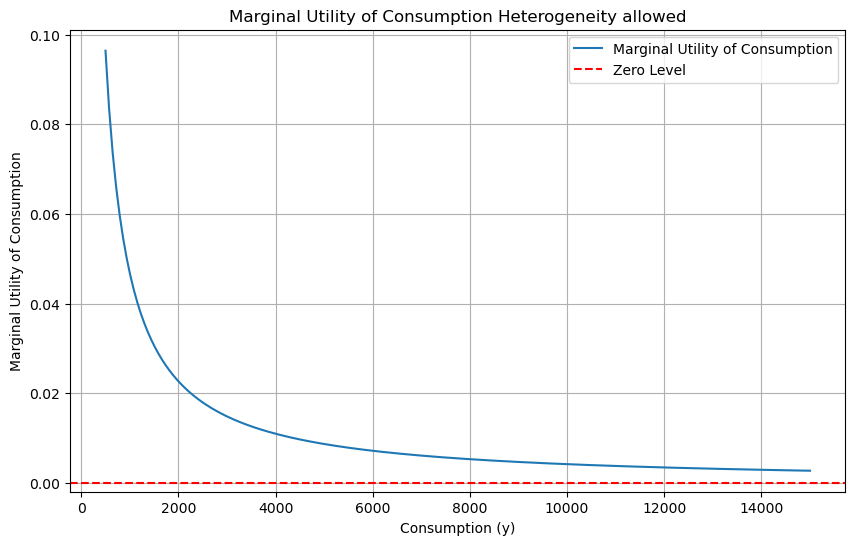

In [300]:
# Estimated parameters and plotting 
alpha = 62.559698
beta =   115.748758 
gamma_yy  = -1.003488 
gamma_ll = -8.301310
gamma_yl = -0.486502

# Define a range of consumption (y) values
y_values = np.linspace(500, 15000, 200)  # Avoid zero to prevent division by zero

# Calculate the marginal utility for each y value using the mean log leisure (logl)
marginal_utility_values = marginal_utility_y(y_values, alpha, gamma_yy, gamma_yl, mean_logl)

# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(y_values, marginal_utility_values, label='Marginal Utility of Consumption')
plt.axhline(y=0, color='r', linestyle='--', label='Zero Level')
plt.xlabel('Consumption (y)')
plt.ylabel('Marginal Utility of Consumption')
plt.title('Marginal Utility of Consumption Heterogeneity allowed')
plt.legend()
plt.grid(True)
plt.show()


## Regular MLE No biogeme 

In [ ]:
# Jacobian 
def jacobian(params, df):
    epsilon = np.sqrt(np.finfo(float).eps)
    grad = approx_fprime(params, lambda p: total_likelihood(p,df ), epsilon)
    return grad
## Trnslog 
def utility(params, row):
    # Unpacking parameters
    alpha, beta, gamma_yy, gamma_ll, gamma_yl = params[:5]
    # Calculating the logs of income and leisure
    log_y = row['logy']
    log_l = row['logl']
    log_y2 = row['logy2']
    log_l2 = row['logl2']
    logyl = row['logyl']
    # Translog utility function
    return alpha * log_y + beta * log_l + gamma_yy * log_y2 +  gamma_ll * log_l2 + gamma_yl * logyl

def ind_likelihood(params, group):
    utilities = group.apply(lambda row: utility(params, row), axis=1)
    chosen_utility = utilities[group['choice_made'] == 1].iloc[0] if any(group['choice_made'] == 1) else None
    if chosen_utility is not None:
        # Only consider scenarios where a choice is made
        log_prob_chosen = chosen_utility - logsumexp(utilities)
        return -log_prob_chosen  # Negative log likelihood
    else:
        return 0

def total_likelihood(params, df):
    # Grouping by individual and calculating likelihood per group
    total_ll = df.groupby('idperson').apply(lambda group: ind_likelihood(params, group)).sum()
    return total_ll



In [ ]:
## model
initial_params = [ 11.64077,   56.65185 ,  -.5632375 ,  -7.120488 , -.446051 ]   

# Optimization
result = minimize(fun=total_likelihood, x0=initial_params, args=(df_filtered,), method='Newton-CG', jac=jacobian)

print(f'Optimization result Translog cleaned data : {result}')

### splitted data Male VS female 

## NO heterogeneity 

In [303]:
### Male female databases 
df_male = wide_df[wide_df['dgn'] == 1]
df_female = wide_df[wide_df['dgn'] == 0]

In [146]:
# Create Biogeme database for males
database_male = db.Database('labour_supply_male', df_male)

# Create Biogeme database for females
database_female = db.Database('labour_supply_female', df_female)

In [147]:
## Defining name of the variables as python variables       

globals().update(database.variables)

In [148]:
# Define variables for each scenario in the male dataset
logy_h0 = Variable('logy_h0')
logl_h0 = Variable('logl_h0')
logy2_h0 = Variable('logy2_h0')
logl2_h0 = Variable('logl2_h0')
logyl_h0 = Variable('logyl_h0')

logy_h1 = Variable('logy_h1')
logl_h1 = Variable('logl_h1')
logy2_h1 = Variable('logy2_h1')
logl2_h1 = Variable('logl2_h1')
logyl_h1 = Variable('logyl_h1')

logy_h2 = Variable('logy_h2')
logl_h2 = Variable('logl_h2')
logy2_h2 = Variable('logy2_h2')
logl2_h2 = Variable('logl2_h2')
logyl_h2 = Variable('logyl_h2')

logy_h3 = Variable('logy_h3')
logl_h3 = Variable('logl_h3')
logy2_h3 = Variable('logy2_h3')
logl2_h3 = Variable('logl2_h3')
logyl_h3 = Variable('logyl_h3')

choice = Variable('choice_made')

# Define parameters to be estimated
alpha = Beta('alpha', 0, None, None, 0)
beta = Beta('beta', 0, None, None, 0)
gamma_yy = Beta('gamma_yy', 0, None, None, 0)
gamma_ll = Beta('gamma_ll', 0, None, None, 0)
gamma_yl = Beta('gamma_yl', 0, None, None, 0)

# Define the utility functions for males
V_male = {
    0: alpha * logy_h0 + beta * logl_h0 + gamma_yy * logy2_h0 + gamma_ll * logl2_h0 + gamma_yl * logyl_h0,
    1: alpha * logy_h1 + beta * logl_h1 + gamma_yy * logy2_h1 + gamma_ll * logl2_h1 + gamma_yl * logyl_h1,
    2: alpha * logy_h2 + beta * logl_h2 + gamma_yy * logy2_h2 + gamma_ll * logl2_h2 + gamma_yl * logyl_h2,
    3: alpha * logy_h3 + beta * logl_h3 + gamma_yy * logy2_h3 + gamma_ll * logl2_h3 + gamma_yl * logyl_h3
}

# Define the availability of each choice (all choices are available)
av_male = {0: 1, 1: 1, 2: 1, 3: 1}

# Associate the utility functions with the choice situations
logprob_male = models.loglogit(V_male, av_male, choice)


In [149]:
# Create the Biogeme object for males
biogeme_model_male = bio.BIOGEME(database_male, logprob_male)
biogeme_model_male.modelName = 'householdLS_male'
# Set the choice variable
biogeme_model.choice = choice
# Estimate the parameters for males
results_male = biogeme_model_male.estimate()

# Print the estimated parameters for males
print("Male Model Parameters")
print(results_male.getEstimatedParameters())


Male Model Parameters
              Value  Rob. Std err  Rob. t-test  Rob. p-value
alpha      0.960337      1.107824     0.866868      0.386015
beta      50.084091      5.278564     9.488204      0.000000
gamma_ll  -4.756821      0.490032    -9.707162      0.000000
gamma_yl  -0.256847      0.228453    -1.124288      0.260891
gamma_yy   0.015864      0.022063     0.719039      0.472117


In [217]:
### Male female databases 
long_male = long_df[long_df['dgn'] == 1]
long_female = long_df[long_df['dgn'] == 0]

In [151]:
# Mean values males
mean_logl = long_male['logl'].mean()
mean_logy = long_male['logy'].mean()

print(f'Mean log leisur males: {mean_logl}')
print(f'Mean log of consumption males : {mean_logy}')

Mean log leisur males: 3.884016190329853
Mean log of consumption males : 7.465292244184608


In [152]:
#Mean values females 
mean_logl = long_female['logl'].mean()
mean_logy = long_female['logy'].mean()

print(f'Mean log leisure females: {mean_logl}')
print(f'Mean log of consumption females : {mean_logy}')

Mean log leisure females: 3.886091975627356
Mean log of consumption females : 7.417923808470349


In [154]:
# male translog (household)
res = [ 0.960337 ,  50.084091, 0.015864  , -4.756821 ,  -0.256847  ]   
# Automated calculation of points where marginal utilities become negative
mu_y_neg = np.exp(- (res[0] + res[4] * mean_logl) / ( 2 * res[2]))
mu_l_neg = np.exp(- (res[1] + res[4] * mean_logy) / (2* res[3]))

print(f"Income level at which MU of income becomes negative: {mu_y_neg}")
print(f"Leisure level at which MU of leisure becomes negative: {mu_l_neg}")

Income level at which MU of income becomes negative: 3.290994057060812
Leisure level at which MU of leisure becomes negative: 158.25102222982414


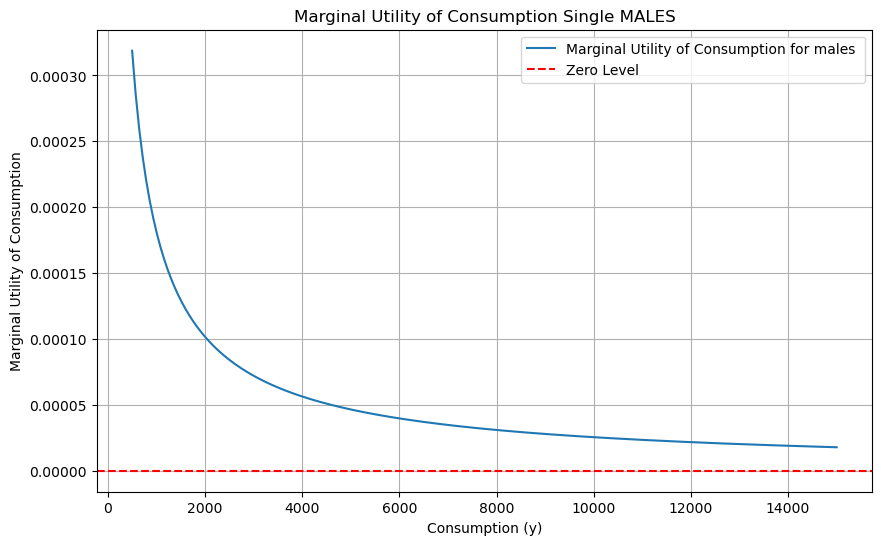

In [155]:
# Estimated parameters and plotting 
alpha = 0.960337 
beta = 50.084091  
gamma_yy  = 0.015864
gamma_ll = -4.756821 
gamma_yl = -0.256847 

# Define a range of consumption (y) values
y_values = np.linspace(500, 15000, 200)  # Avoid zero to prevent division by zero

# Calculate the marginal utility for each y value using the mean log leisure (logl)
marginal_utility_values = marginal_utility_y(y_values, alpha, gamma_yy, gamma_yl, mean_logl)

# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(y_values, marginal_utility_values, label='Marginal Utility of Consumption for males ')
plt.axhline(y=0, color='r', linestyle='--', label='Zero Level')
plt.xlabel('Consumption (y)')
plt.ylabel('Marginal Utility of Consumption')
plt.title('Marginal Utility of Consumption Single MALES')
plt.legend()
plt.grid(True)
plt.show()


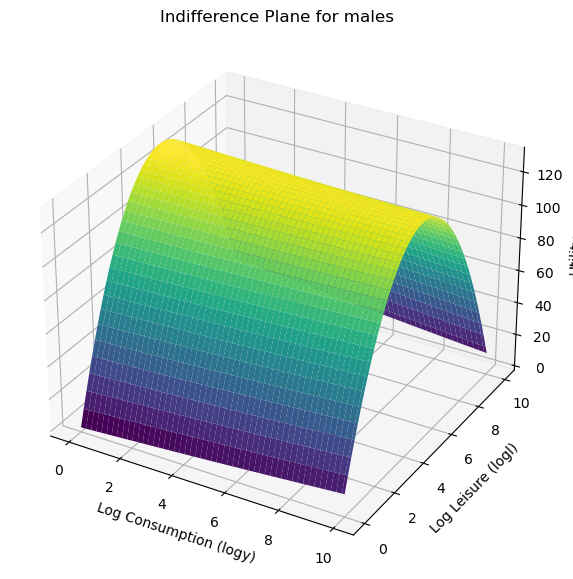

In [156]:
# Define the utility function with the estimated parameters
def utility(logy, logl, alpha, beta, gamma_yy, gamma_ll, gamma_yl):
    logy2 = logy ** 2
    logl2 = logl ** 2
    logyl = logy * logl
    return alpha * logy + beta * logl + gamma_yy * logy2 + gamma_ll * logl2 + gamma_yl * logyl

# Estimated parameters and plotting 
alpha = 0.960337 
beta = 50.084091  
gamma_yy  = 0.015864
gamma_ll = -4.756821 
gamma_yl = -0.256847 
# Generate a range of values for log consumption (logy) and log leisure (logl)
logy_values = np.linspace(0, 10, 100)
logl_values = np.linspace(0, 10, 100)

# Create a grid of values
logy_grid, logl_grid = np.meshgrid(logy_values, logl_values)
# Calculate utility for each combination of logy and logl
utility_values = utility(logy_grid, logl_grid, alpha, beta, gamma_yy, gamma_ll, gamma_yl)
# Create a 3D plot
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Plot the surface
ax.plot_surface(logy_grid, logl_grid, utility_values, cmap='viridis')

# Set labels
ax.set_xlabel('Log Consumption (logy)')
ax.set_ylabel('Log Leisure (logl)')
ax.set_zlabel('Utility')

# Set title
ax.set_title('Indifference Plane for males ')

# Show the plot
plt.show()


In [159]:
# Define variables for each scenario in the male dataset
logy_h0 = Variable('logy_h0')
logl_h0 = Variable('logl_h0')
logy2_h0 = Variable('logy2_h0')
logl2_h0 = Variable('logl2_h0')
logyl_h0 = Variable('logyl_h0')

logy_h1 = Variable('logy_h1')
logl_h1 = Variable('logl_h1')
logy2_h1 = Variable('logy2_h1')
logl2_h1 = Variable('logl2_h1')
logyl_h1 = Variable('logyl_h1')

logy_h2 = Variable('logy_h2')
logl_h2 = Variable('logl_h2')
logy2_h2 = Variable('logy2_h2')
logl2_h2 = Variable('logl2_h2')
logyl_h2 = Variable('logyl_h2')

logy_h3 = Variable('logy_h3')
logl_h3 = Variable('logl_h3')
logy2_h3 = Variable('logy2_h3')
logl2_h3 = Variable('logl2_h3')
logyl_h3 = Variable('logyl_h3')

choice = Variable('choice_made')

# Define parameters to be estimated
alpha = Beta('alpha', 0, None, None, 0)
beta = Beta('beta', 0, None, None, 0)
gamma_yy = Beta('gamma_yy', 0, None, None, 0)
gamma_ll = Beta('gamma_ll', 0, None, None, 0)
gamma_yl = Beta('gamma_yl', 0, None, None, 0)

In [160]:
# Define the utility functions forfemales
V_female = {
    0: alpha * logy_h0 + beta * logl_h0 + gamma_yy * logy2_h0 + gamma_ll * logl2_h0 + gamma_yl * logyl_h0,
    1: alpha * logy_h1 + beta * logl_h1 + gamma_yy * logy2_h1 + gamma_ll * logl2_h1 + gamma_yl * logyl_h1,
    2: alpha * logy_h2 + beta * logl_h2 + gamma_yy * logy2_h2 + gamma_ll * logl2_h2 + gamma_yl * logyl_h2,
    3: alpha * logy_h3 + beta * logl_h3 + gamma_yy * logy2_h3 + gamma_ll * logl2_h3 + gamma_yl * logyl_h3
}
# Define the availability of each choice (all choices are available)
av_female = {0: 1, 1: 1, 2: 1, 3: 1}

# Associate the utility functions with the choice situations
logprob_female = models.loglogit(V_female, av_female, choice)

# Create the Biogeme object for females
biogeme_model_female = bio.BIOGEME(database_female, logprob_female)
biogeme_model_female.modelName = 'householdLS_female'

# Estimate the parameters for females
results_female = biogeme_model_female.estimate()

# Print the estimated parameters for females
print("Female Model Parameters")
print(results_female.getEstimatedParameters())

Female Model Parameters
              Value  Rob. Std err  Rob. t-test  Rob. p-value
alpha      0.115549      1.077357     0.107252      0.914589
beta      44.614125      4.648351     9.597839      0.000000
gamma_ll  -4.344016      0.434403    -9.999970      0.000000
gamma_yl  -0.074425      0.208939    -0.356203      0.721689
gamma_yy   0.015924      0.027815     0.572490      0.566990


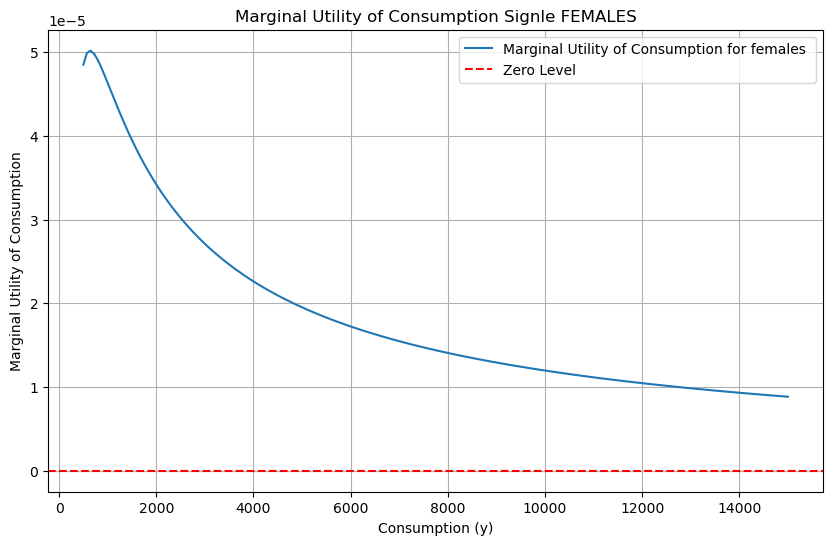

In [161]:
# Estimated parameters and plotting 
alpha = 0.115549 
beta = 44.614125 
gamma_yy  = 0.015924 
gamma_ll = -4.344016 
gamma_yl = -0.074425 

# Define a range of consumption (y) values
y_values = np.linspace(500, 15000, 200)  # Avoid zero to prevent division by zero

# Calculate the marginal utility for each y value using the mean log leisure (logl)
marginal_utility_values = marginal_utility_y(y_values, alpha, gamma_yy, gamma_yl, mean_logl)

# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(y_values, marginal_utility_values, label='Marginal Utility of Consumption for females ')
plt.axhline(y=0, color='r', linestyle='--', label='Zero Level')
plt.xlabel('Consumption (y)')
plt.ylabel('Marginal Utility of Consumption')
plt.title('Marginal Utility of Consumption Signle FEMALES')
plt.legend()
plt.grid(True)
plt.show()


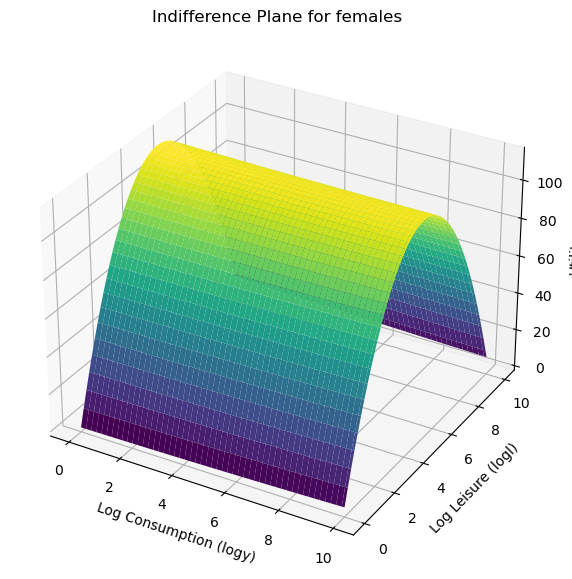

In [162]:
# Estimated parameters and plotting 
alpha = 0.115549 
beta = 44.614125 
gamma_yy  = 0.015924 
gamma_ll = -4.344016 
gamma_yl = -0.074425 
# Generate a range of values for log consumption (logy) and log leisure (logl)
logy_values = np.linspace(0, 10, 100)
logl_values = np.linspace(0, 10, 100)

# Create a grid of values
logy_grid, logl_grid = np.meshgrid(logy_values, logl_values)
# Calculate utility for each combination of logy and logl
utility_values = utility(logy_grid, logl_grid, alpha, beta, gamma_yy, gamma_ll, gamma_yl)
# Create a 3D plot
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Plot the surface
ax.plot_surface(logy_grid, logl_grid, utility_values, cmap='viridis')

# Set labels
ax.set_xlabel('Log Consumption (logy)')
ax.set_ylabel('Log Leisure (logl)')
ax.set_zlabel('Utility')

# Set title
ax.set_title('Indifference Plane for females ')

# Show the plot
plt.show()


## Heterigeneity Males Vs female 

In [201]:
### Male female databases 
df_male = wide_df[wide_df['dgn'] == 1]
df_female = wide_df[wide_df['dgn'] == 0]

In [193]:
# Create Biogeme database for males and females 
database_male = db.Database('labour_supply_male', df_male)

# Create Biogeme database for females
database_female = db.Database('labour_supply_female', df_female)

In [194]:
## Defining name of the variables as python variables       

globals().update(database.variables)

In [195]:
# Define variables for each scenario
logy_h0 = Variable('logy_h0')
logl_h0 = Variable('logl_h0')
logy2_h0 = Variable('logy2_h0')
logl2_h0 = Variable('logl2_h0')
logyl_h0 = Variable('logyl_h0')

logy_h1 = Variable('logy_h1')
logl_h1 = Variable('logl_h1')
logy2_h1 = Variable('logy2_h1')
logl2_h1 = Variable('logl2_h1')
logyl_h1 = Variable('logyl_h1')

logy_h2 = Variable('logy_h2')
logl_h2 = Variable('logl_h2')
logy2_h2 = Variable('logy2_h2')
logl2_h2 = Variable('logl2_h2')
logyl_h2 = Variable('logyl_h2')

logy_h3 = Variable('logy_h3')
logl_h3 = Variable('logl_h3')
logy2_h3 = Variable('logy2_h3')
logl2_h3 = Variable('logl2_h3')
logyl_h3 = Variable('logyl_h3')

choice = Variable('original_scenario')

# Define heterogeneity variables
dag = Variable('dag')
dncsy = Variable('dncsy')
drgur = Variable('drgur')

# Create dummy variables for education levels and other categorical variables
# Create dummy variables for education levels and other categorical variables
deh_levels = [col for col in wide_df.columns if 'deh_' in col]
dms_levels = [col for col in wide_df.columns if 'dms_' in col]
dcz_levels = [col for col in wide_df.columns if 'dcz_' in col]
lindi_levels = [col for col in wide_df.columns if 'lindi_' in col]
amrtn_levels = [col for col in wide_df.columns if 'amrtn_' in col]

# Define parameters to be estimated
alpha = Beta('alpha', 0, None, None, 0)
beta = Beta('beta', 0, None, None, 0)
gamma_yy = Beta('gamma_yy', 0, None, None, 0)
gamma_ll = Beta('gamma_ll', 0, None, None, 0)
gamma_yl = Beta('gamma_yl', 0, None, None, 0)

# Define heterogeneity parameters for age and gender
alpha_dag = Beta('alpha_dag', 0, None, None, 0)
alpha_dncsy = Beta('alpha_dncsy', 0, None, None, 0)

beta_dag = Beta('beta_dag', 0, None, None, 0)
beta_dncsy = Beta('beta_dncsy', 0, None, None, 0)

# Define heterogeneity parameters for education levels and other categorical variables
alpha_deh = {level: Beta(f'alpha_{level}', 0, None, None, 0) for level in deh_levels}
beta_deh = {level: Beta(f'beta_{level}', 0, None, None, 0) for level in deh_levels}

alpha_dms = {level: Beta(f'alpha_{level}', 0, None, None, 0) for level in dms_levels}
beta_dms = {level: Beta(f'beta_{level}', 0, None, None, 0) for level in dms_levels}

alpha_dcz = {level: Beta(f'alpha_{level}', 0, None, None, 0) for level in dcz_levels}
beta_dcz = {level: Beta(f'beta_{level}', 0, None, None, 0) for level in dcz_levels}

alpha_lindi = {level: Beta(f'alpha_{level}', 0, None, None, 0) for level in lindi_levels}
beta_lindi = {level: Beta(f'beta_{level}', 0, None, None, 0) for level in lindi_levels}

alpha_amrtn = {level: Beta(f'alpha_{level}', 0, None, None, 0) for level in amrtn_levels}
beta_amrtn = {level: Beta(f'beta_{level}', 0, None, None, 0) for level in amrtn_levels}


In [196]:
# Define the utility functions with heterogeneity
V = {
    0: (alpha + alpha_dag * dag  + alpha_dncsy * dncsy +
        sum(alpha_deh[level] * Variable(level) for level in deh_levels) +
        sum(alpha_dms[level] * Variable(level) for level in dms_levels) +
        sum(alpha_dcz[level] * Variable(level) for level in dcz_levels) +
        sum(alpha_lindi[level] * Variable(level) for level in lindi_levels) +
        sum(alpha_amrtn[level] * Variable(level) for level in amrtn_levels)) * logy_h0 + 
       (beta + beta_dag * dag + beta_dncsy * dncsy +
        sum(beta_deh[level] * Variable(level) for level in deh_levels) +
        sum(beta_dms[level] * Variable(level) for level in dms_levels) +
        sum(beta_dcz[level] * Variable(level) for level in dcz_levels) +
        sum(beta_lindi[level] * Variable(level) for level in lindi_levels) +
        sum(beta_amrtn[level] * Variable(level) for level in amrtn_levels)) * logl_h0 + 
       gamma_yy * logy2_h0 + gamma_ll * logl2_h0 + gamma_yl * logyl_h0,
    1: (alpha + alpha_dag * dag  + alpha_dncsy * dncsy +
        sum(alpha_deh[level] * Variable(level) for level in deh_levels) +
        sum(alpha_dms[level] * Variable(level) for level in dms_levels) +
        sum(alpha_dcz[level] * Variable(level) for level in dcz_levels) +
        sum(alpha_lindi[level] * Variable(level) for level in lindi_levels) +
        sum(alpha_amrtn[level] * Variable(level) for level in amrtn_levels)) * logy_h1 + 
       (beta + beta_dag * dag  + beta_dncsy * dncsy +
        sum(beta_deh[level] * Variable(level) for level in deh_levels) +
        sum(beta_dms[level] * Variable(level) for level in dms_levels) +
        sum(beta_dcz[level] * Variable(level) for level in dcz_levels) +
        sum(beta_lindi[level] * Variable(level) for level in lindi_levels) +
        sum(beta_amrtn[level] * Variable(level) for level in amrtn_levels)) * logl_h1 +  
       gamma_yy * logy2_h1 + gamma_ll * logl2_h1 + gamma_yl * logyl_h1,
    2: (alpha + alpha_dag * dag + alpha_dncsy * dncsy +
        sum(alpha_deh[level] * Variable(level) for level in deh_levels) +
        sum(alpha_dms[level] * Variable(level) for level in dms_levels) +
        sum(alpha_dcz[level] * Variable(level) for level in dcz_levels) +
        sum(alpha_lindi[level] * Variable(level) for level in lindi_levels) +
        sum(alpha_amrtn[level] * Variable(level) for level in amrtn_levels)) * logy_h2 + 
       (beta + beta_dag * dag  + beta_dncsy * dncsy +
        sum(beta_deh[level] * Variable(level) for level in deh_levels) +
        sum(beta_dms[level] * Variable(level) for level in dms_levels) +
        sum(beta_dcz[level] * Variable(level) for level in dcz_levels) +
        sum(beta_lindi[level] * Variable(level) for level in lindi_levels) +
        sum(beta_amrtn[level] * Variable(level) for level in amrtn_levels)) * logl_h2 + 
       gamma_yy * logy2_h2 + gamma_ll * logl2_h2 + gamma_yl * logyl_h2,
    3: (alpha + alpha_dag * dag + alpha_dncsy * dncsy +
        sum(alpha_deh[level] * Variable(level) for level in deh_levels) +
        sum(alpha_dms[level] * Variable(level) for level in dms_levels) +
        sum(alpha_dcz[level] * Variable(level) for level in dcz_levels) +
        sum(alpha_lindi[level] * Variable(level) for level in lindi_levels) +
        sum(alpha_amrtn[level] * Variable(level) for level in amrtn_levels)) * logy_h3 + 
       (beta + beta_dag * dag + beta_dncsy * dncsy +
        sum(beta_deh[level] * Variable(level) for level in deh_levels) +
        sum(beta_dms[level] * Variable(level) for level in dms_levels) +
        sum(beta_dcz[level] * Variable(level) for level in dcz_levels) +
        sum(beta_lindi[level] * Variable(level) for level in lindi_levels) +
        sum(beta_amrtn[level] * Variable(level) for level in amrtn_levels)) * logl_h3 + 
       gamma_yy * logy2_h3 + gamma_ll * logl2_h3+ gamma_yl * logyl_h3,
}




In [197]:
# Define the availability of each choice (all choices are available)
av = {0: 1, 1: 1, 2: 1, 3: 1}

# Associate the utility functions with the choice situations
logprob = models.loglogit(V, av, choice)

# Create the Biogeme object
biogeme_model = bio.BIOGEME(database_male, logprob)
biogeme_model.modelName = 'householdLS_male_max'
# Set the choice variable
biogeme_model.choice = choice

# Estimate the parameters
results = biogeme_model.estimate()

# Print the estimated parameters
print(results.getEstimatedParameters())

It seems that the optimization algorithm did not converge. Therefore, the results may not correspond to the maximum likelihood estimator. Check the specification of the model, or the criteria for convergence of the algorithm.


                   Value  Rob. Std err  Rob. t-test  Rob. p-value
alpha          63.579052      3.579504    17.761972  0.000000e+00
alpha_amrtn_2  -1.835289      0.386981    -4.742581  2.110122e-06
alpha_amrtn_3  -1.733227      0.370501    -4.678066  2.895940e-06
alpha_amrtn_4  -1.874490      0.767739    -2.441571  1.462350e-02
alpha_amrtn_6  -1.148180      0.443460    -2.589139  9.621629e-03
...                  ...           ...          ...           ...
beta_lindi_8  -47.538835      2.218706   -21.426374  0.000000e+00
beta_lindi_9  -46.052577      2.209722   -20.840891  0.000000e+00
gamma_ll       -8.264997      0.221789   -37.265182  0.000000e+00
gamma_yl       -0.339547      0.172917    -1.963645  4.957123e-02
gamma_yy       -1.039758      0.147375    -7.055193  1.723510e-12

[61 rows x 4 columns]


In [209]:
# Retrieve the estimated parameters
parameters = results.getEstimatedParameters()

# Option 1: Set display options to show all rows in Jupyter or interactive environments
pd.set_option('display.max_rows', None)
print(parameters)

                     Value  Rob. Std err  Rob. t-test  Rob. p-value
alpha            63.579052      3.579504    17.761972  0.000000e+00
alpha_amrtn_2    -1.835289      0.386981    -4.742581  2.110122e-06
alpha_amrtn_3    -1.733227      0.370501    -4.678066  2.895940e-06
alpha_amrtn_4    -1.874490      0.767739    -2.441571  1.462350e-02
alpha_amrtn_6    -1.148180      0.443460    -2.589139  9.621629e-03
alpha_dag         0.028631      0.012904     2.218780  2.650166e-02
alpha_dcz_2      -2.863414      0.491119    -5.830393  5.529704e-09
alpha_dcz_3      -0.649470      0.412029    -1.576274  1.149627e-01
alpha_deh_1       0.155536      0.559752     0.277867  7.811146e-01
alpha_deh_2       0.111721      0.409381     0.272902  7.849288e-01
alpha_deh_3      -0.066694      0.435064    -0.153298  8.781633e-01
alpha_deh_4       5.741866      2.409630     2.382883  1.717765e-02
alpha_deh_5       0.709639      0.421995     1.681629  9.264085e-02
alpha_dms_3      -0.551540      0.465154    -1.1

In [207]:
#print Output
print(results)


Results for model householdLS_male_max
Output file (HTML):			householdLS_male_max.html
Nbr of parameters:		61
Sample size:			10576
Excluded data:			0
Init log likelihood:		-14661.45
Final log likelihood:		-5901.525
Likelihood ratio test (init):		17519.85
Rho square (init):			0.597
Rho bar square (init):			0.593
Akaike Information Criterion:	11925.05
Bayesian Information Criterion:	12368.3
Final gradient norm:		0.1773364
alpha          : 63.6[12.3 5.18 2.18e-07][3.58 17.8 0]
alpha_amrtn_2  : -1.84[0.341 -5.37 7.66e-08][0.387 -4.74 2.11e-06]
alpha_amrtn_3  : -1.73[0.366 -4.74 2.13e-06][0.371 -4.68 2.9e-06]
alpha_amrtn_4  : -1.87[0.696 -2.69 0.00707][0.768 -2.44 0.0146]
alpha_amrtn_6  : -1.15[0.46 -2.49 0.0126][0.443 -2.59 0.00962]
alpha_dag      : 0.0286[0.0128 2.24 0.0253][0.0129 2.22 0.0265]
alpha_dcz_2    : -2.86[0.443 -6.46 1.07e-10][0.491 -5.83 5.53e-09]
alpha_dcz_3    : -0.649[0.529 -1.23 0.219][0.412 -1.58 0.115]
alpha_deh_1    : 0.156[0.872 0.178 0.858][0.56 0.278 0.781]
alpha_d

In [228]:
### Male female databases 
long_male = long_df[long_df['dgn'] == 1]
long_female = long_df[long_df['dgn'] == 0]

In [229]:
#Mean values females 
mean_logl = long_male['logl'].mean()
mean_logy = long_male['logy'].mean()

print(f'Mean log leisure males: {mean_logl}')
print(f'Mean log of consumption males : {mean_logy}')


Mean log leisure males: 3.884016190329853
Mean log of consumption males : 7.465292244184608


In [ ]:
# biogeme translog (Hetero mALE max)
res = [ 63.579052 ,  120,  -1.003247 , -8.302559 , -0.486483 ]   
# Automated calculation of points where marginal utilities become negative
mu_y_neg = np.exp(- (res[0] + res[4] * df_filtered['logl'].mean()) / ( 2 * res[2]))
mu_l_neg = np.exp(- (res[1] + res[4] * df_filtered['logy'].mean()) / (2* res[3]))

print(f"Income level at which MU of income becomes negative: {mu_y_neg}")
print(f"Leisure level at which MU of leisure becomes negative: {mu_l_neg}")

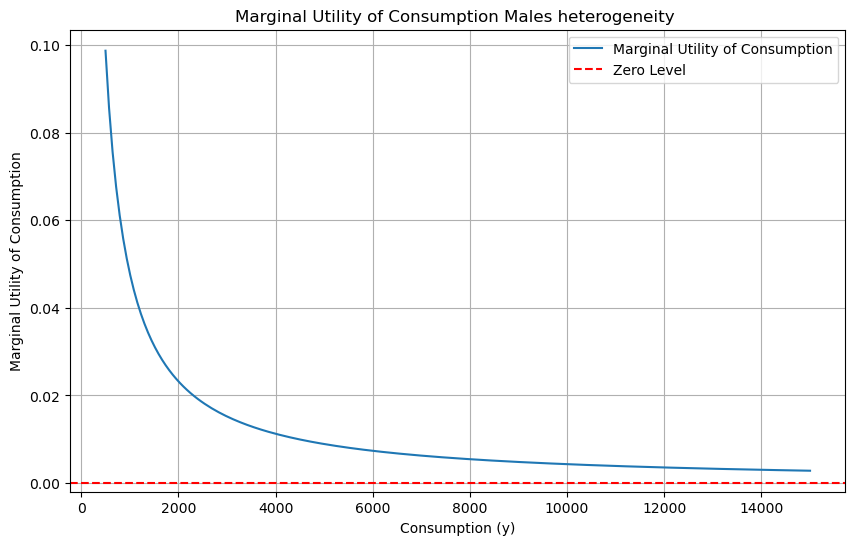

In [307]:
# Estimated parameters and plotting 
alpha = 63.579052 
beta = 114.277587 
gamma_yy = -1.039758
gamma_ll = -8.264997
gamma_yl = -0.339547

# Define a range of consumption (y) values
y_values = np.linspace(500, 15000, 200)  # Avoid zero to prevent division by zero

# Calculate the marginal utility for each y value using the mean log leisure (logl)
marginal_utility_values = marginal_utility_y(y_values, alpha, gamma_yy, gamma_yl, df_filtered['logl'].mean())

# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(y_values, marginal_utility_values, label='Marginal Utility of Consumption')
plt.axhline(y=0, color='r', linestyle='--', label='Zero Level')
plt.xlabel('Consumption (y)')
plt.ylabel('Marginal Utility of Consumption')
plt.title('Marginal Utility of Consumption Males heterogeneity ')
plt.legend()
plt.grid(True)
plt.show()



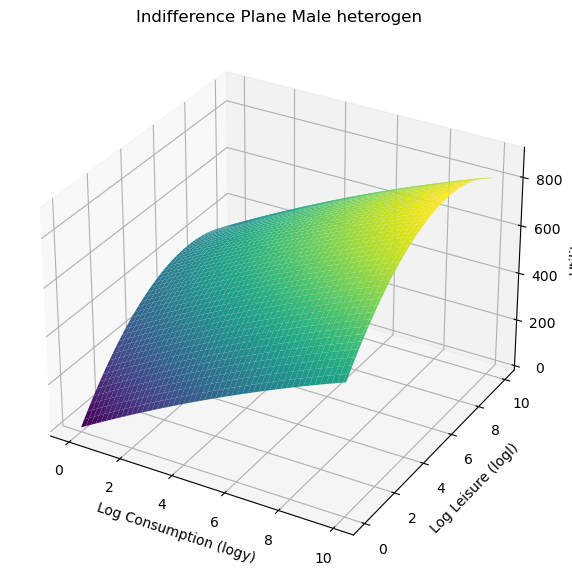

In [308]:
# Define the utility function with the estimated parameters
def utility(logy, logl, alpha, beta, gamma_yy, gamma_ll, gamma_yl):
    logy2 = logy ** 2
    logl2 = logl ** 2
    logyl = logy * logl
    return alpha * logy + beta * logl + gamma_yy * logy2 + gamma_ll * logl2 + gamma_yl * logyl

# Estimated parameters and plotting 
alpha = 63.579052 
beta = 114.277587 
gamma_yy = -1.039758
gamma_ll = -8.264997
gamma_yl = -0.339547
# Generate a range of values for log consumption (logy) and log leisure (logl)
logy_values = np.linspace(0, 10, 100)
logl_values = np.linspace(0, 10, 100)

# Create a grid of values
logy_grid, logl_grid = np.meshgrid(logy_values, logl_values)
# Calculate utility for each combination of logy and logl
utility_values = utility(logy_grid, logl_grid, alpha, beta, gamma_yy, gamma_ll, gamma_yl)
# Create a 3D plot
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Plot the surface
ax.plot_surface(logy_grid, logl_grid, utility_values, cmap='viridis')

# Set labels
ax.set_xlabel('Log Consumption (logy)')
ax.set_ylabel('Log Leisure (logl)')
ax.set_zlabel('Utility')

# Set title
ax.set_title('Indifference Plane Male heterogen')

# Show the plot
plt.show()

In [230]:
#Parmas MALES
# Define the coefficients as obtained from your model
alpha = 63.579052 
beta = 114.277587 
gamma_yy = -1.039758
gamma_ll = -8.264997
gamma_yl = -0.339547

# Define the heterogeneity parameters
alpha_dag = 0.028631
alpha_dncsy =  -6.346934 
alpha_deh = [ 0.155536, 0.111721, -0.066694, 5.741866 ,0.709639 ]
alpha_dms = [-0.551540, -1.128555, 1.623744 ]
alpha_dcz = [-2.863414, -0.649470]
alpha_lindi = [-47.497971, -45.500534, -45.798892 , -46.149616 , -45.770449 , -47.055868 , -43.771737 , -47.055307, -47.901903 , -41.640453 , -45.216039 , -45.004490 ]
alpha_amrtn = [-1.835289, -1.733227, -1.874490, -1.148180 ]
beta_dag = -0.014228
beta_dncsy =  -5.831141
beta_deh = [ -2.122516 , -2.421945,  -2.234605, 1.559893, -2.345532]
beta_dms = [-0.118139 , -0.664408, 1.017204 ]
beta_dcz = [-2.135353 , -0.116512 ]
beta_lindi = [-50.425683, -45.946676, -47.508953, -47.678844, -47.654771, -49.094435 , -46.932884, -49.986293 , -50.551776, -44.417742, -47.538835, -46.052577 ]
beta_amrtn = [-0.467466 , -0.200284 , -0.958340,  0.961917 ]


In [231]:
# Define the utility computation function
def compute_utility(row):
    # Extract the required values from the row
    logy = row['logy']
    logl = row['logl']
    logy2 = row['logy2']
    logl2 = row['logl2']
    logyl = row['logyl']
    
    # Heterogeneity components
    deh_levels = [row[f'deh_{i+1}'] for i in range(len(alpha_deh))]
    dms_levels = [row[f'dms_{i+3}'] for i in range(len(alpha_dms))]
    dcz_levels = [row[f'dcz_{i+2}'] for i in range(len(alpha_dcz))]
    lindi_levels = [row[f'lindi_{i+1}'] for i in range(len(alpha_lindi))]
    amrtn_levels = [row[f'amrtn_{i}'] for i in [2, 3, 4, 6]]

    alpha_part = (alpha + alpha_dag * row['dag']  + alpha_dncsy * row['dncsy'] +
                  sum(alpha_deh[i] * deh_levels[i] for i in range(len(alpha_deh))) +
                  sum(alpha_dms[i] * dms_levels[i] for i in range(len(alpha_dms))) +
                  sum(alpha_dcz[i] * dcz_levels[i] for i in range(len(alpha_dcz))) +
                  sum(alpha_lindi[i] * lindi_levels[i] for i in range(len(alpha_lindi))) +
                  sum(alpha_amrtn[i] * amrtn_levels[i] for i in range(len(alpha_amrtn)))) * logy
    
    beta_part = (beta + beta_dag * row['dag']  + beta_dncsy * row['dncsy'] +
                 sum(beta_deh[i] * deh_levels[i] for i in range(len(beta_deh))) +
                 sum(beta_dms[i] * dms_levels[i] for i in range(len(beta_dms))) +
                 sum(beta_dcz[i] * dcz_levels[i] for i in range(len(beta_dcz))) +
                 sum(beta_lindi[i] * lindi_levels[i] for i in range(len(beta_lindi))) +
                 sum(beta_amrtn[i] * amrtn_levels[i] for i in range(len(beta_amrtn)))) * logl

    # Compute the utility
    utility = alpha_part + beta_part + gamma_yy * logy2 + gamma_ll * logl2 + gamma_yl * logyl
    return utility


In [233]:
# Make an explicit copy of the DataFrame to avoid SettingWithCopyWarning
long_male = long_male.copy()

# Compute utilities for each observation
long_male['utility'] = long_male.apply(compute_utility, axis=1)

# Determine the predicted choice by selecting the scenario with the highest utility for each person
long_male['utility_idx'] = long_male.groupby('idperson')['utility'].transform(lambda x: x.idxmax())

# Using .loc to correctly reference the DataFrame index
long_male['predicted_choice'] = long_male.loc[long_male['utility_idx'], 'scenario'].values

# Drop the utility_idx column
long_male.drop(columns=['utility_idx'], inplace=True)

# Display the resulting DataFrame
print(long_male)


          idhh   idperson   idmother   idfather  idpartner  idorighh  \
0       870600   87060001          0          0          0    870600   
11030   870600   87060001          0          0          0    870600   
16545   870600   87060001          0          0          0    870600   
5515    870600   87060001          0          0          0    870600   
11035   878900   87890001   87890003   87890002          0    878900   
5       878900   87890001   87890003   87890002          0    878900   
16550   878900   87890001   87890003   87890002          0    878900   
5520    878900   87890001   87890003   87890002          0    878900   
16551   879800   87980001          0          0          0    879800   
5521    879800   87980001          0          0          0    879800   
11036   879800   87980001          0          0          0    879800   
6       879800   87980001          0          0          0    879800   
7       880300   88030001          0          0          0    88

In [234]:
# Display the dataframe with utilities and predicted choices
long_male[['idperson', 'scenario', 'utility', 'predicted_choice', 'leisure','hyds','original_scenario']].head()


,idperson,scenario,utility,predicted_choice,leisure,hyds,original_scenario
0,87060001,h0,188.368210,h2,80,840.40,h2
11030,87060001,h2,192.947850,h2,36,2543.86,h2
16545,87060001,h3,190.420649,h2,23,3161.47,h2
5515,87060001,h1,190.456367,h2,66,1028.34,h2
11035,87890001,h2,199.206114,h2,45,2891.63,h3


In [235]:
# Add 'choice_made' column: 1 if the scenario is the same as the original_scenario, otherwise 0
long_male['choice_made'] = (long_male['scenario'] == long_male['original_scenario']).astype(int)

# Add 'predicted_choice_binary' column: 1 if the scenario is the same as the predicted_choice, otherwise 0
long_male['predicted_choice_binary'] = (long_male['scenario'] == long_male['predicted_choice']).astype(int)
# Filter the DataFrame to keep only the rows where 'scenario' matches 'original_scenario'
filtered_df = long_male[long_male['scenario'] == long_male['original_scenario']]
# Create a pivot table to count the occurrences of each combination of original and predicted choices
confusion_matrix = pd.crosstab(filtered_df['original_scenario'], filtered_df['predicted_choice'], rownames=['Original Choice'], colnames=['Predicted Choice'])

# Add the row and column totals
confusion_matrix['Total'] = confusion_matrix.sum(axis=1)
confusion_matrix.loc['Total'] = confusion_matrix.sum(axis=0)

# Display the confusion matrix with totals
print(confusion_matrix)

# If needed, save the confusion matrix to a CSV file
confusion_matrix.to_csv('confusion_matrix_with_totals.csv')

Predicted Choice  h0  h1    h2   h3  Total
Original Choice                           
h0                16   0     0    0     16
h1                 0   2   160    3    165
h2                 0   0  2079   38   2117
h3                 0   0   254   92    346
Total             16   2  2493  133   2644


In [236]:
# Create Biogeme database for females
database_female = db.Database('labour_supply_female', df_female)

## Defining name of the variables as python variables       

globals().update(database.variables)

In [237]:
# Define variables for each scenario
logy_h0 = Variable('logy_h0')
logl_h0 = Variable('logl_h0')
logy2_h0 = Variable('logy2_h0')
logl2_h0 = Variable('logl2_h0')
logyl_h0 = Variable('logyl_h0')

logy_h1 = Variable('logy_h1')
logl_h1 = Variable('logl_h1')
logy2_h1 = Variable('logy2_h1')
logl2_h1 = Variable('logl2_h1')
logyl_h1 = Variable('logyl_h1')

logy_h2 = Variable('logy_h2')
logl_h2 = Variable('logl_h2')
logy2_h2 = Variable('logy2_h2')
logl2_h2 = Variable('logl2_h2')
logyl_h2 = Variable('logyl_h2')

logy_h3 = Variable('logy_h3')
logl_h3 = Variable('logl_h3')
logy2_h3 = Variable('logy2_h3')
logl2_h3 = Variable('logl2_h3')
logyl_h3 = Variable('logyl_h3')

choice = Variable('original_scenario')

# Define heterogeneity variables
dag = Variable('dag')
dncsy = Variable('dncsy')
drgur = Variable('drgur')

# Create dummy variables for education levels and other categorical variables
# Create dummy variables for education levels and other categorical variables
deh_levels = [col for col in wide_df.columns if 'deh_' in col]
dms_levels = [col for col in wide_df.columns if 'dms_' in col]
dcz_levels = [col for col in wide_df.columns if 'dcz_' in col]
lindi_levels = [col for col in wide_df.columns if 'lindi_' in col]
amrtn_levels = [col for col in wide_df.columns if 'amrtn_' in col]

# Define parameters to be estimated
alpha = Beta('alpha', 0, None, None, 0)
beta = Beta('beta', 0, None, None, 0)
gamma_yy = Beta('gamma_yy', 0, None, None, 0)
gamma_ll = Beta('gamma_ll', 0, None, None, 0)
gamma_yl = Beta('gamma_yl', 0, None, None, 0)

# Define heterogeneity parameters for age and gender
alpha_dag = Beta('alpha_dag', 0, None, None, 0)
alpha_dncsy = Beta('alpha_dncsy', 0, None, None, 0)

beta_dag = Beta('beta_dag', 0, None, None, 0)
beta_dncsy = Beta('beta_dncsy', 0, None, None, 0)

# Define heterogeneity parameters for education levels and other categorical variables
alpha_deh = {level: Beta(f'alpha_{level}', 0, None, None, 0) for level in deh_levels}
beta_deh = {level: Beta(f'beta_{level}', 0, None, None, 0) for level in deh_levels}

alpha_dms = {level: Beta(f'alpha_{level}', 0, None, None, 0) for level in dms_levels}
beta_dms = {level: Beta(f'beta_{level}', 0, None, None, 0) for level in dms_levels}

alpha_dcz = {level: Beta(f'alpha_{level}', 0, None, None, 0) for level in dcz_levels}
beta_dcz = {level: Beta(f'beta_{level}', 0, None, None, 0) for level in dcz_levels}

alpha_lindi = {level: Beta(f'alpha_{level}', 0, None, None, 0) for level in lindi_levels}
beta_lindi = {level: Beta(f'beta_{level}', 0, None, None, 0) for level in lindi_levels}

alpha_amrtn = {level: Beta(f'alpha_{level}', 0, None, None, 0) for level in amrtn_levels}
beta_amrtn = {level: Beta(f'beta_{level}', 0, None, None, 0) for level in amrtn_levels}


In [239]:
# Define the utility functions with heterogeneity
V = {
    0: (alpha + alpha_dag * dag  + alpha_dncsy * dncsy +
        sum(alpha_deh[level] * Variable(level) for level in deh_levels) +
        sum(alpha_dms[level] * Variable(level) for level in dms_levels) +
        sum(alpha_dcz[level] * Variable(level) for level in dcz_levels) +
        sum(alpha_lindi[level] * Variable(level) for level in lindi_levels) +
        sum(alpha_amrtn[level] * Variable(level) for level in amrtn_levels)) * logy_h0 + 
       (beta + beta_dag * dag + beta_dncsy * dncsy +
        sum(beta_deh[level] * Variable(level) for level in deh_levels) +
        sum(beta_dms[level] * Variable(level) for level in dms_levels) +
        sum(beta_dcz[level] * Variable(level) for level in dcz_levels) +
        sum(beta_lindi[level] * Variable(level) for level in lindi_levels) +
        sum(beta_amrtn[level] * Variable(level) for level in amrtn_levels)) * logl_h0 + 
       gamma_yy * logy2_h0 + gamma_ll * logl2_h0 + gamma_yl * logyl_h0,
    1: (alpha + alpha_dag * dag  + alpha_dncsy * dncsy +
        sum(alpha_deh[level] * Variable(level) for level in deh_levels) +
        sum(alpha_dms[level] * Variable(level) for level in dms_levels) +
        sum(alpha_dcz[level] * Variable(level) for level in dcz_levels) +
        sum(alpha_lindi[level] * Variable(level) for level in lindi_levels) +
        sum(alpha_amrtn[level] * Variable(level) for level in amrtn_levels)) * logy_h1 + 
       (beta + beta_dag * dag  + beta_dncsy * dncsy +
        sum(beta_deh[level] * Variable(level) for level in deh_levels) +
        sum(beta_dms[level] * Variable(level) for level in dms_levels) +
        sum(beta_dcz[level] * Variable(level) for level in dcz_levels) +
        sum(beta_lindi[level] * Variable(level) for level in lindi_levels) +
        sum(beta_amrtn[level] * Variable(level) for level in amrtn_levels)) * logl_h1 +  
       gamma_yy * logy2_h1 + gamma_ll * logl2_h1 + gamma_yl * logyl_h1,
    2: (alpha + alpha_dag * dag + alpha_dncsy * dncsy +
        sum(alpha_deh[level] * Variable(level) for level in deh_levels) +
        sum(alpha_dms[level] * Variable(level) for level in dms_levels) +
        sum(alpha_dcz[level] * Variable(level) for level in dcz_levels) +
        sum(alpha_lindi[level] * Variable(level) for level in lindi_levels) +
        sum(alpha_amrtn[level] * Variable(level) for level in amrtn_levels)) * logy_h2 + 
       (beta + beta_dag * dag  + beta_dncsy * dncsy +
        sum(beta_deh[level] * Variable(level) for level in deh_levels) +
        sum(beta_dms[level] * Variable(level) for level in dms_levels) +
        sum(beta_dcz[level] * Variable(level) for level in dcz_levels) +
        sum(beta_lindi[level] * Variable(level) for level in lindi_levels) +
        sum(beta_amrtn[level] * Variable(level) for level in amrtn_levels)) * logl_h2 + 
       gamma_yy * logy2_h2 + gamma_ll * logl2_h2 + gamma_yl * logyl_h2,
    3: (alpha + alpha_dag * dag + alpha_dncsy * dncsy +
        sum(alpha_deh[level] * Variable(level) for level in deh_levels) +
        sum(alpha_dms[level] * Variable(level) for level in dms_levels) +
        sum(alpha_dcz[level] * Variable(level) for level in dcz_levels) +
        sum(alpha_lindi[level] * Variable(level) for level in lindi_levels) +
        sum(alpha_amrtn[level] * Variable(level) for level in amrtn_levels)) * logy_h3 + 
       (beta + beta_dag * dag + beta_dncsy * dncsy +
        sum(beta_deh[level] * Variable(level) for level in deh_levels) +
        sum(beta_dms[level] * Variable(level) for level in dms_levels) +
        sum(beta_dcz[level] * Variable(level) for level in dcz_levels) +
        sum(beta_lindi[level] * Variable(level) for level in lindi_levels) +
        sum(beta_amrtn[level] * Variable(level) for level in amrtn_levels)) * logl_h3 + 
       gamma_yy * logy2_h3 + gamma_ll * logl2_h3+ gamma_yl * logyl_h3,
}




In [240]:
# Define the availability of each choice (all choices are available)
av = {0: 1, 1: 1, 2: 1, 3: 1}

# Associate the utility functions with the choice situations
logprob = models.loglogit(V, av, choice)

# Create the Biogeme object
biogeme_model = bio.BIOGEME(database_female, logprob)
biogeme_model.modelName = 'householdLS_female_max'
# Set the choice variable
biogeme_model.choice = choice

# Estimate the parameters
results = biogeme_model.estimate()

# Print the estimated parameters
print(results.getEstimatedParameters())

It seems that the optimization algorithm did not converge. Therefore, the results may not correspond to the maximum likelihood estimator. Check the specification of the model, or the criteria for convergence of the algorithm.


                     Value  Rob. Std err  Rob. t-test  Rob. p-value
alpha            69.795270      2.874334    24.282237  0.000000e+00
alpha_amrtn_2    -0.614789      0.253293    -2.427184  1.521653e-02
alpha_amrtn_3    -0.371434      0.288499    -1.287471  1.979300e-01
alpha_amrtn_4    -2.434862      0.594020    -4.098954  4.150209e-05
alpha_amrtn_6    -2.193781      0.347457    -6.313825  2.722225e-10
alpha_dag         0.020128      0.011034     1.824144  6.813026e-02
alpha_dcz_2      -0.864767      0.721448    -1.198655  2.306621e-01
alpha_dcz_3      -1.659526      0.359168    -4.620476  3.828605e-06
alpha_deh_1       3.320281      1.198988     2.769238  5.618765e-03
alpha_deh_2       2.607379      1.150805     2.265701  2.346972e-02
alpha_deh_3       3.849315      1.151992     3.341444  8.334394e-04
alpha_deh_4       3.508587      1.603122     2.188596  2.862621e-02
alpha_deh_5       4.076427      1.136081     3.588148  3.330350e-04
alpha_dms_3       0.304622      0.449299     0.6

In [241]:
# Retrieve the estimated parameters
parameters = results.getEstimatedParameters()

# Option 1: Set display options to show all rows in Jupyter or interactive environments
pd.set_option('display.max_rows', None)
print(parameters)

                     Value  Rob. Std err  Rob. t-test  Rob. p-value
alpha            69.795270      2.874334    24.282237  0.000000e+00
alpha_amrtn_2    -0.614789      0.253293    -2.427184  1.521653e-02
alpha_amrtn_3    -0.371434      0.288499    -1.287471  1.979300e-01
alpha_amrtn_4    -2.434862      0.594020    -4.098954  4.150209e-05
alpha_amrtn_6    -2.193781      0.347457    -6.313825  2.722225e-10
alpha_dag         0.020128      0.011034     1.824144  6.813026e-02
alpha_dcz_2      -0.864767      0.721448    -1.198655  2.306621e-01
alpha_dcz_3      -1.659526      0.359168    -4.620476  3.828605e-06
alpha_deh_1       3.320281      1.198988     2.769238  5.618765e-03
alpha_deh_2       2.607379      1.150805     2.265701  2.346972e-02
alpha_deh_3       3.849315      1.151992     3.341444  8.334394e-04
alpha_deh_4       3.508587      1.603122     2.188596  2.862621e-02
alpha_deh_5       4.076427      1.136081     3.588148  3.330350e-04
alpha_dms_3       0.304622      0.449299     0.6

In [242]:
#print Output
print(results)


Results for model householdLS_female_max
Output file (HTML):			householdLS_female_max.html
Nbr of parameters:		61
Sample size:			11176
Excluded data:			0
Init log likelihood:		-15493.23
Final log likelihood:		-6399.152
Likelihood ratio test (init):		18188.15
Rho square (init):			0.587
Rho bar square (init):			0.583
Akaike Information Criterion:	12920.3
Bayesian Information Criterion:	13366.92
Final gradient norm:		0.6102434
alpha          : 69.8[13.8 5.04 4.63e-07][2.87 24.3 0]
alpha_amrtn_2  : -0.615[0.254 -2.42 0.0156][0.253 -2.43 0.0152]
alpha_amrtn_3  : -0.371[0.285 -1.31 0.192][0.288 -1.29 0.198]
alpha_amrtn_4  : -2.43[0.519 -4.69 2.76e-06][0.594 -4.1 4.15e-05]
alpha_amrtn_6  : -2.19[0.334 -6.56 5.27e-11][0.347 -6.31 2.72e-10]
alpha_dag      : 0.0201[0.0107 1.88 0.0599][0.011 1.82 0.0681]
alpha_dcz_2    : -0.865[0.478 -1.81 0.0705][0.721 -1.2 0.231]
alpha_dcz_3    : -1.66[0.373 -4.44 8.84e-06][0.359 -4.62 3.83e-06]
alpha_deh_1    : 3.32[0.821 4.04 5.29e-05][1.2 2.77 0.00562]
alph

In [243]:
#Mean values females 
mean_logl = long_female['logl'].mean()
mean_logy = long_female['logy'].mean()

print(f'Mean log leisure females: {mean_logl}')
print(f'Mean log of consumption females : {mean_logy}')

Mean log leisure females: 3.886091975627356
Mean log of consumption females : 7.417923808470349


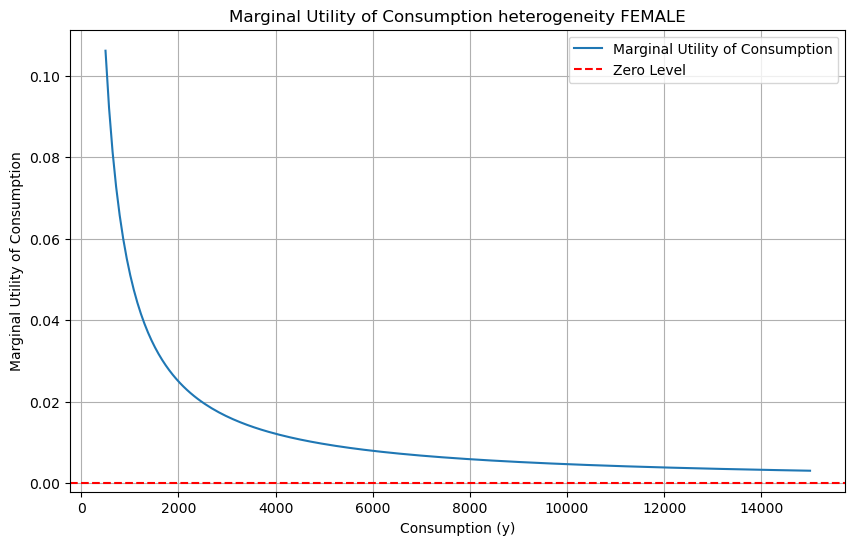

In [244]:
# Estimated parameters and plotting 
alpha =  69.795270  
beta = 124.487340 
gamma_yy = -1.118354 
gamma_ll = -8.595155 
gamma_yl = -0.721319 

# Define a range of consumption (y) values
y_values = np.linspace(500, 15000, 200)  # Avoid zero to prevent division by zero

# Calculate the marginal utility for each y value using the mean log leisure (logl)
marginal_utility_values = marginal_utility_y(y_values, alpha, gamma_yy, gamma_yl, df_filtered['logl'].mean())

# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(y_values, marginal_utility_values, label='Marginal Utility of Consumption')
plt.axhline(y=0, color='r', linestyle='--', label='Zero Level')
plt.xlabel('Consumption (y)')
plt.ylabel('Marginal Utility of Consumption')
plt.title('Marginal Utility of Consumption heterogeneity FEMALE')
plt.legend()
plt.grid(True)
plt.show()



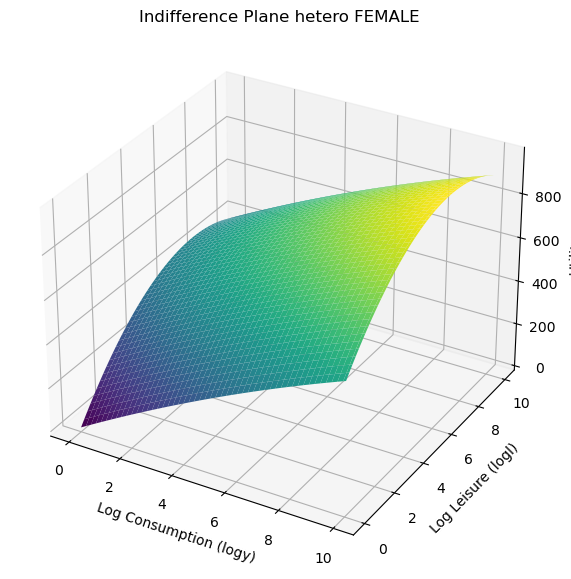

In [245]:
# Define the utility function with the estimated parameters
def utility(logy, logl, alpha, beta, gamma_yy, gamma_ll, gamma_yl):
    logy2 = logy ** 2
    logl2 = logl ** 2
    logyl = logy * logl
    return alpha * logy + beta * logl + gamma_yy * logy2 + gamma_ll * logl2 + gamma_yl * logyl

# Estimated parameters and plotting 
alpha =  69.795270  
beta = 124.487340 
gamma_yy = -1.118354 
gamma_ll = -8.595155 
gamma_yl = -0.721319 
# Generate a range of values for log consumption (logy) and log leisure (logl)
logy_values = np.linspace(0, 10, 100)
logl_values = np.linspace(0, 10, 100)

# Create a grid of values
logy_grid, logl_grid = np.meshgrid(logy_values, logl_values)
# Calculate utility for each combination of logy and logl
utility_values = utility(logy_grid, logl_grid, alpha, beta, gamma_yy, gamma_ll, gamma_yl)
# Create a 3D plot
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Plot the surface
ax.plot_surface(logy_grid, logl_grid, utility_values, cmap='viridis')

# Set labels
ax.set_xlabel('Log Consumption (logy)')
ax.set_ylabel('Log Leisure (logl)')
ax.set_zlabel('Utility')

# Set title
ax.set_title('Indifference Plane hetero FEMALE')

# Show the plot
plt.show()

In [246]:
#Parmas FEMALES
# Define the coefficients as obtained from your model
alpha =  69.795270  
beta = 124.487340 
gamma_yy = -1.118354 
gamma_ll = -8.595155 
gamma_yl = -0.721319 

# Define the heterogeneity parameters
alpha_dag = 0.020128 
alpha_dncsy =  -3.101314 
alpha_deh = [ 3.320281, 2.607379 ,  3.849315 , 3.508587  ,4.076427 ]
alpha_dms = [0.304622, 0.011133 , 0.573558 ]
alpha_dcz = [-0.864767, -1.659526]
alpha_lindi = [-56.448887, -53.464051, -53.000845  , -56.064385, -52.810445  , -51.533651  , -53.495792 , -55.382189 , -55.310350 , -53.096388  , -54.214709  , -52.505353 ]
alpha_amrtn = [-1.835289, -1.733227, -1.874490, -1.148180 ]
beta_dag = -0.008152
beta_dncsy =  -2.895276
beta_deh = [ 3.383156, 2.048861 ,  3.049021, 3.043746 ,  2.043053  ]
beta_dms = [ 0.354874 , -0.241110 , 0.329171]
beta_dcz = [-1.542545  ,-0.589706  ]
beta_lindi = [-59.731123, -56.231513, -56.641128 , -57.558762 , -56.399013 , -55.130310, -57.216823, -58.597650  ,-57.336884 , -55.159554 , -57.118381,-55.901069 ]
beta_amrtn = [0.346868 ,  0.166275 , -0.969057,  -1.067381 ]


In [247]:
# Define the utility computation function
def compute_utility(row):
    # Extract the required values from the row
    logy = row['logy']
    logl = row['logl']
    logy2 = row['logy2']
    logl2 = row['logl2']
    logyl = row['logyl']
    
    # Heterogeneity components
    deh_levels = [row[f'deh_{i+1}'] for i in range(len(alpha_deh))]
    dms_levels = [row[f'dms_{i+3}'] for i in range(len(alpha_dms))]
    dcz_levels = [row[f'dcz_{i+2}'] for i in range(len(alpha_dcz))]
    lindi_levels = [row[f'lindi_{i+1}'] for i in range(len(alpha_lindi))]
    amrtn_levels = [row[f'amrtn_{i}'] for i in [2, 3, 4, 6]]

    alpha_part = (alpha + alpha_dag * row['dag']  + alpha_dncsy * row['dncsy'] +
                  sum(alpha_deh[i] * deh_levels[i] for i in range(len(alpha_deh))) +
                  sum(alpha_dms[i] * dms_levels[i] for i in range(len(alpha_dms))) +
                  sum(alpha_dcz[i] * dcz_levels[i] for i in range(len(alpha_dcz))) +
                  sum(alpha_lindi[i] * lindi_levels[i] for i in range(len(alpha_lindi))) +
                  sum(alpha_amrtn[i] * amrtn_levels[i] for i in range(len(alpha_amrtn)))) * logy
    
    beta_part = (beta + beta_dag * row['dag']  + beta_dncsy * row['dncsy'] +
                 sum(beta_deh[i] * deh_levels[i] for i in range(len(beta_deh))) +
                 sum(beta_dms[i] * dms_levels[i] for i in range(len(beta_dms))) +
                 sum(beta_dcz[i] * dcz_levels[i] for i in range(len(beta_dcz))) +
                 sum(beta_lindi[i] * lindi_levels[i] for i in range(len(beta_lindi))) +
                 sum(beta_amrtn[i] * amrtn_levels[i] for i in range(len(beta_amrtn)))) * logl

    # Compute the utility
    utility = alpha_part + beta_part + gamma_yy * logy2 + gamma_ll * logl2 + gamma_yl * logyl
    return utility


In [248]:
# Make an explicit copy of the DataFrame to avoid SettingWithCopyWarning
long_female = long_female.copy()

# Compute utilities for each observation
long_female['utility'] = long_female.apply(compute_utility, axis=1)

# Determine the predicted choice by selecting the scenario with the highest utility for each person
long_female['utility_idx'] = long_female.groupby('idperson')['utility'].transform(lambda x: x.idxmax())

# Using .loc to correctly reference the DataFrame index
long_female['predicted_choice'] = long_female.loc[long_female['utility_idx'], 'scenario'].values

# Drop the utility_idx column
long_female.drop(columns=['utility_idx'], inplace=True)

# Display the resulting DataFrame
print(long_female)


          idhh   idperson   idmother   idfather  idpartner  idorighh  \
1       870700   87070001          0          0          0    870700   
11031   870700   87070001          0          0          0    870700   
5516    870700   87070001          0          0          0    870700   
16546   870700   87070001          0          0          0    870700   
5517    870900   87090001          0          0          0    870900   
16547   870900   87090001          0          0          0    870900   
11032   870900   87090001          0          0          0    870900   
2       870900   87090001          0          0          0    870900   
16548   873800   87380001   87380003   87380002          0    873800   
11033   873800   87380001   87380003   87380002          0    873800   
3       873800   87380001   87380003   87380002          0    873800   
5518    873800   87380001   87380003   87380002          0    873800   
11034   877000   87700002          0          0          0    87

In [250]:
# Display the dataframe with utilities and predicted choices
long_female[['idperson', 'scenario', 'utility', 'predicted_choice', 'leisure','hyds','original_scenario']].head()


,idperson,scenario,utility,predicted_choice,leisure,hyds,original_scenario
1,87070001,h0,837.518981,h0,80,1510.55,h0
11031,87070001,h2,813.378929,h0,49,1510.55,h0
5516,87070001,h1,831.322543,h0,70,1510.55,h0
16546,87070001,h3,768.978226,h0,23,1510.55,h0
5517,87090001,h1,204.848119,h2,69,1296.05,h2


In [251]:
# Add 'choice_made' column: 1 if the scenario is the same as the original_scenario, otherwise 0
long_female['choice_made'] = (long_female['scenario'] == long_female['original_scenario']).astype(int)

# Add 'predicted_choice_binary' column: 1 if the scenario is the same as the predicted_choice, otherwise 0
long_female['predicted_choice_binary'] = (long_female['scenario'] == long_female['predicted_choice']).astype(int)
# Filter the DataFrame to keep only the rows where 'scenario' matches 'original_scenario'
filtered_df = long_female[long_female['scenario'] == long_female['original_scenario']]
# Create a pivot table to count the occurrences of each combination of original and predicted choices
confusion_matrix = pd.crosstab(filtered_df['original_scenario'], filtered_df['predicted_choice'], rownames=['Original Choice'], colnames=['Predicted Choice'])

# Add the row and column totals
confusion_matrix['Total'] = confusion_matrix.sum(axis=1)
confusion_matrix.loc['Total'] = confusion_matrix.sum(axis=0)

# Display the confusion matrix with totals
print(confusion_matrix)

# If needed, save the confusion matrix to a CSV file
confusion_matrix.to_csv('confusion_matrix_with_totals.csv')

Predicted Choice  h0  h1    h2  h3  Total
Original Choice                          
h0                44   0     1   0     45
h1                 4   6   385   1    396
h2                 4  16  2115   0   2135
h3                 1   2   202  13    218
Total             53  24  2703  14   2794


In [164]:
# Define the utility functions with heterogeneity
V = {
    0: (alpha + alpha_dag * dag + alpha_dgn * dgn + alpha_dncsy * dncsy +
        sum(alpha_deh[level] * Variable(level) for level in deh_levels) +
        sum(alpha_dcz[level] * Variable(level) for level in dcz_levels) +
        sum(alpha_lindi[level] * Variable(level) for level in lindi_levels) +
        sum(alpha_amrtn[level] * Variable(level) for level in amrtn_levels)) * logy_h0 + 
       (beta + beta_dag * dag + beta_dgn * dgn + beta_dncsy * dncsy +
        sum(beta_deh[level] * Variable(level) for level in deh_levels) +        
        sum(beta_dcz[level] * Variable(level) for level in dcz_levels) +
        sum(beta_lindi[level] * Variable(level) for level in lindi_levels) +
        sum(beta_amrtn[level] * Variable(level) for level in amrtn_levels)) * logl_h0 + 
       gamma_yy * logy2_h0 + gamma_ll * logl2_h0 + gamma_yl * logyl_h0,
    1: (alpha + alpha_dag * dag + alpha_dgn * dgn + alpha_dncsy * dncsy +
        sum(alpha_deh[level] * Variable(level) for level in deh_levels) +
        sum(alpha_dcz[level] * Variable(level) for level in dcz_levels) +
        sum(alpha_lindi[level] * Variable(level) for level in lindi_levels) +
        sum(alpha_amrtn[level] * Variable(level) for level in amrtn_levels)) * logy_h1 + 
       (beta + beta_dag * dag + beta_dgn * dgn + beta_dncsy * dncsy +
        sum(beta_deh[level] * Variable(level) for level in deh_levels) +        
        sum(beta_dcz[level] * Variable(level) for level in dcz_levels) +
        sum(beta_lindi[level] * Variable(level) for level in lindi_levels) +
        sum(beta_amrtn[level] * Variable(level) for level in amrtn_levels)) * logl_h1 + 
       gamma_yy * logy2_h1 + gamma_ll * logl2_h1 + gamma_yl * logyl_h1,
    2: (alpha + alpha_dag * dag + alpha_dgn * dgn + alpha_dncsy * dncsy +
        sum(alpha_deh[level] * Variable(level) for level in deh_levels) +
        sum(alpha_dcz[level] * Variable(level) for level in dcz_levels) +
        sum(alpha_lindi[level] * Variable(level) for level in lindi_levels) +
        sum(alpha_amrtn[level] * Variable(level) for level in amrtn_levels)) * logy_h2 + 
       (beta + beta_dag * dag + beta_dgn * dgn + beta_dncsy * dncsy +
        sum(beta_deh[level] * Variable(level) for level in deh_levels) +        
        sum(beta_dcz[level] * Variable(level) for level in dcz_levels) +
        sum(beta_lindi[level] * Variable(level) for level in lindi_levels) +
        sum(beta_amrtn[level] * Variable(level) for level in amrtn_levels)) * logl_h2 +  
       gamma_yy * logy2_h2 + gamma_ll * logl2_h2 + gamma_yl * logyl_h2,
    3: (alpha + alpha_dag * dag + alpha_dgn * dgn + alpha_dncsy * dncsy +
        sum(alpha_deh[level] * Variable(level) for level in deh_levels) +
        sum(alpha_dcz[level] * Variable(level) for level in dcz_levels) +
        sum(alpha_lindi[level] * Variable(level) for level in lindi_levels) +
        sum(alpha_amrtn[level] * Variable(level) for level in amrtn_levels)) * logy_h3 + 
       (beta + beta_dag * dag + beta_dgn * dgn + beta_dncsy * dncsy +
        sum(beta_deh[level] * Variable(level) for level in deh_levels) +        
        sum(beta_dcz[level] * Variable(level) for level in dcz_levels) +
        sum(beta_lindi[level] * Variable(level) for level in lindi_levels) +
        sum(beta_amrtn[level] * Variable(level) for level in amrtn_levels)) * logl_h3 +  
       gamma_yy * logy2_h3 + gamma_ll * logl2_h3+ gamma_yl * logyl_h3,
}




## Quadratic 

  #### General 

In [ ]:
# Create a Biogeme database
database = db.Database('labour_supply', wide_df)

# Verify the database structure
print(database.data.dtypes)


In [ ]:
## Defining name of the variables as python variables       
# Define variables for each scenario
y_h0 = Variable('hyds_h0')
l_h0 = Variable('leis_h0')

y_h1 = Variable('hyds_h1')
l_h1 = Variable('leis_h1')

y_h2 = Variable('hyds_h2')
l_h2 = Variable('leis_h2')

y_h3 = Variable('hyds_h3')
l_h3 = Variable('leis_h3')

choice = Variable('original_scenario')


In [ ]:
# Define parameters to be estimated
alpha = Beta('alpha', 0, None, None, 0)
beta = Beta('beta', 0, None, None, 0)
gamma_yy = Beta('gamma_yy', 0, None, None, 0)
gamma_ll = Beta('gamma_ll', 0, None, None, 0)
gamma_yl = Beta('gamma_yl', 0, None, None, 0)

# Define the utility functions
V = {
    0: alpha * y_h0 + beta * l_h0 + gamma_yy * (y_h0 ** 2) + gamma_ll * (l_h0 ** 2) + gamma_yl * y_h0 * l_h0,
    1: alpha * y_h1 + beta * l_h1 + gamma_yy * (y_h1 ** 2) + gamma_ll * (l_h1 ** 2) + gamma_yl * y_h1 * l_h1,
    2: alpha * y_h2 + beta * l_h2 + gamma_yy * (y_h2 ** 2) + gamma_ll * (l_h2 ** 2) + gamma_yl * y_h2 * l_h2,
    3: alpha * y_h3 + beta * l_h3 + gamma_yy * (y_h3 ** 2) + gamma_ll * (l_h3 ** 2) + gamma_yl * y_h3 * l_h3
}

# Define the availability of each choice (all choices are available)
av = {0: 1, 1: 1, 2: 1, 3: 1}

# Associate the utility functions with the choice situations
logprob = models.loglogit(V, av, choice)

# Create the Biogeme object
biogeme_model = bio.BIOGEME(database, logprob)
biogeme_model.modelName = 'quadratic_utility'

# Set the choice variable
biogeme_model.choice = choice

# Estimate the parameters
results = biogeme_model.estimate()

# Print the estimated parameters
print(results.getEstimatedParameters())

In [316]:
# Mean values males
mean_l = df_filtered['leis'].mean()
mean_y = df_filtered['hyds'].mean()

print(f'Mean log leisur : {mean_l}')
print(f'Mean log of consumption : {mean_y}')

Mean log leisur : 53.20618793674145
Mean log of consumption : 2253.350605461567


In [317]:
# Given results
res = [-7.414045e-04, 1.879358e-01, 2.843590e-08, -2.640263e-03, 1.803917e-05]
# Automated calculation of points where marginal utilities become zero
mu_y_zero = - (res[0] + res[4] * mean_l) / (2 * res[2])
mu_l_zero = - (res[1] + res[4] * mean_y) / (2 * res[3])

print(f"Income level at which MU of income becomes zero: {mu_y_zero}")
print(f"Leisure level at which MU of leisure becomes zero: {mu_l_zero}")


Income level at which MU of income becomes zero: -3840.05727342599
Leisure level at which MU of leisure becomes zero: 43.28818277601969


In [318]:
# Define the utility function with the estimated parameters
def utility(y, l, alpha, beta, gamma_yy, gamma_ll, gamma_yl):
    return alpha * y + beta * l + gamma_yy * y**2 + gamma_ll * l**2 + gamma_yl * y * l

# Define the marginal utility function
def marginal_qutility_y(y, alpha, gamma_yy, gamma_yl, l):
    return (alpha + 2 * gamma_yy * y + gamma_yl * l)


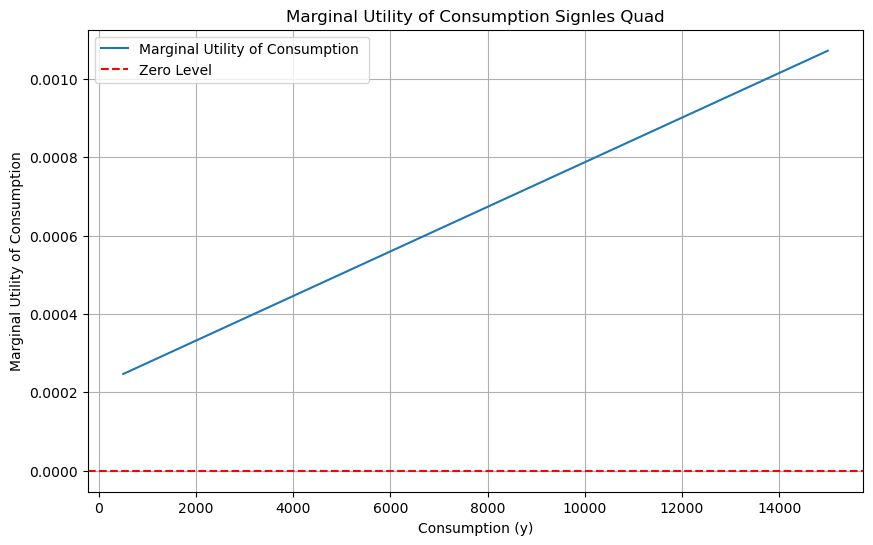

In [319]:
# Estimated parameters and plotting 
alpha = -7.414045e-04
beta = 1.879358e-01
gamma_yy  = 2.843590e-08
gamma_ll = -2.640263e-03
gamma_yl = 1.803917e-05

# Define a range of consumption (y) values
y_values = np.linspace(500, 15000, 200)  # Avoid zero to prevent division by zero

# Calculate the marginal utility for each y value using the mean log leisure (logl)
marginal_utility_values = marginal_qutility_y(y_values, alpha, gamma_yy, gamma_yl, mean_l)

# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(y_values, marginal_utility_values, label='Marginal Utility of Consumption ')
plt.axhline(y=0, color='r', linestyle='--', label='Zero Level')
plt.xlabel('Consumption (y)')
plt.ylabel('Marginal Utility of Consumption')
plt.title('Marginal Utility of Consumption Signles Quad')
plt.legend()
plt.grid(True)
plt.show()


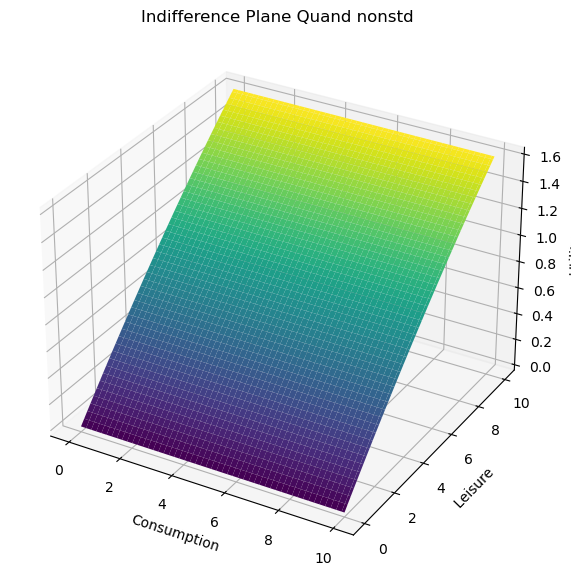

In [309]:
# Define the utility function with the estimated parameters
# Define the utility function with the estimated parameters
def utility(y, l, alpha, beta, gamma_yy, gamma_ll, gamma_yl):
    return alpha * y + beta * l + gamma_yy * y**2 + gamma_ll * l**2 + gamma_yl * y * l

# Estimated parameters and plotting 
alpha = -7.414045e-04
beta = 1.879358e-01
gamma_yy  = 2.843590e-08
gamma_ll = -2.640263e-03
gamma_yl = 1.803917e-05
# Generate a range of values for log consumption (logy) and log leisure (logl)
y_values = np.linspace(0, 10, 100)
l_values = np.linspace(0, 10, 100)

# Create a grid of values
y_grid, l_grid = np.meshgrid(y_values, l_values)
# Calculate utility for each combination of logy and logl
utility_values = utility(y_grid, l_grid, alpha, beta, gamma_yy, gamma_ll, gamma_yl)
# Create a 3D plot
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Plot the surface
ax.plot_surface(y_grid, l_grid, utility_values, cmap='viridis')

# Set labels
ax.set_xlabel('Consumption')
ax.set_ylabel(' Leisure ')
ax.set_zlabel('Utility')

# Set title
ax.set_title('Indifference Plane Quand nonstd ')

# Show the plot
plt.show()


In [ ]:
# Assuming wide_df is your original DataFrame
mean_logy = wide_df[['hyds_h0', 'hyds_h1', 'hyds_h2', 'hyds_h3']].mean().mean()
std_logy = wide_df[['hyds_h0', 'hyds_h1', 'hyds_h2', 'hyds_h3']].std().mean()

mean_logl = wide_df[['leis_h0', 'leis_h1', 'leis_h2', 'leis_h3']].mean().mean()
std_logl = wide_df[['leis_h0', 'leis_h1', 'leis_h2', 'leis_h3']].std().mean()

wide_df[['leis_h0', 'leis_h1', 'leis_h2', 'leis_h3']] = (wide_df[['leis_h0', 'leis_h1', 'leis_h2', 'leis_h3']] - mean_logy) / std_logy
wide_df[['leis_h0', 'leis_h1', 'leis_h2', 'leis_h3']] = (wide_df[['leis_h0', 'leis_h1', 'leis_h2', 'leis_h3']] - mean_logl) / std_logl


In [ ]:
# Assuming wide_df is your transformed DataFrame
database = db.Database('labour_supply', wide_df)

y_h0 = Variable('hyds_h0')
l_h0 = Variable('leis_h0')

y_h1 = Variable('hyds_h1')
l_h1 = Variable('leis_h1')

y_h2 = Variable('hyds_h2')
l_h2 = Variable('leis_h2')

y_h3 = Variable('hyds_h3')
l_h3 = Variable('leis_h3')

choice = Variable('original_scenario')


In [ ]:
# Define parameters to be estimated
alpha = Beta('alpha', 0, None, None, 0)
beta = Beta('beta', 0, None, None, 0)
gamma_yy = Beta('gamma_yy', 0, None, None, 0)
gamma_ll = Beta('gamma_ll', 0, None, None, 0)
gamma_yl = Beta('gamma_yl', 0, None, None, 0)

# Define the utility functions
V = {
    0: alpha * y_h0 + beta * l_h0 + gamma_yy * (y_h0 ** 2) + gamma_ll * (l_h0 ** 2) + gamma_yl * y_h0 * l_h0,
    1: alpha * y_h1 + beta * l_h1 + gamma_yy * (y_h1 ** 2) + gamma_ll * (l_h1 ** 2) + gamma_yl * y_h1 * l_h1,
    2: alpha * y_h2 + beta * l_h2 + gamma_yy * (y_h2 ** 2) + gamma_ll * (l_h2 ** 2) + gamma_yl * y_h2 * l_h2,
    3: alpha * y_h3 + beta * l_h3 + gamma_yy * (y_h3 ** 2) + gamma_ll * (l_h3 ** 2) + gamma_yl * y_h3 * l_h3
}

# Define the availability of each choice (all choices are available)
av = {0: 1, 1: 1, 2: 1, 3: 1}

# Associate the utility functions with the choice situations
logprob = models.loglogit(V, av, choice)

# Create the Biogeme object
biogeme_model = bio.BIOGEME(database, logprob)
biogeme_model.modelName = 'quadratic_utility_standardized'

# Set the choice variable
biogeme_model.choice = choice

# Estimate the parameters
results = biogeme_model.estimate()

# Print the estimated parameters
print(results.getEstimatedParameters())


In [ ]:
# Given results
res = [2.049648e+00, -1.302911e-01, 4.585910e-08, 5.467228e+00, 9.667794e-02]
# Automated calculation of points where marginal utilities become zero
mu_y_zero = - (res[0] + res[4] * mean_l) / (2 * res[2])
mu_l_zero = - (res[1] + res[4] * mean_y) / (2 * res[3])

print(f"Income level at which MU of income becomes zero: {mu_y_zero}")
print(f"Leisure level at which MU of leisure becomes zero: {mu_l_zero}")


In [ ]:
# Estimated parameters and plotting 
alpha = 2.049648e+00
beta = -1.302911e-01
gamma_yy  = 4.585910e-08
gamma_ll =  5.467228e+00
gamma_yl = 9.667794e-02

# Define a range of consumption (y) values
y_values = np.linspace(-100000, -1500000, 200)  

# Calculate the marginal utility for each y value using the mean log leisure (logl)
marginal_utility_values = marginal_qutility_y(y_values, alpha, gamma_yy, gamma_yl, mean_l)

# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(y_values, marginal_utility_values, label='Marginal Utility of Consumption ')
plt.axhline(y=0, color='r', linestyle='--', label='Zero Level')
plt.xlabel('Consumption (y)')
plt.ylabel('Marginal Utility of Consumption')
plt.title('Marginal Utility of Consumption Signles Quad')
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
# Define the utility function with the estimated parameters
# Define the utility function with the estimated parameters
def utility(y, l, alpha, beta, gamma_yy, gamma_ll, gamma_yl):
    return alpha * y + beta * l + gamma_yy * y**2 + gamma_ll * l**2 + gamma_yl * y * l

# Estimated parameters and plotting 
alpha = 2.049648e+00
beta = -1.302911e-01
gamma_yy  = 4.585910e-08
gamma_ll =  5.467228e+00
gamma_yl = 9.667794e-02
# Generate a range of values for log consumption (logy) and log leisure (logl)
y_values = np.linspace(0, 10, 100)
l_values = np.linspace(0, 10, 100)

# Create a grid of values
y_grid, l_grid = np.meshgrid(y_values, l_values)
# Calculate utility for each combination of logy and logl
utility_values = utility(y_grid, l_grid, alpha, beta, gamma_yy, gamma_ll, gamma_yl)
# Create a 3D plot
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')

# Plot the surface
ax.plot_surface(y_grid, l_grid, utility_values, cmap='viridis')

# Set labels
ax.set_xlabel('Consumption')
ax.set_ylabel(' Leisure ')
ax.set_zlabel('Utility')

# Set title
ax.set_title('Indifference Plane Quand strd ')

# Show the plot
plt.show()
